# Import Libraries

In [1]:
import numpy as np
import pandas as pd
# from torch.utils.data import DataLoader
# from torch.utils.data import TensorDataset
from tensorflow import keras
#import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# import torch
# from torch import nn
import math
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN
from pylab import mpl, plt
import time
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.layers import SpatialDropout1D
import tensorflow as tf
import pandas_ta as ta

In [2]:
# Setting device to cpu
tf.config.set_visible_devices([],"GPU")

# Load Data

In [3]:
#import data
amazon = pd.read_csv("stocks/AMZN.csv")
amazon

,Date,Open,High,Low,Close,Adj Close,Volume
0,1997-05-15,2.437500,2.500000,1.927083,1.958333,1.958333,72156000
1,1997-05-16,1.968750,1.979167,1.708333,1.729167,1.729167,14700000
2,1997-05-19,1.760417,1.770833,1.625000,1.708333,1.708333,6106800
3,1997-05-20,1.729167,1.750000,1.635417,1.635417,1.635417,5467200
4,1997-05-21,1.635417,1.645833,1.375000,1.427083,1.427083,18853200
...,...,...,...,...,...,...,...
5753,2020-03-26,1902.000000,1956.489990,1889.290039,1955.489990,1955.489990,6221300
5754,2020-03-27,1930.859985,1939.790039,1899.920044,1900.099976,1900.099976,5387900
5755,2020-03-30,1922.829956,1973.630005,1912.339966,1963.949951,1963.949951,6126100
5756,2020-03-31,1964.349976,1993.020020,1944.010010,1949.719971,1949.719971,5123600


# Data Info

Text(0.5, 1.0, 'Daily high prices for AMZN')

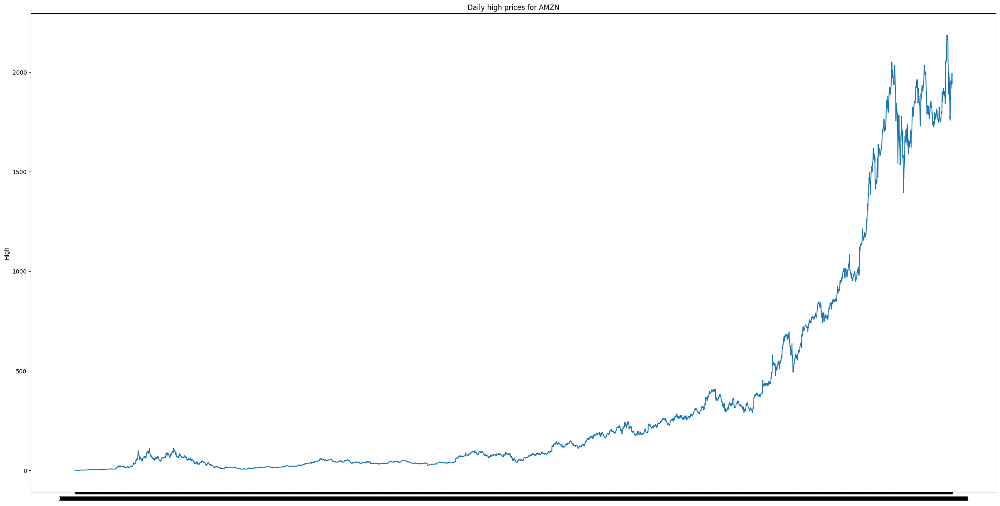

In [626]:
# Plot for high vs date
plt.figure(figsize=(30,15))
plt.plot(amazon['Date'], amazon["High"])
plt.ylabel("High")
plt.xlabel(None)
plt.title("Daily high prices for AMZN")

In [630]:
# First 5 rows of data
amazon.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1997-05-15,2.437500,2.500000,1.927083,1.958333,1.958333,72156000
1,1997-05-16,1.968750,1.979167,1.708333,1.729167,1.729167,14700000
2,1997-05-19,1.760417,1.770833,1.625000,1.708333,1.708333,6106800
3,1997-05-20,1.729167,1.750000,1.635417,1.635417,1.635417,5467200
4,1997-05-21,1.635417,1.645833,1.375000,1.427083,1.427083,18853200


In [631]:
# Info of data
amazon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5758 entries, 0 to 5757
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5758 non-null   object 
 1   Open       5758 non-null   float64
 2   High       5758 non-null   float64
 3   Low        5758 non-null   float64
 4   Close      5758 non-null   float64
 5   Adj Close  5758 non-null   float64
 6   Volume     5758 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 315.0+ KB


In [632]:
# Description of dataset
amazon.describe()

,Open,High,Low,Close,Adj Close,Volume
count,5758.000000,5758.000000,5758.000000,5758.000000,5758.000000,5.758000e+03
mean,340.458153,344.156408,336.344390,340.417580,340.417580,7.556094e+06
std,523.365374,528.138556,517.726971,523.140207,523.140207,7.325904e+06
min,1.406250,1.447917,1.312500,1.395833,1.395833,4.872000e+05
25%,37.460001,38.334999,36.812499,37.562500,37.562500,3.685525e+06
50%,81.965000,83.520000,79.875000,81.599998,81.599998,5.692450e+06
75%,335.267494,337.537491,331.727501,334.290001,334.290001,8.594350e+06
max,2173.070068,2185.949951,2161.120117,2170.219971,2170.219971,1.043292e+08


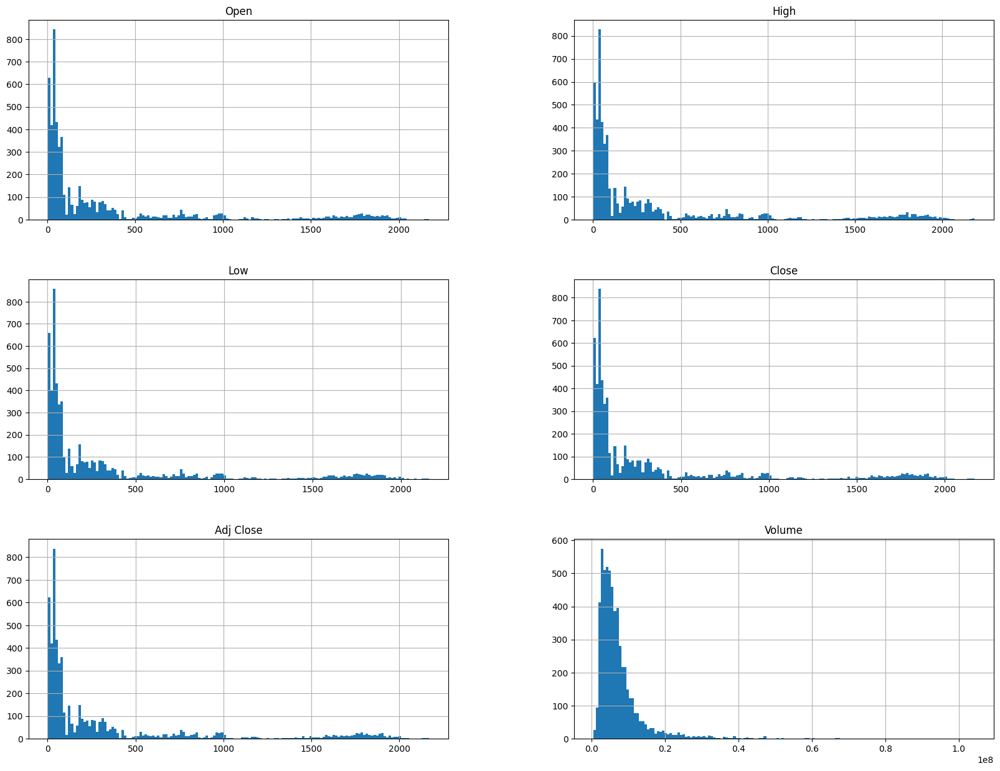

In [633]:
amazon.hist(bins = 150, figsize = (20,15))
plt.show()

# Mathematical Proof

In [4]:
# Vanilla RNN 
def vanilla_RNN (hidden_units, dense_units, input_shape, activation):
    model = Sequential()
    model.add(SimpleRNN(units = hidden_units, input_shape = input_shape, activation = activation[0]))
    model.add(Dense(units = dense_units, activation = activation[1]))
    model.compile(loss = "mean_squared_error", optimizer = "adam", metrics=tf.keras.metrics.MeanAbsoluteError())
    return model

In [5]:
# Instance of model
trial_model = vanilla_RNN(2,1,(3,1), activation = ["linear", "linear"])

In [6]:
# manual calculations of weight
wx = trial_model.get_weights()[0]
wh = trial_model.get_weights()[1]
bh = trial_model.get_weights()[2]
wy = trial_model.get_weights()[3]
by = trial_model.get_weights()[4]
 
print('wx = ', wx, ' wh = ', wh, ' bh = ', bh, ' wy =', wy, 'by = ', by)

wx =  [[ 0.01665068 -1.3290861 ]]  wh =  [[ 0.8968464   0.44234183]
 [ 0.44234183 -0.89684653]]  bh =  [0. 0.]  wy = [[-0.47285426]
 [ 1.267872  ]] by =  [0.]


In [7]:
# Demo data
x = np.array([1,2,3])
x_input = np.reshape(x,(1,3,1))
y_pred_vm = trial_model.predict(x_input)

m = 2
h0 = np.zeros(m)
h1 = np.dot(x[0], wx) + h0 + bh
h2 = np.dot(x[1], wx) + np.dot(h1,wh) + bh
h3 = np.dot(x[2], wx) + np.dot(h2,wh) + bh
o3 = np.dot(h3, wy) + by
 
print('h1 = ', h1,'h2 = ', h2,'h3 = ', h3)
 
print("Prediction from network ", y_pred_vm)
print("Prediction from our computation ", o3)

1/1 [==============================] - 0s 85ms/step
h1 =  [[ 0.01665068 -1.32908607]] h2 =  [[-0.53967591 -1.45882061]] h3 =  [[-1.07935176 -2.91764122]]
Prediction from network  [[-3.1888194]]
Prediction from our computation  [[-3.18881947]]


2022-11-20 22:25:40.618977: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


# Clean Data

In [635]:
# Function to clean and split data into training and testing data
def get_train_test(path, column, train_percent=0.95, val_percent = 0.8889):
    df = pd.read_csv(path)
    df_high = df[column]

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(df_high.values).reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(0, 1))
    stock_data = scaler.fit_transform(stock_data).flatten()
    n = len(stock_data)
    
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)

    return train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test = get_train_test(file_path, column = "High")

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/4066188050.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


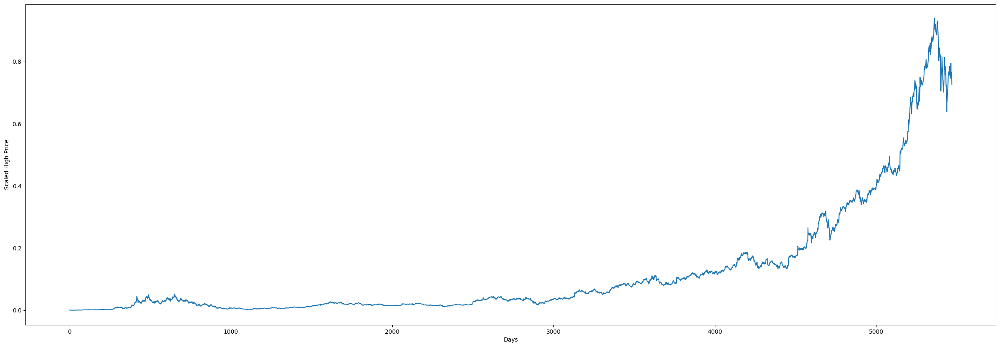

In [10]:
# Plot for scaled High prices vs Days
plt.subplots(figsize = (30,10))
plt.plot(train_data)
plt.xlabel("Days")
plt.ylabel("Scaled High Price")
plt.show()

In [11]:
# Checking length of training and testing set
print(f"length of train set: {len(train_data)/len(amazon)*100}")
print(f"length of test set: {len(test_data)/len(amazon)*100}")

length of train set: 94.99826328586315
length of test set: 5.001736714136853


# Create train and test data

In [636]:
# Function to split data into x and y sets
def create_data(data, time_step):

    sliding_data = []

    for index in range(len(data) - time_step):
        sliding_data.append(data[index: index + time_step])

    sliding_data = np.array(sliding_data)
    print(sliding_data[0].shape)
    x_data = sliding_data#[:,:-1]
    y_data = sliding_data[:, -1].reshape(-1,1)
    y_data = data[time_step:]

    return x_data, y_data

In [637]:
# Defining the time step
time_steps = 10

In [638]:
# Splitting data
x_train, y_train = create_data(train_data, time_steps)
x_test, y_test = create_data(test_data, time_steps)

(10, 1)
(10, 1)


# RNN

## Helper Functions

In [645]:
# Function to print RMSE figures for models
def print_error(y_train, y_test, train_predict, test_predict):    
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
    test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))
    # Print RMSE
    print('Train RMSE: %.3f RMSE' % (train_rmse))
    print('Test RMSE: %.3f RMSE' % (test_rmse))    


In [646]:
# Function for Plotting Loss vs Epochs
def loss_epoch(history):
    plt.figure(figsize =(10,7))
    plt.plot(history.history["loss"])
    plt.xlabel("Epochs")
    plt.ylabel("Losses")
    plt.title("Simple RNN model, Loss vs Epoch")
    plt.show()

In [647]:
# Function for Plotting Accuracy vs Epochs
def MAE_epoch(history):
    plt.figure(figsize =(10,7))
    plt.plot(history.history["loss"])
    plt.xlabel("Epochs")
    plt.ylabel("Accuracies")
    plt.title("Simple RNN model, MAE vs Epoch")
    plt.show()

In [648]:
#  Function to Plot the result
def plot_result(y_train, y_test, train_predict, test_predict):
    actual = np.append(y_train, y_test)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 10), dpi=80)
    plt.plot(range(rows), actual, c = "b")
    plt.plot(range(rows), predictions, c = "r")
    plt.axvline(x=len(y_train), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Observation number after given time steps')
    plt.ylabel('Open Values scaled')
    plt.title('Actual and Predicted Values. The Red Line Separates The Training And Test Examples')


## Vanilla RNN

In [639]:
# Implementation of basic RNN model
model = vanilla_RNN(hidden_units=1, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'tanh'])
history = model.fit(x_train, y_train, validation_data = (x_test, y_test), epochs=30, batch_size=20, verbose=2)

Epoch 1/30
273/273 - 2s - loss: 0.0198 - mean_absolute_error: 0.0692 - val_loss: 0.0810 - val_mean_absolute_error: 0.2796 - 2s/epoch - 7ms/step
Epoch 2/30
273/273 - 0s - loss: 0.0023 - mean_absolute_error: 0.0252 - val_loss: 0.0523 - val_mean_absolute_error: 0.2237 - 201ms/epoch - 737us/step
Epoch 3/30
273/273 - 0s - loss: 0.0016 - mean_absolute_error: 0.0210 - val_loss: 0.0365 - val_mean_absolute_error: 0.1854 - 185ms/epoch - 676us/step
Epoch 4/30
273/273 - 0s - loss: 0.0013 - mean_absolute_error: 0.0196 - val_loss: 0.0360 - val_mean_absolute_error: 0.1845 - 184ms/epoch - 673us/step
Epoch 5/30
273/273 - 0s - loss: 0.0011 - mean_absolute_error: 0.0180 - val_loss: 0.0271 - val_mean_absolute_error: 0.1587 - 188ms/epoch - 689us/step
Epoch 6/30
273/273 - 0s - loss: 0.0010 - mean_absolute_error: 0.0175 - val_loss: 0.0288 - val_mean_absolute_error: 0.1644 - 182ms/epoch - 667us/step
Epoch 7/30
273/273 - 0s - loss: 9.1348e-04 - mean_absolute_error: 0.0163 - val_loss: 0.0232 - val_mean_absolute

In [640]:
history.history["loss"]

[0.019821885973215103,
 0.0022882644552737474,
 0.001601528376340866,
 0.0013093897141516209,
 0.001123121939599514,
 0.0010112585732713342,
 0.0009134812280535698,
 0.0008496962836943567,
 0.0007889082771725953,
 0.000735544366762042,
 0.0007126640412025154,
 0.0006758994422852993,
 0.0006298310472629964,
 0.0006034332909621298,
 0.0005804577376693487,
 0.000548279844224453,
 0.0005282482597976923,
 0.0004940374055877328,
 0.00047606596490368247,
 0.00044961294042877853,
 0.0004298586572986096,
 0.00041316013084724545,
 0.00039596532587893307,
 0.00036865074071101844,
 0.0003514214185997844,
 0.0003347351448610425,
 0.0003206093970220536,
 0.0003045489138457924,
 0.00029143711435608566,
 0.0002844576083589345]

In [641]:
# make predictions
train_predict = model.predict(x_train)
test_predict = model.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict, test_predict)

9/9 [==============================] - 0s 530us/step
Train RMSE: 0.017 RMSE
Test RMSE: 0.083 RMSE


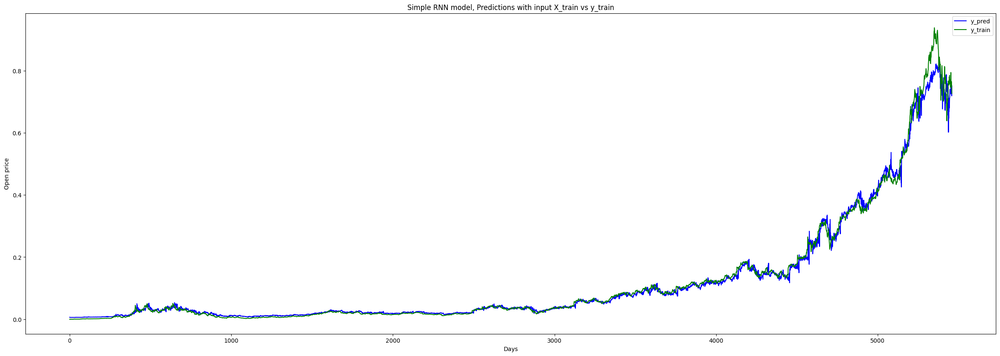

In [642]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

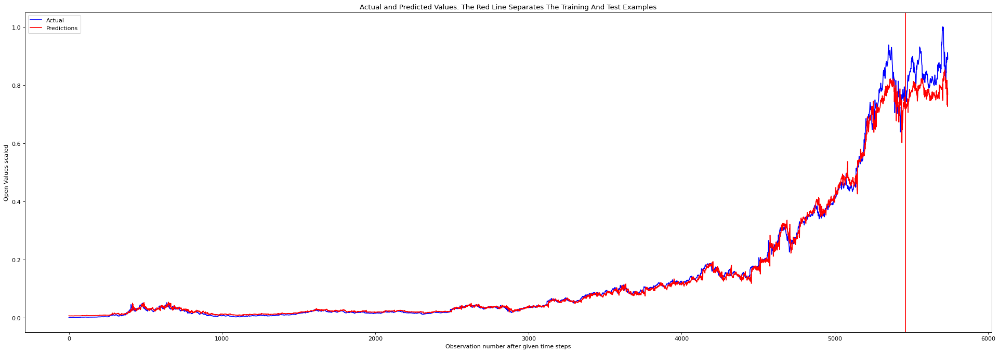

In [643]:
plot_result(y_train, y_test, train_predict, test_predict)

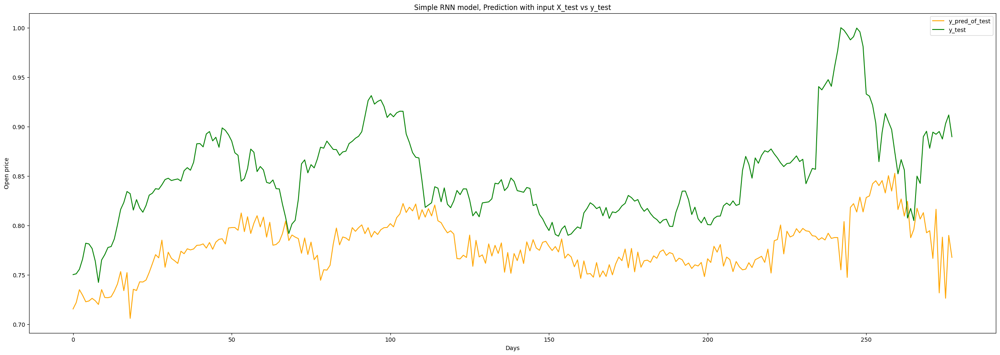

In [644]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

In [15]:
# Implementation of basic RNN model
model2 = vanilla_RNN(hidden_units=64, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'tanh'])
history = model2.fit(x_train, y_train, validation_data = (x_test, y_test), epochs=30, batch_size=20, verbose=2)

Epoch 1/30
273/273 - 1s - loss: 0.0018 - mean_absolute_error: 0.0199 - val_loss: 0.0064 - val_mean_absolute_error: 0.0742 - 751ms/epoch - 3ms/step
Epoch 2/30
273/273 - 0s - loss: 1.5818e-04 - mean_absolute_error: 0.0066 - val_loss: 0.0018 - val_mean_absolute_error: 0.0328 - 252ms/epoch - 924us/step
Epoch 3/30
273/273 - 0s - loss: 1.4047e-04 - mean_absolute_error: 0.0064 - val_loss: 0.0036 - val_mean_absolute_error: 0.0528 - 259ms/epoch - 947us/step
Epoch 4/30
273/273 - 0s - loss: 1.2051e-04 - mean_absolute_error: 0.0056 - val_loss: 0.0013 - val_mean_absolute_error: 0.0268 - 275ms/epoch - 1ms/step
Epoch 5/30
273/273 - 0s - loss: 1.1458e-04 - mean_absolute_error: 0.0055 - val_loss: 0.0026 - val_mean_absolute_error: 0.0434 - 245ms/epoch - 897us/step
Epoch 6/30
273/273 - 0s - loss: 9.9916e-05 - mean_absolute_error: 0.0051 - val_loss: 0.0014 - val_mean_absolute_error: 0.0285 - 239ms/epoch - 876us/step
Epoch 7/30
273/273 - 0s - loss: 9.8001e-05 - mean_absolute_error: 0.0052 - val_loss: 0.003

In [80]:
# Losses
history.history["loss"]

[0.001019437680952251,
 0.0001359110465273261,
 0.0001045576500473544,
 0.00011181593436049297,
 0.00013547952403314412,
 8.71366064529866e-05,
 8.052748307818547e-05,
 8.163445454556495e-05,
 7.965949043864384e-05,
 7.876152085373178e-05,
 6.868160562589765e-05,
 7.018912583589554e-05,
 7.201118569355458e-05,
 6.790326733607799e-05,
 6.537180161103606e-05,
 6.225497054401785e-05,
 5.619570583803579e-05,
 5.892327317269519e-05,
 5.783426604466513e-05,
 6.456198025261983e-05,
 5.576363400905393e-05,
 5.827150016557425e-05,
 5.458770101540722e-05,
 5.070026236353442e-05,
 4.5426284486893564e-05,
 4.886486567556858e-05,
 4.341416570241563e-05,
 4.361164246802218e-05,
 4.4216485548531637e-05,
 5.2653864258900285e-05]

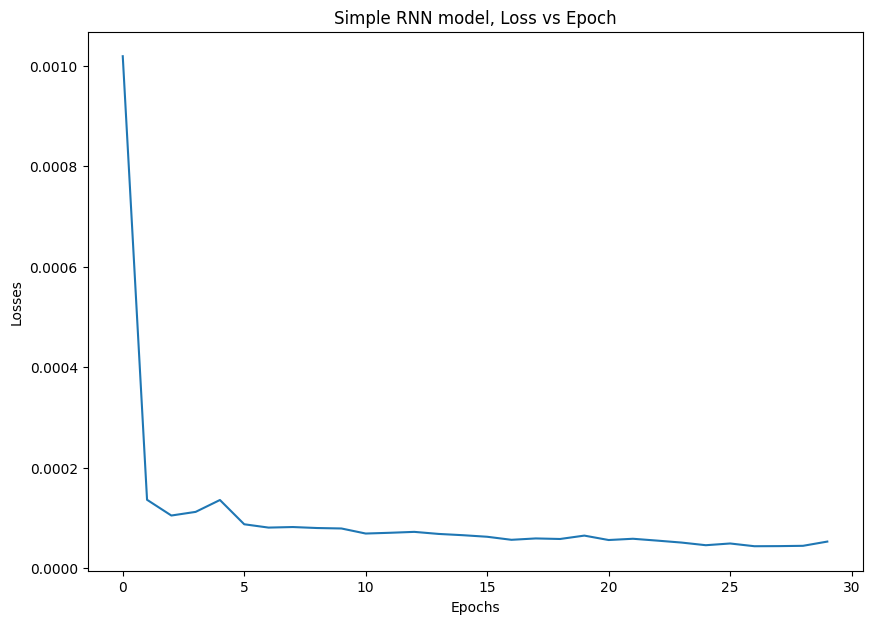

In [85]:
loss_epoch(history)

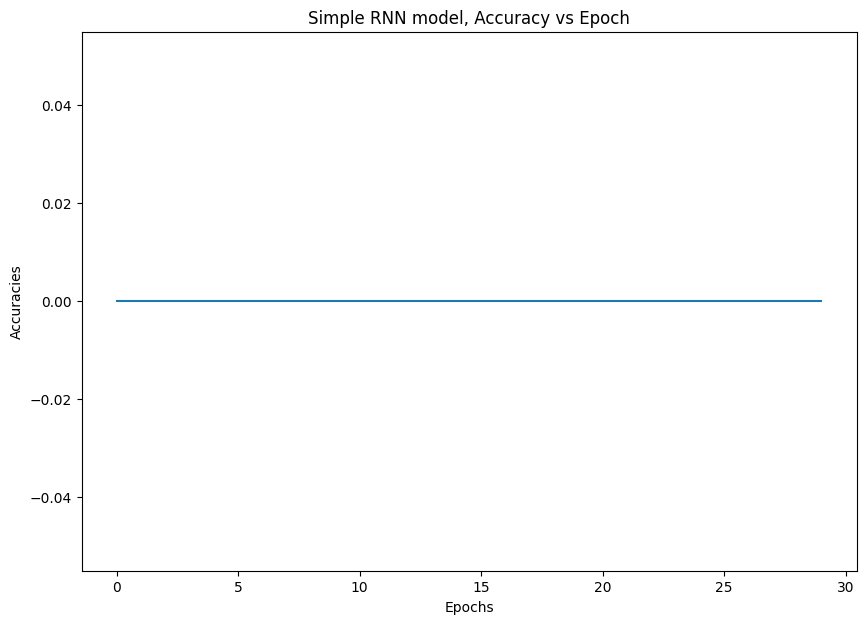

In [86]:
MAE_epoch(history)

In [87]:
# make predictions
train_predict = model2.predict(x_train)
test_predict = model2.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict, test_predict)

9/9 [==============================] - 0s 566us/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.027 RMSE


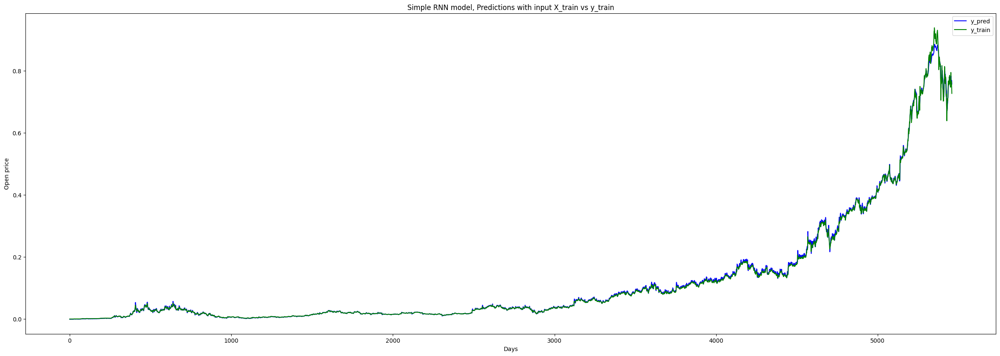

In [88]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

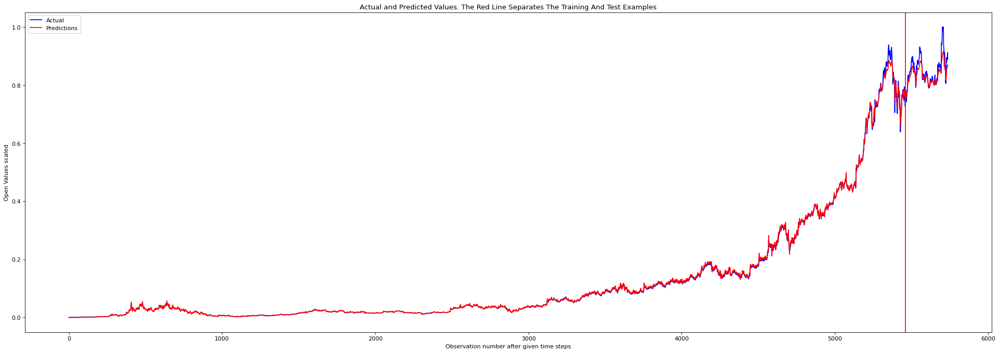

In [89]:
plot_result(y_train, y_test, train_predict, test_predict)

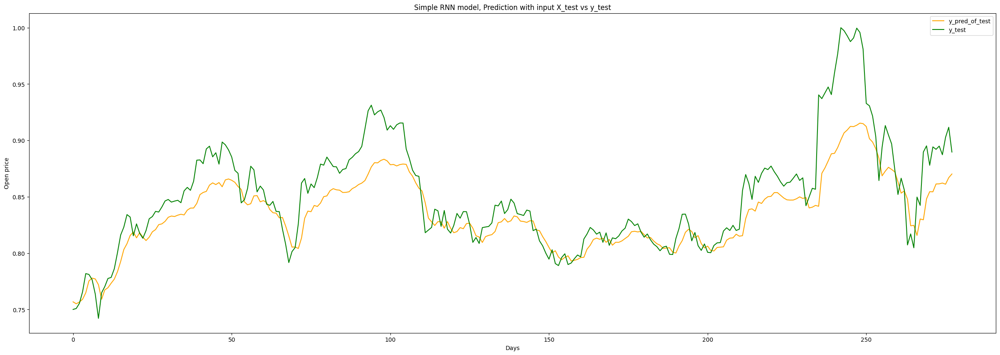

In [90]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

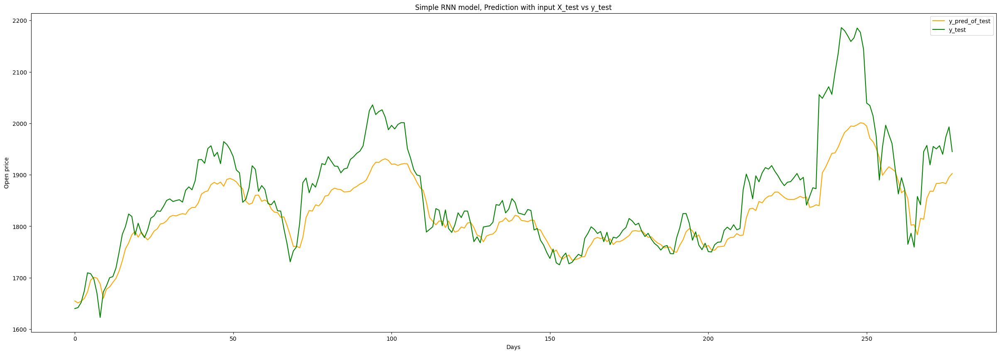

In [91]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler.inverse_transform(test_predict), label = "y_pred_of_test", c = "orange")
plt.plot(scaler.inverse_transform(y_test), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

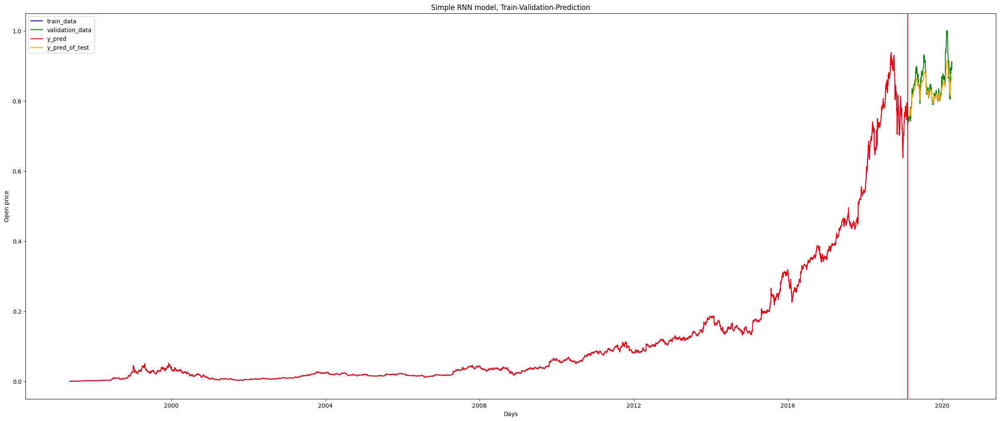

In [93]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.axvline(x=df_dates_train[-1], color='r')
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Train-Validation-Prediction")
plt.legend()
plt.show()

## Stacked Implementation

In [39]:
# Stacked RNN
def stacked_RNN (hidden_units, dense_units, input_shape, activation):
    model = Sequential()
    model.add(SimpleRNN(units = hidden_units, return_sequences=True, input_shape = input_shape, activation = activation[0]))
    model.add(SimpleRNN(units = hidden_units, activation = activation[0]))
    model.add(Dense(units = dense_units, activation = activation[1]))
    model.compile(loss = "mean_squared_error", optimizer = "adam", metrics=tf.keras.metrics.MeanAbsoluteError())
    return model

In [210]:
# Running instance of stacked RNN
model_stacked_RNN = stacked_RNN(hidden_units=64, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'tanh'])
history_stacked_RNN = model_stacked_RNN.fit(x_train, y_train, validation_data=(x_test, y_test) ,epochs=30, batch_size=20, verbose=2)

Epoch 1/30
273/273 - 1s - loss: 0.0012 - accuracy: 0.0000e+00 - val_loss: 0.0026 - val_accuracy: 0.0036 - 1s/epoch - 5ms/step
Epoch 2/30
273/273 - 0s - loss: 1.3147e-04 - accuracy: 0.0000e+00 - val_loss: 0.0018 - val_accuracy: 0.0036 - 471ms/epoch - 2ms/step
Epoch 3/30
273/273 - 0s - loss: 1.1071e-04 - accuracy: 0.0000e+00 - val_loss: 0.0040 - val_accuracy: 0.0036 - 463ms/epoch - 2ms/step
Epoch 4/30
273/273 - 1s - loss: 1.1861e-04 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0036 - 525ms/epoch - 2ms/step
Epoch 5/30
273/273 - 0s - loss: 1.1516e-04 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0036 - 500ms/epoch - 2ms/step
Epoch 6/30
273/273 - 0s - loss: 9.7392e-05 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0036 - 497ms/epoch - 2ms/step
Epoch 7/30
273/273 - 1s - loss: 8.0852e-05 - accuracy: 0.0000e+00 - val_loss: 0.0019 - val_accuracy: 0.0036 - 502ms/epoch - 2ms/step
Epoch 8/30
273/273 - 0s - loss: 7.2716e-05 - accuracy: 0.0000e+00 - val_loss

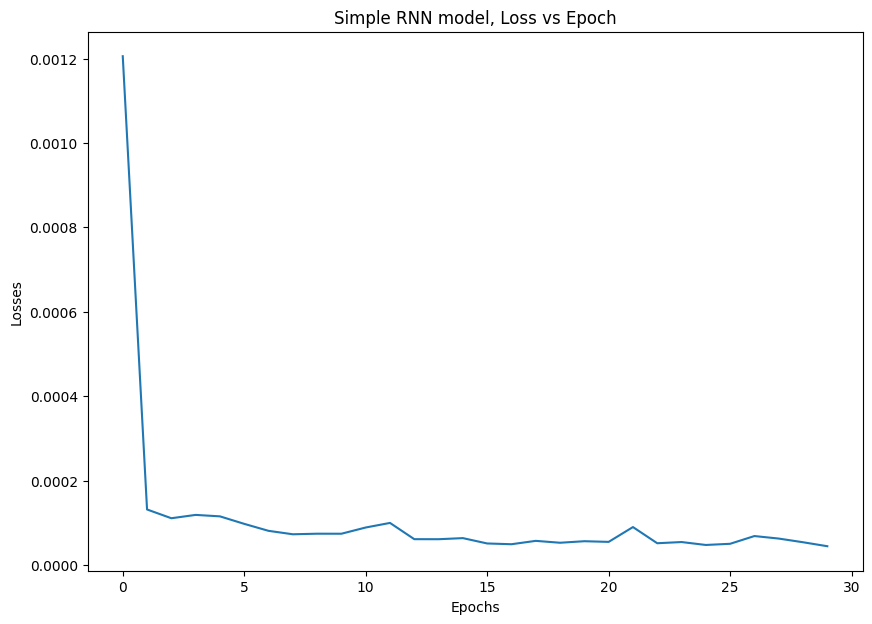

In [211]:
loss_epoch(history_stacked_RNN)

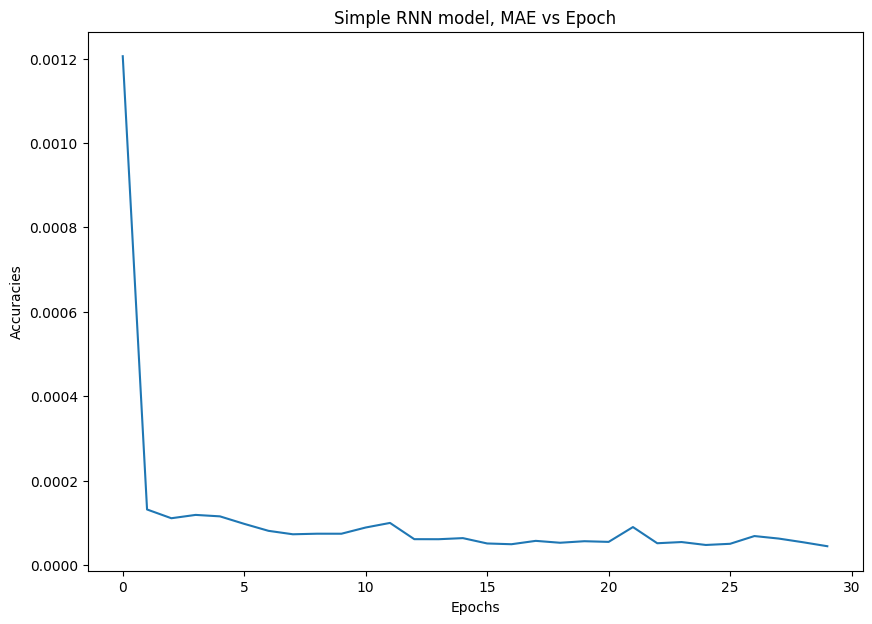

In [212]:
MAE_epoch(history_stacked_RNN)

In [213]:
# make predictions
train_predict_stacked = model_stacked_RNN.predict(x_train)
test_predict_stacked = model_stacked_RNN.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_stacked, test_predict_stacked)

9/9 [==============================] - 0s 695us/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.035 RMSE


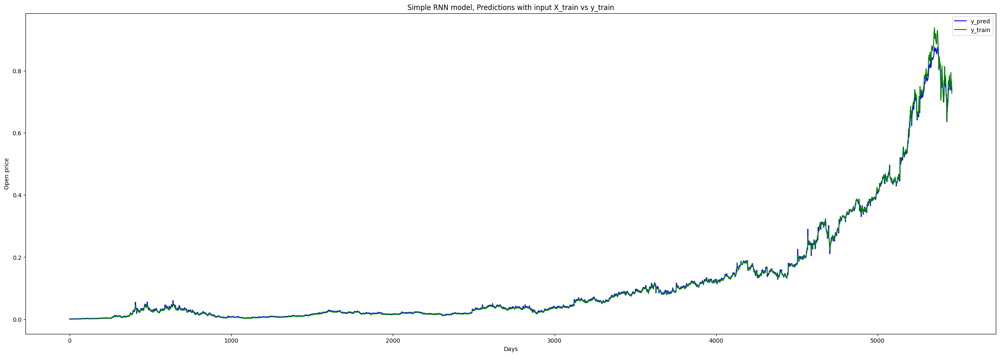

In [214]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict_stacked, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

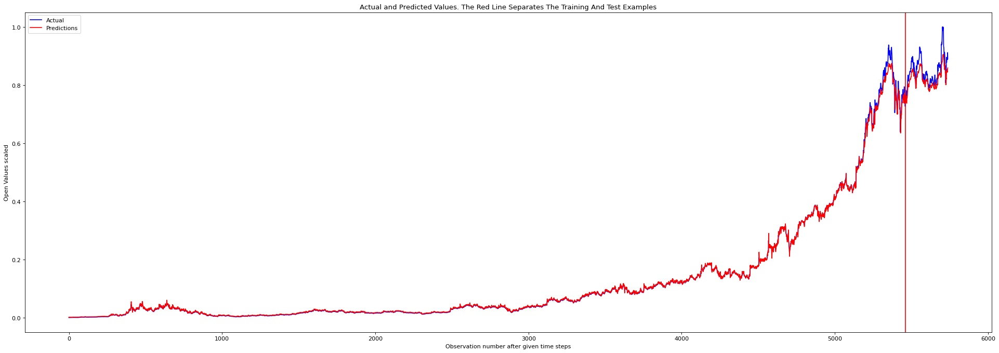

In [215]:
plot_result(y_train, y_test, train_predict_stacked, test_predict_stacked)

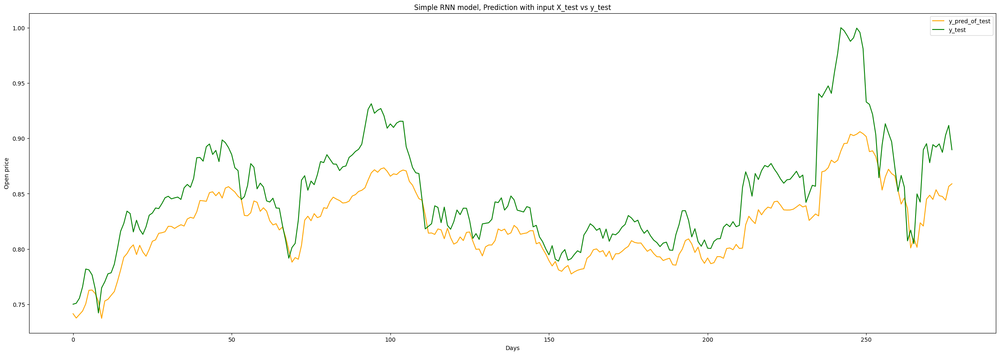

In [216]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_stacked, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

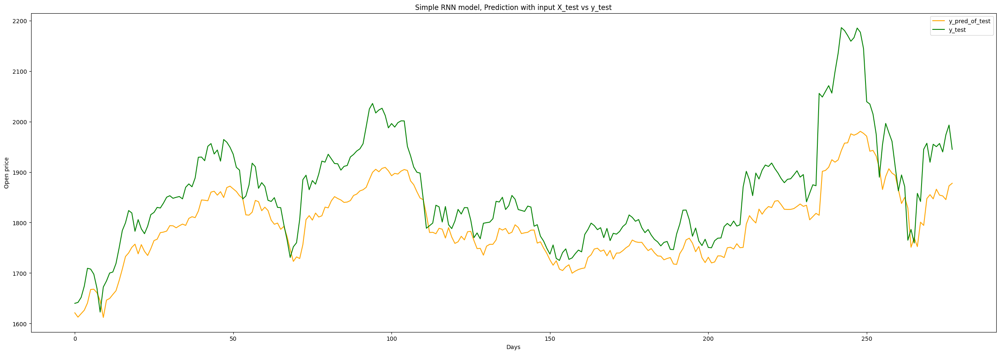

In [217]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler.inverse_transform(test_predict_stacked), label = "y_pred_of_test", c = "orange")
plt.plot(scaler.inverse_transform(y_test), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

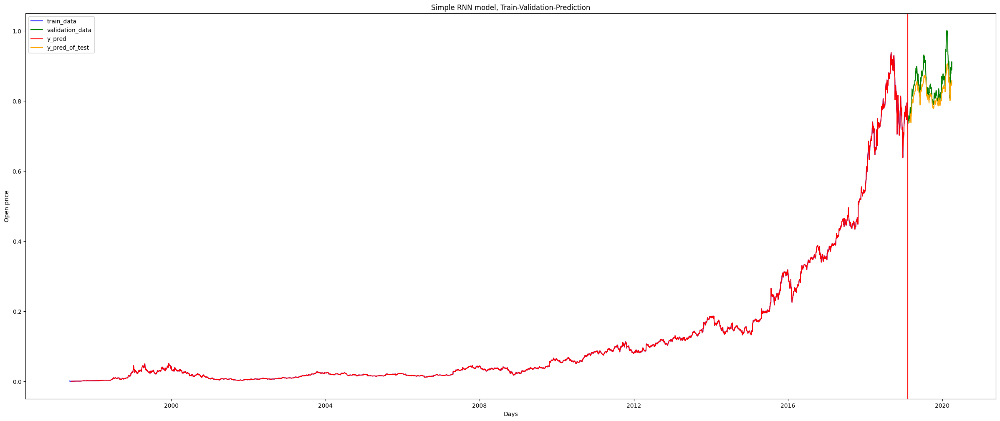

In [218]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.axvline(x=df_dates_train[-1], color='r')
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict_stacked, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Train-Validation-Prediction")
plt.legend()
plt.show()

# LSTM

## Vanilla Implementation

In [94]:
from keras.layers import LSTM

In [106]:
# Create vanilla LSTM Model
def vanilla_LSTM():
    model_lstm = Sequential()
    model_lstm.add(LSTM(64,return_sequences=False,input_shape = (x_train.shape[1],1))) #64 lstm neuron block
    model_lstm.add(Dense(1))
    model_lstm.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_lstm

In [107]:
# Running instance of vanilla model
model_lstm = vanilla_LSTM()
history_lstm = model_lstm.fit(x_train, y_train, validation_data=(x_test, y_test), epochs = 50, batch_size = 10)

Epoch 1/50
546/546 [==============================] - 2s 2ms/step - loss: 8.1097e-04 - mean_absolute_error: 0.0100 - val_loss: 6.1565e-04 - val_mean_absolute_error: 0.0183
Epoch 2/50
546/546 [==============================] - 1s 2ms/step - loss: 9.9717e-05 - mean_absolute_error: 0.0060 - val_loss: 7.6596e-04 - val_mean_absolute_error: 0.0216
Epoch 3/50
546/546 [==============================] - 1s 2ms/step - loss: 8.3136e-05 - mean_absolute_error: 0.0052 - val_loss: 0.0013 - val_mean_absolute_error: 0.0300
Epoch 4/50
546/546 [==============================] - 1s 2ms/step - loss: 7.1651e-05 - mean_absolute_error: 0.0049 - val_loss: 0.0012 - val_mean_absolute_error: 0.0303
Epoch 5/50
546/546 [==============================] - 1s 1ms/step - loss: 7.8778e-05 - mean_absolute_error: 0.0052 - val_loss: 8.5927e-04 - val_mean_absolute_error: 0.0244
Epoch 6/50
546/546 [==============================] - 1s 1ms/step - loss: 6.2611e-05 - mean_absolute_error: 0.0045 - val_loss: 4.4916e-04 - val_mean

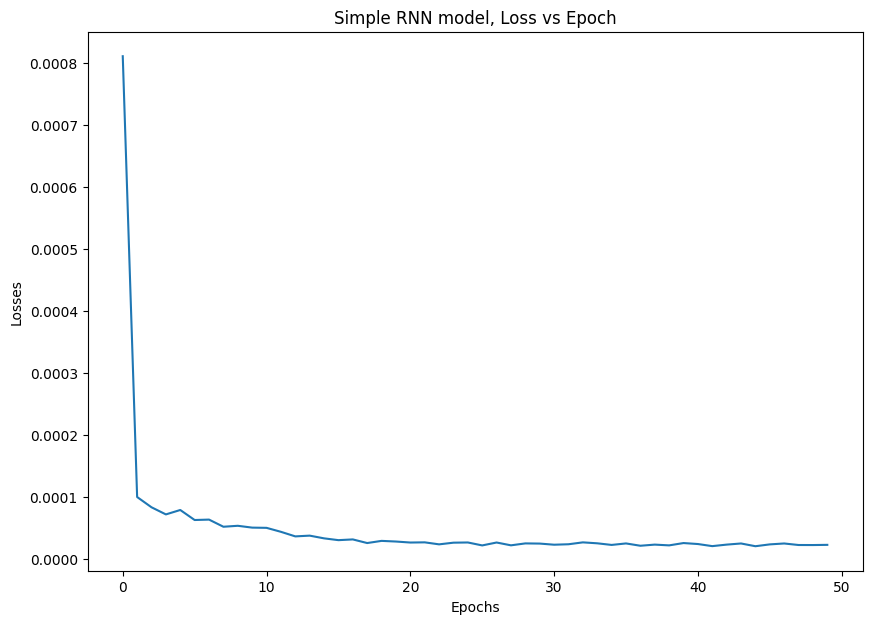

In [108]:
loss_epoch(history_lstm)

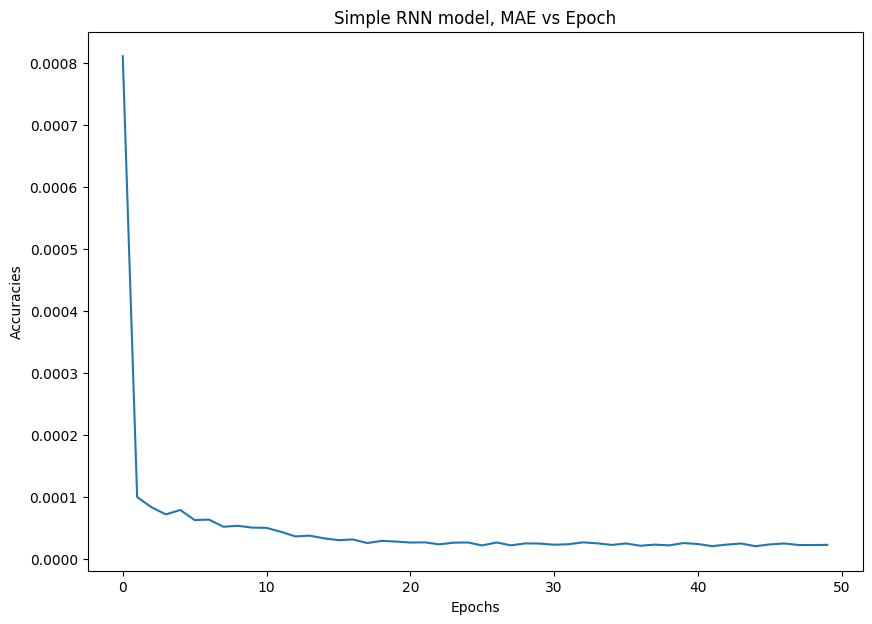

In [123]:
MAE_epoch(history_lstm)

In [111]:
# make predictions
train_predict_lstm = model_lstm.predict(x_train)
test_predict_lstm = model_lstm.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_lstm, test_predict_lstm)

9/9 [==============================] - 0s 987us/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


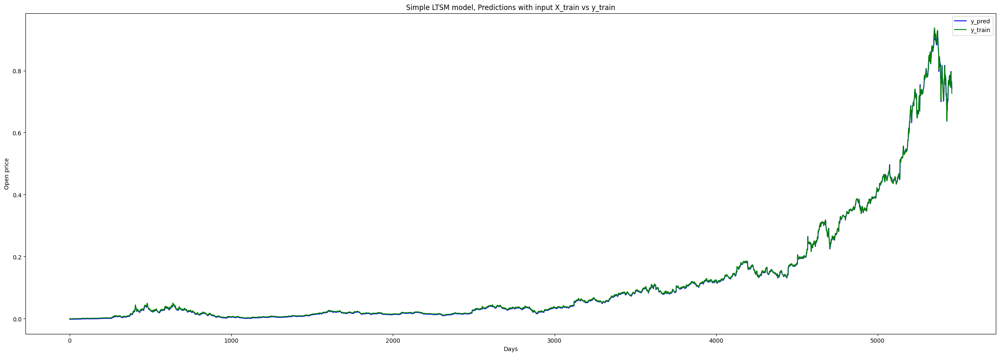

In [112]:
# Visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict_lstm, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple LTSM model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

In [ ]:
plot_result(y_train, y_test, train_predict_lstm, test_predict_lstm)

9/9 [==============================] - 0s 1ms/step


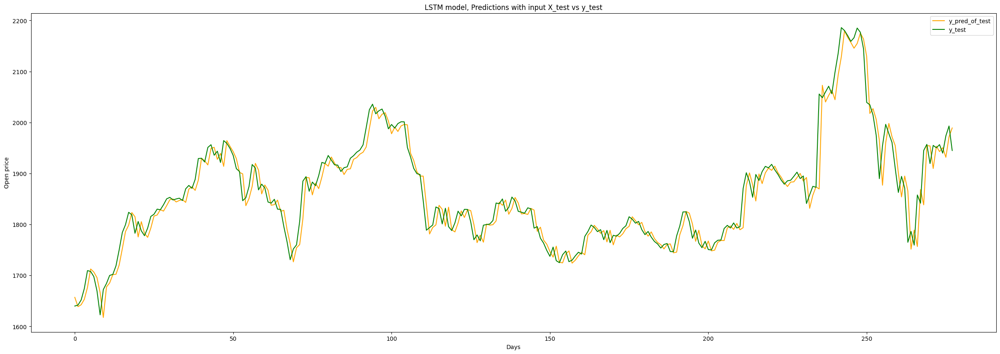

In [116]:
# Visualisation
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(model_lstm.predict(x_test)), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

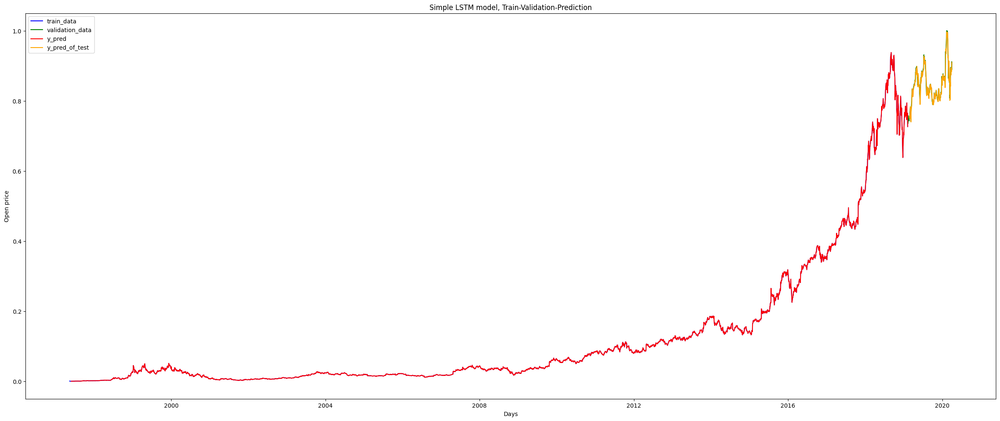

In [114]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict_lstm, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple LSTM model, Train-Validation-Prediction")
plt.legend()
plt.show()

## Stacked LSTM

In [144]:
# Stacked LSTM Model
def stacked_LSTM():
    model_lstm = Sequential()
    model_lstm.add(LSTM(64,return_sequences=True,input_shape = (x_train.shape[1],1))) #64 lstm neuron block
    model_lstm.add(LSTM(64, return_sequences= False))
    # model_lstm.add(Dense(32))
    model_lstm.add(Dense(1))
    model_lstm.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_lstm

In [145]:
# Running instance of stacked LSTM
model_lstm_stacked = stacked_LSTM()
history_lstm_stacked = model_lstm_stacked.fit(x_train, y_train, validation_data= (x_test, y_test) , epochs = 10, batch_size = 10)

Epoch 1/10
546/546 [==============================] - 3s 4ms/step - loss: 5.7949e-04 - mean_absolute_error: 0.0115 - val_loss: 9.9114e-04 - val_mean_absolute_error: 0.0244
Epoch 2/10
546/546 [==============================] - 2s 3ms/step - loss: 1.7903e-04 - mean_absolute_error: 0.0082 - val_loss: 9.0101e-04 - val_mean_absolute_error: 0.0233
Epoch 3/10
546/546 [==============================] - 2s 3ms/step - loss: 1.2434e-04 - mean_absolute_error: 0.0067 - val_loss: 6.3441e-04 - val_mean_absolute_error: 0.0188
Epoch 4/10
546/546 [==============================] - 2s 3ms/step - loss: 1.2022e-04 - mean_absolute_error: 0.0066 - val_loss: 8.6632e-04 - val_mean_absolute_error: 0.0233
Epoch 5/10
546/546 [==============================] - 2s 3ms/step - loss: 1.1094e-04 - mean_absolute_error: 0.0061 - val_loss: 5.2746e-04 - val_mean_absolute_error: 0.0169
Epoch 6/10
546/546 [==============================] - 2s 3ms/step - loss: 9.5757e-05 - mean_absolute_error: 0.0059 - val_loss: 8.3593e-04 - 

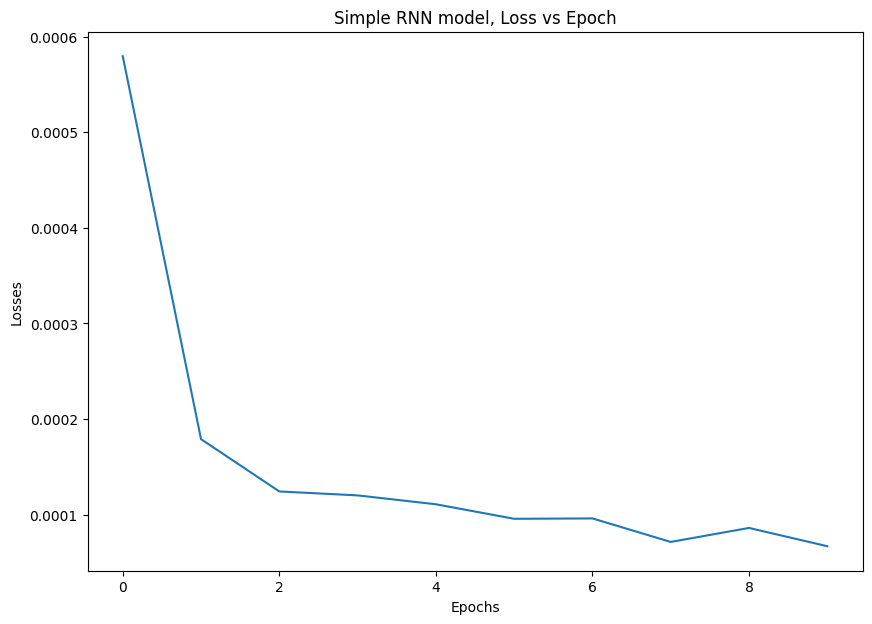

In [146]:
loss_epoch(history_lstm_stacked)

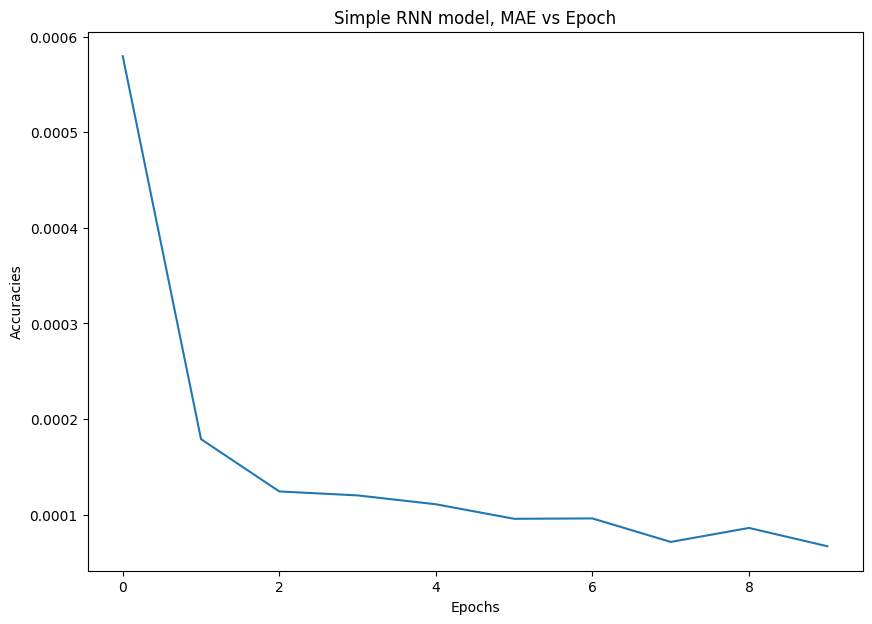

In [147]:
MAE_epoch(history_lstm_stacked)

In [148]:
# make predictions
train_predict_lstm = model_lstm_stacked.predict(x_train)
test_predict_lstm = model_lstm_stacked.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_lstm, test_predict_lstm)

9/9 [==============================] - 0s 2ms/step
Train RMSE: 0.008 RMSE
Test RMSE: 0.019 RMSE


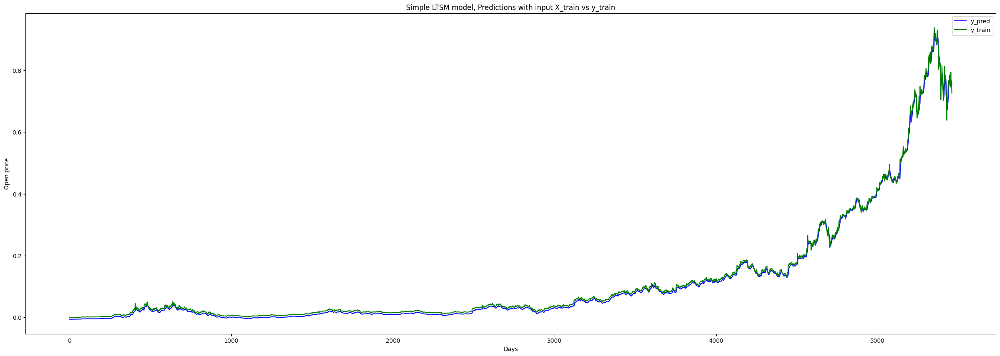

In [149]:
# Visualisations
plt.figure(figsize = (30,10))
plt.plot(train_predict_lstm, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple LTSM model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

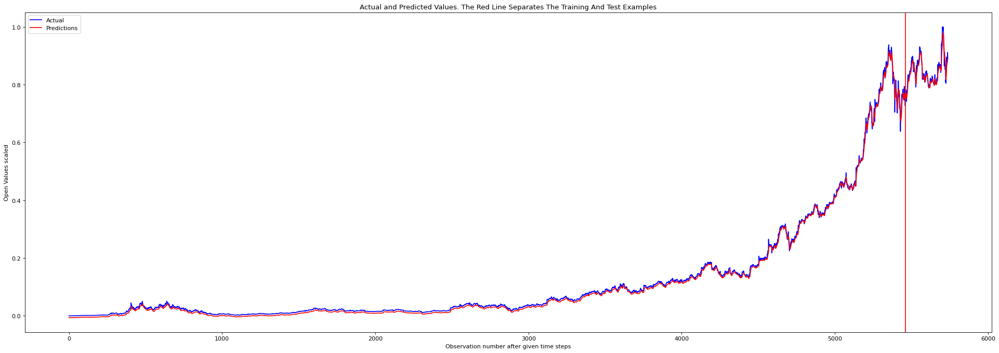

In [153]:
plot_result(y_train, y_test, train_predict_lstm, test_predict_lstm)

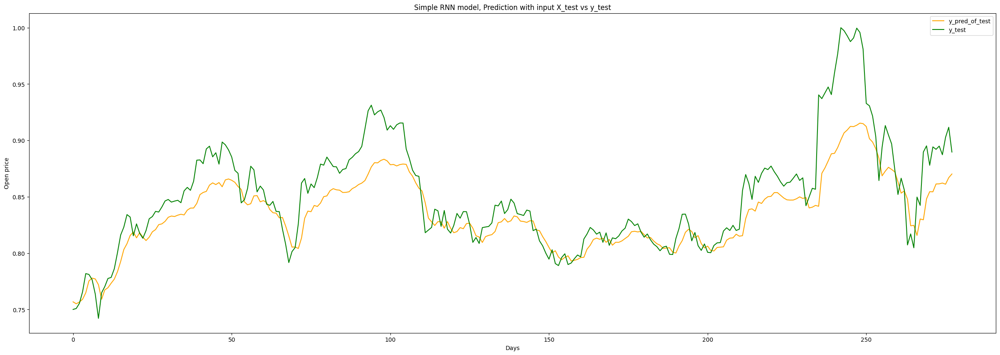

In [150]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

9/9 [==============================] - 0s 2ms/step


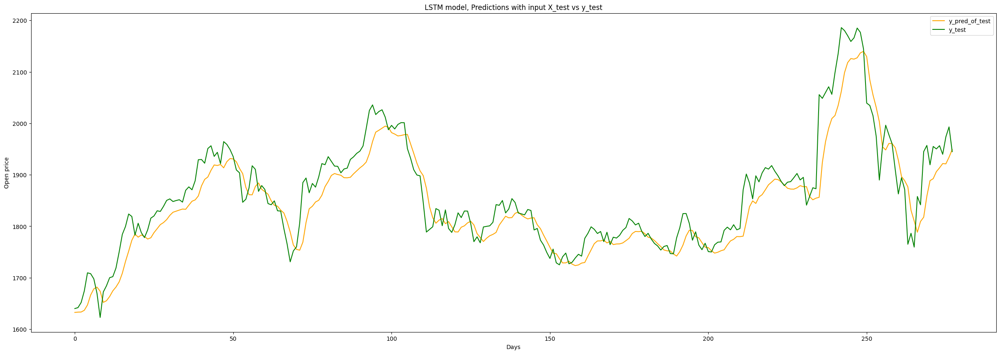

In [151]:
# Visualisations
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(model_lstm_stacked.predict(x_test)), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

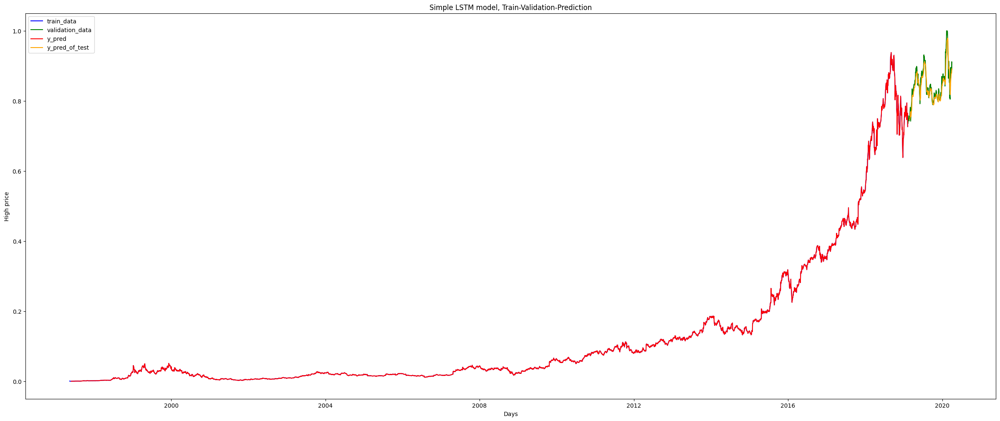

In [152]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict_lstm, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("High price")
plt.title("Simple LSTM model, Train-Validation-Prediction")
plt.legend()
plt.show()

# GRU

## Vanilla Implementation

In [154]:
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, GRU

In [20]:
# Vanilla GRU model
def vanilla_GRU(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=64, return_sequences=False, input_shape=(x_train.shape[1],1), activation='tanh'))
    # model_gru.add(GRU(units=50, activation='tanh'))
    model_gru.add(Dense(units=1))

    # Compiling the RNN
    model_gru.compile(optimizer="adam",loss='mean_squared_error', metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [156]:
# Running instance of the model
model_gru = vanilla_GRU(x_train)
history_gru = model_gru.fit(x_train,y_train,validation_data=(x_test, y_test), epochs=50,batch_size=20, verbose=2)


Epoch 1/50
273/273 - 2s - loss: 0.0023 - mean_absolute_error: 0.0142 - val_loss: 4.3233e-04 - val_mean_absolute_error: 0.0148 - 2s/epoch - 6ms/step
Epoch 2/50
273/273 - 0s - loss: 4.4920e-05 - mean_absolute_error: 0.0035 - val_loss: 3.9114e-04 - val_mean_absolute_error: 0.0141 - 438ms/epoch - 2ms/step
Epoch 3/50
273/273 - 0s - loss: 4.8761e-05 - mean_absolute_error: 0.0039 - val_loss: 3.8996e-04 - val_mean_absolute_error: 0.0146 - 400ms/epoch - 1ms/step
Epoch 4/50
273/273 - 0s - loss: 4.3744e-05 - mean_absolute_error: 0.0037 - val_loss: 3.5950e-04 - val_mean_absolute_error: 0.0139 - 422ms/epoch - 2ms/step
Epoch 5/50
273/273 - 0s - loss: 4.1934e-05 - mean_absolute_error: 0.0037 - val_loss: 9.1681e-04 - val_mean_absolute_error: 0.0263 - 411ms/epoch - 2ms/step
Epoch 6/50
273/273 - 0s - loss: 4.1158e-05 - mean_absolute_error: 0.0036 - val_loss: 2.8296e-04 - val_mean_absolute_error: 0.0119 - 424ms/epoch - 2ms/step
Epoch 7/50
273/273 - 0s - loss: 3.7962e-05 - mean_absolute_error: 0.0034 - va

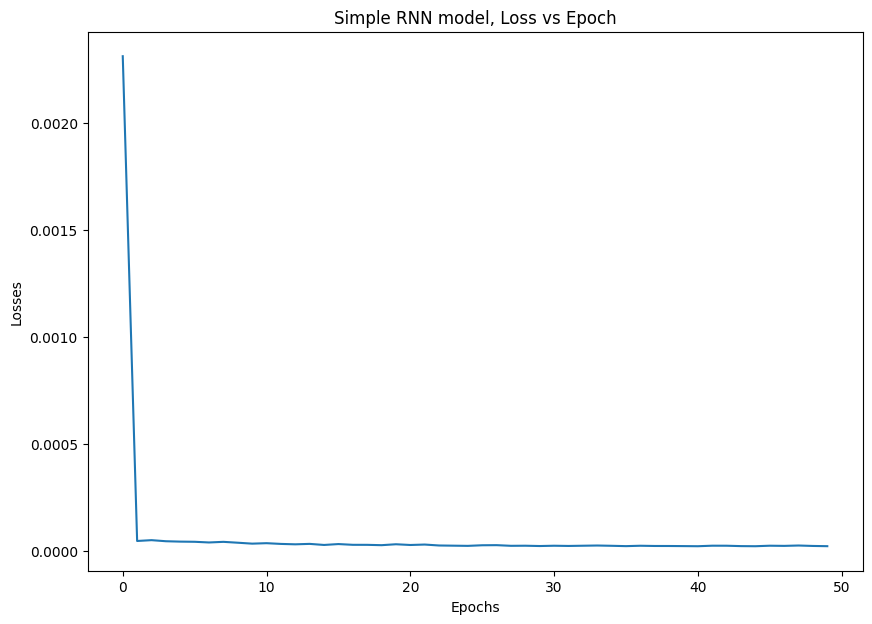

In [157]:
loss_epoch(history_gru)

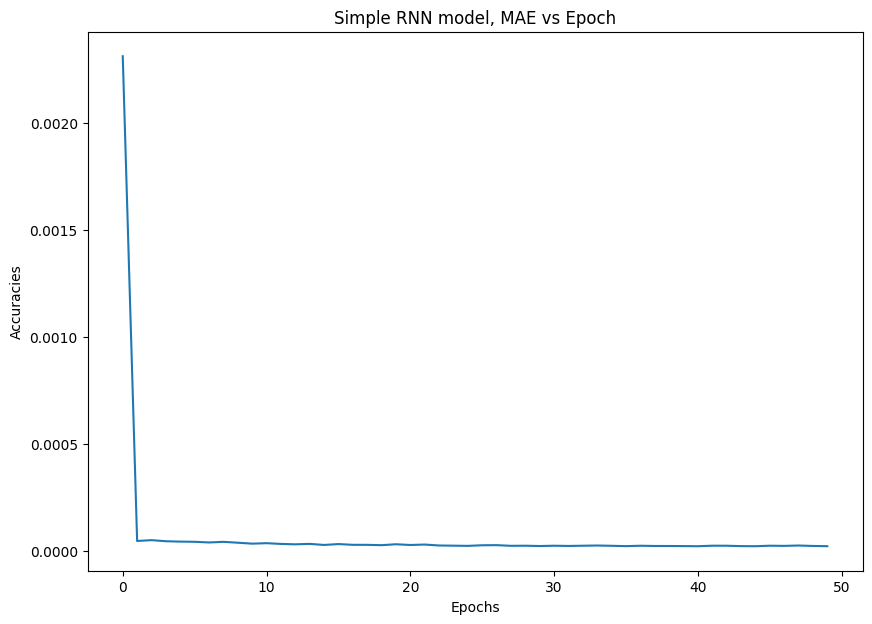

In [158]:
MAE_epoch(history_gru)

In [159]:
# make predictions
train_predict_gru = model_gru.predict(x_train)
test_predict_gru = model_gru.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru, test_predict_gru)

9/9 [==============================] - 0s 880us/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


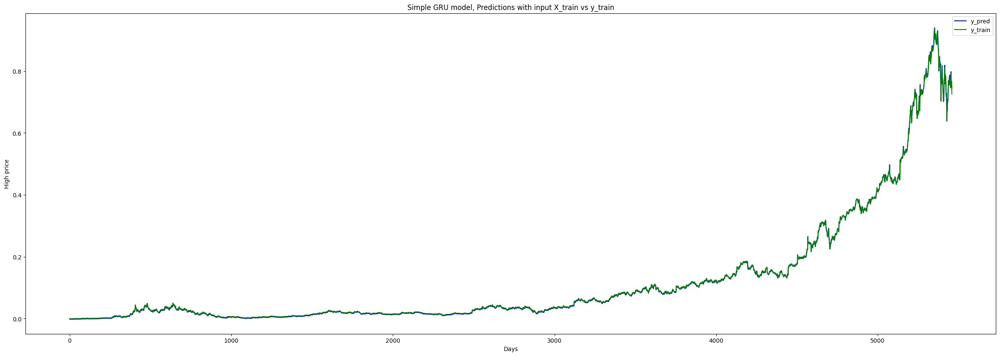

In [160]:
plt.figure(figsize = (30,10))
plt.plot(train_predict_gru, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("High price")
plt.title("Simple GRU model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

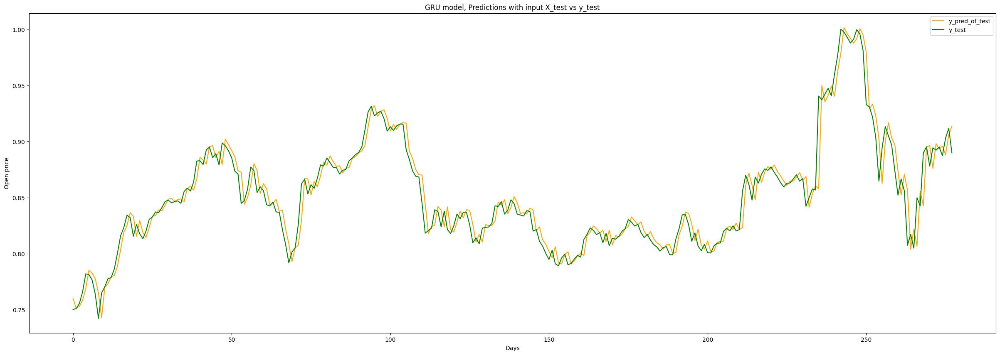

In [163]:
plt.subplots(figsize =(30,10))
plt.plot(test_predict_gru, label = "y_pred_of_test", c = "orange" )
plt.plot(y_test, label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("GRU model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

9/9 [==============================] - 0s 966us/step


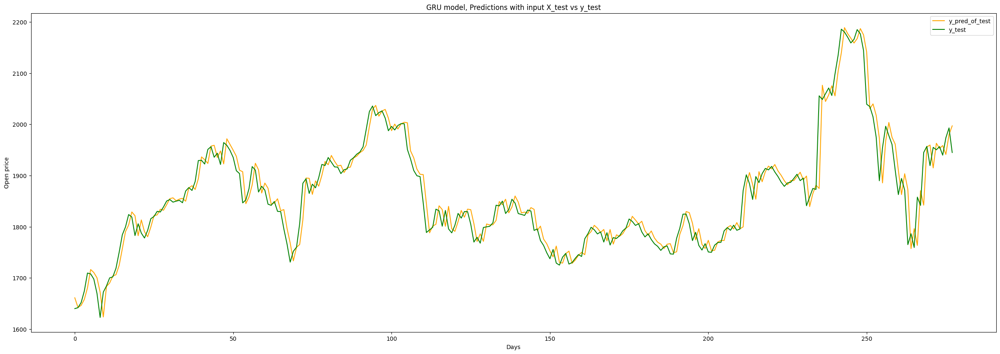

In [165]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(model_gru.predict(x_test)), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("GRU model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

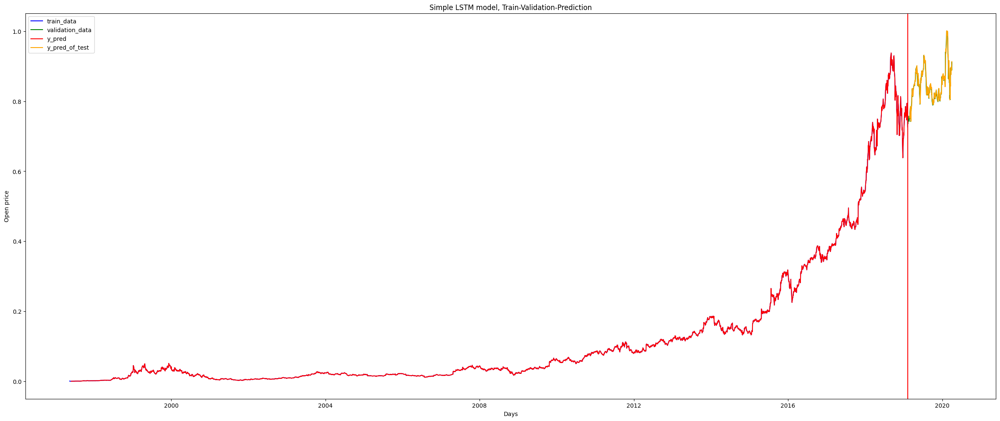

In [166]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.axvline(x=df_dates_train[-1], color='r')
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict_gru, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple LSTM model, Train-Validation-Prediction")
plt.legend()
plt.show()

## Stacked Implementation

In [34]:
def stacked_GRU():
    model_gru = Sequential()
    model_gru.add(GRU(64,return_sequences=True,input_shape = (x_train.shape[1],1))) #64 lstm neuron block
    model_gru.add(GRU(64, return_sequences= False))
    # model_lstm.add(Dense(32))
    model_gru.add(Dense(1))
    model_gru.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [169]:
model_gru_stacked = stacked_GRU()
history_gru_stacked = model_gru_stacked.fit(x_train, y_train, validation_data= (x_test, y_test) , epochs = 10, batch_size = 10)

Epoch 1/10
546/546 [==============================] - 3s 4ms/step - loss: 3.4755e-04 - mean_absolute_error: 0.0076 - val_loss: 3.5260e-04 - val_mean_absolute_error: 0.0134
Epoch 2/10
546/546 [==============================] - 2s 3ms/step - loss: 8.1510e-05 - mean_absolute_error: 0.0056 - val_loss: 2.7807e-04 - val_mean_absolute_error: 0.0119
Epoch 3/10
546/546 [==============================] - 2s 3ms/step - loss: 8.6395e-05 - mean_absolute_error: 0.0058 - val_loss: 3.7002e-04 - val_mean_absolute_error: 0.0153
Epoch 4/10
546/546 [==============================] - 2s 3ms/step - loss: 4.7383e-05 - mean_absolute_error: 0.0041 - val_loss: 4.9183e-04 - val_mean_absolute_error: 0.0188
Epoch 5/10
546/546 [==============================] - 2s 3ms/step - loss: 3.6866e-05 - mean_absolute_error: 0.0039 - val_loss: 4.6712e-04 - val_mean_absolute_error: 0.0185
Epoch 6/10
546/546 [==============================] - 2s 3ms/step - loss: 5.4758e-05 - mean_absolute_error: 0.0048 - val_loss: 2.2994e-04 - 

### Plots

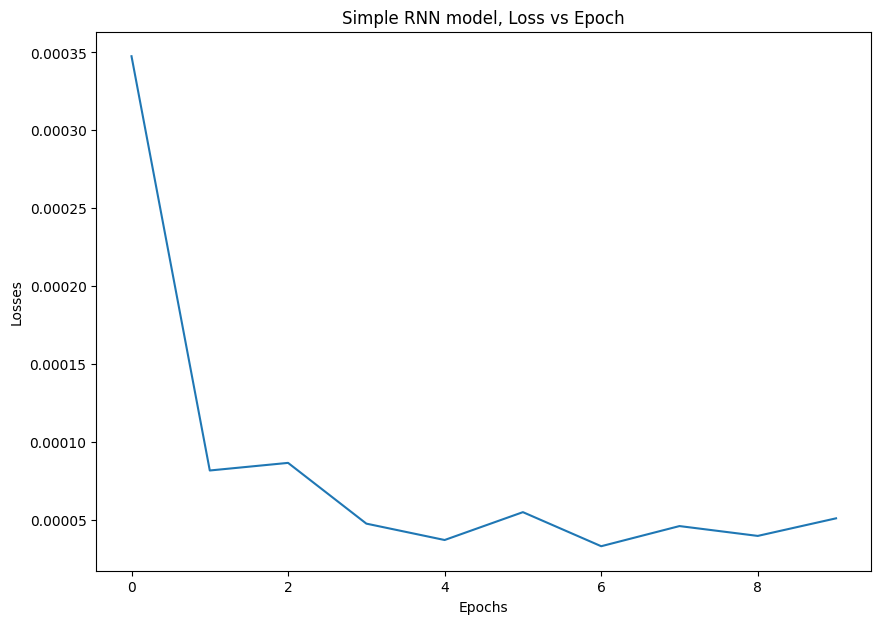

In [170]:
loss_epoch(history_gru_stacked)

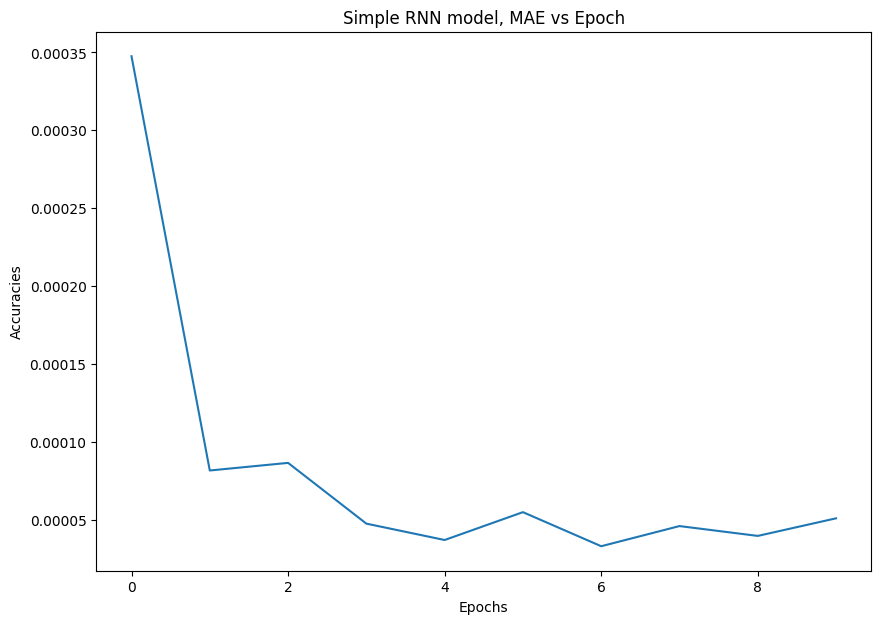

In [171]:
MAE_epoch(history_gru_stacked)

In [172]:
# make predictions
train_predict_gru = model_gru_stacked.predict(x_train)
test_predict_gru = model_gru_stacked.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru, test_predict_gru)

9/9 [==============================] - 0s 1ms/step
Train RMSE: 0.005 RMSE
Test RMSE: 0.013 RMSE


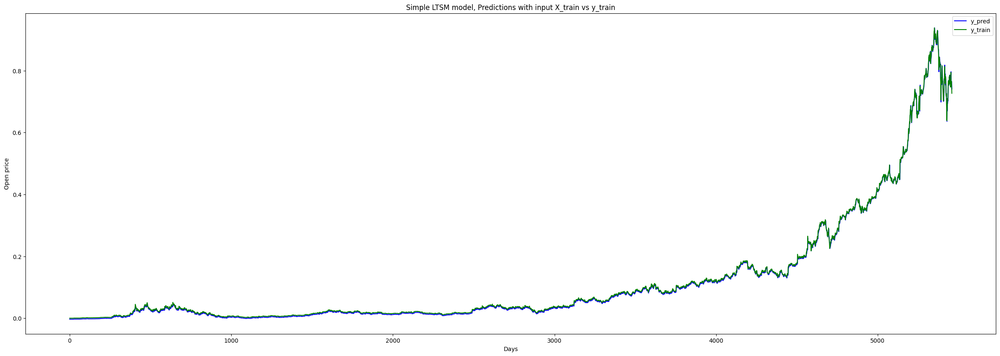

In [173]:
plt.figure(figsize = (30,10))
plt.plot(train_predict_gru, color = "b", label = "y_pred" )
plt.plot(y_train, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple LTSM model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

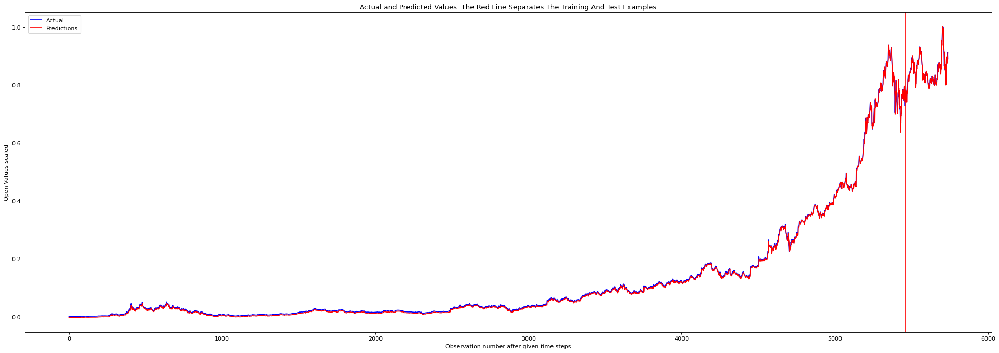

In [174]:
plot_result(y_train, y_test, train_predict_gru, test_predict_gru)

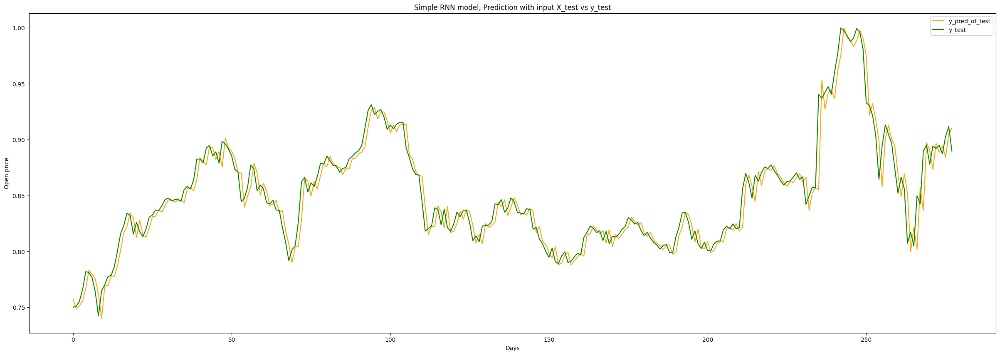

In [175]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

9/9 [==============================] - 0s 2ms/step


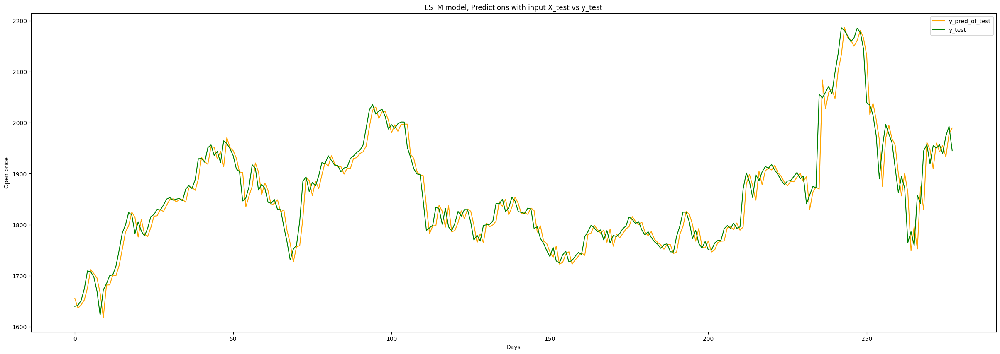

In [176]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(model_gru_stacked.predict(x_test)), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

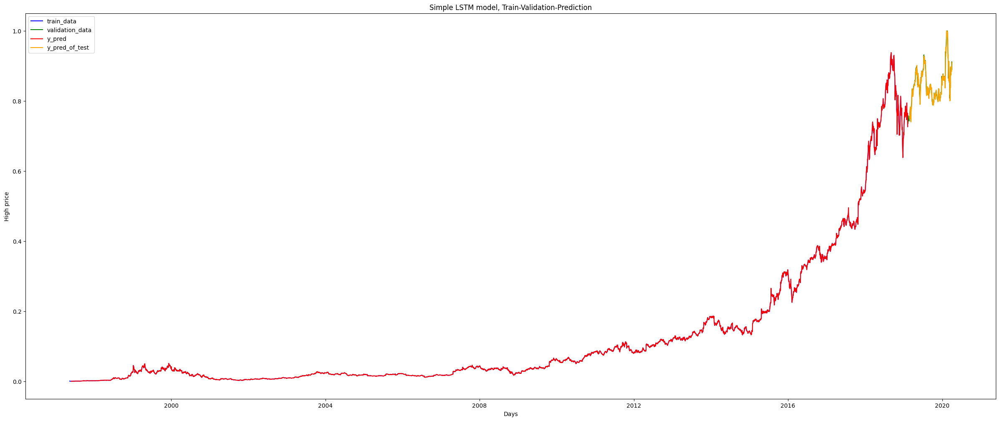

In [177]:
# Visualisation
plt.subplots(figsize =(30,12))
plt.plot(df_dates_train, train_data, label = "train_data", color = "b")
plt.plot(df_dates_test, test_data, label = "validation_data", color = "g")
plt.plot(df_dates_train[time_steps:], y_train, label = "y_pred", color = "r")
plt.plot(df_dates_test[time_steps:], test_predict_gru, label = "y_pred_of_test", color = "orange")
plt.xlabel("Days")
plt.ylabel("High price")
plt.title("Simple LSTM model, Train-Validation-Prediction")
plt.legend()
plt.show()

# Experiments

## Experiments with units

### 100 units

In [22]:
def exp1_GRU(x_train, hidden_units, activation):
    model_gru = Sequential()
    model_gru.add(GRU(units=hidden_units, return_sequences=True, input_shape=(x_train.shape[1],1), activation=activation[0]))
    model_gru.add(GRU(units=hidden_units, activation=activation[0]))
    model_gru.add(Dense(units=1, activation=activation[1]))

    # Compiling the RNN
    model_gru.compile(optimizer="adam",loss='mean_squared_error', metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [179]:
activation_exp1 = ["tanh", "linear"]
model_gru_exp1 = exp1_GRU(x_train, 100, activation_exp1)

# Fitting to the training set
history_gru_exp1 = model_gru_exp1.fit(x_train,y_train, validation_data = (x_test, y_test), epochs=50,batch_size=20, verbose=2)

Epoch 1/50
273/273 - 4s - loss: 6.8684e-04 - mean_absolute_error: 0.0090 - val_loss: 4.1967e-04 - val_mean_absolute_error: 0.0154 - 4s/epoch - 15ms/step
Epoch 2/50
273/273 - 2s - loss: 6.3826e-05 - mean_absolute_error: 0.0047 - val_loss: 3.0310e-04 - val_mean_absolute_error: 0.0124 - 2s/epoch - 6ms/step
Epoch 3/50
273/273 - 2s - loss: 7.9051e-05 - mean_absolute_error: 0.0053 - val_loss: 3.5248e-04 - val_mean_absolute_error: 0.0142 - 2s/epoch - 6ms/step
Epoch 4/50
273/273 - 2s - loss: 5.8736e-05 - mean_absolute_error: 0.0050 - val_loss: 7.4391e-04 - val_mean_absolute_error: 0.0238 - 2s/epoch - 6ms/step
Epoch 5/50
273/273 - 2s - loss: 3.7578e-05 - mean_absolute_error: 0.0037 - val_loss: 2.1513e-04 - val_mean_absolute_error: 0.0101 - 2s/epoch - 6ms/step
Epoch 6/50
273/273 - 2s - loss: 3.6328e-05 - mean_absolute_error: 0.0036 - val_loss: 1.9817e-04 - val_mean_absolute_error: 0.0096 - 2s/epoch - 6ms/step
Epoch 7/50
273/273 - 2s - loss: 3.6246e-05 - mean_absolute_error: 0.0037 - val_loss: 1.

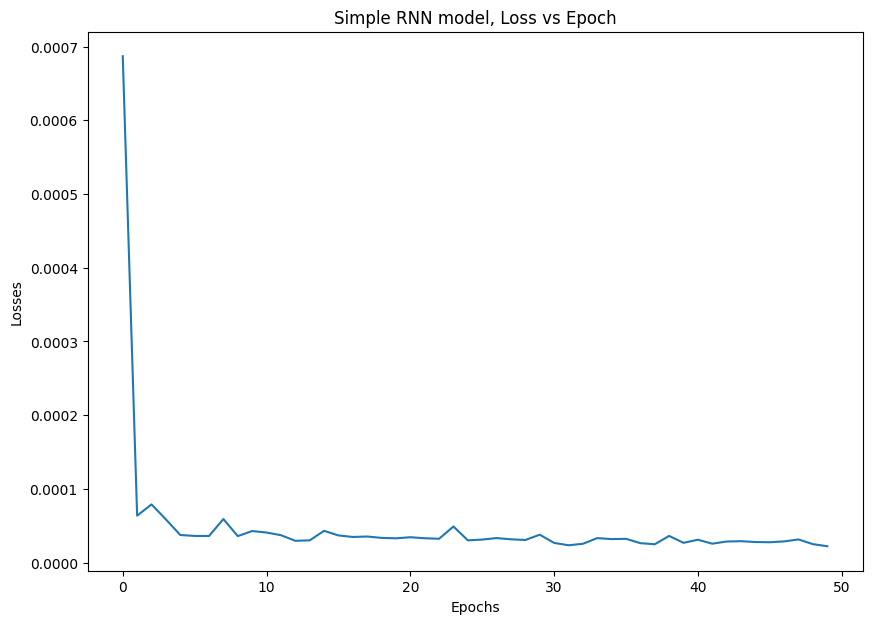

In [180]:
loss_epoch(history_gru_exp1)

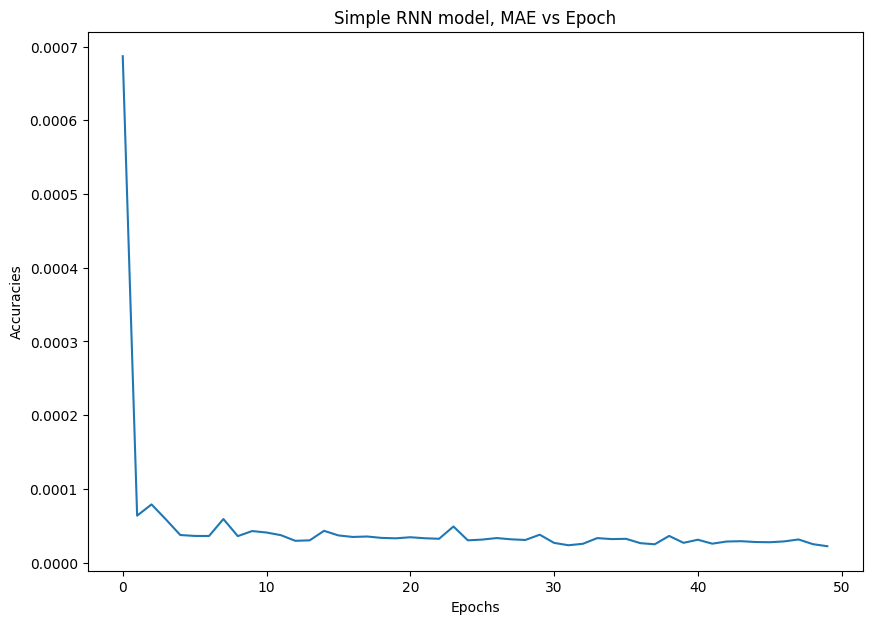

In [181]:
MAE_epoch(history_gru_exp1)

In [182]:
# make predictions
train_predict_gru_exp1 = model_gru_exp1.predict(x_train)
test_predict_gru_exp1 = model_gru_exp1.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru_exp1, test_predict_gru_exp1)

9/9 [==============================] - 0s 3ms/step
Train RMSE: 0.005 RMSE
Test RMSE: 0.018 RMSE


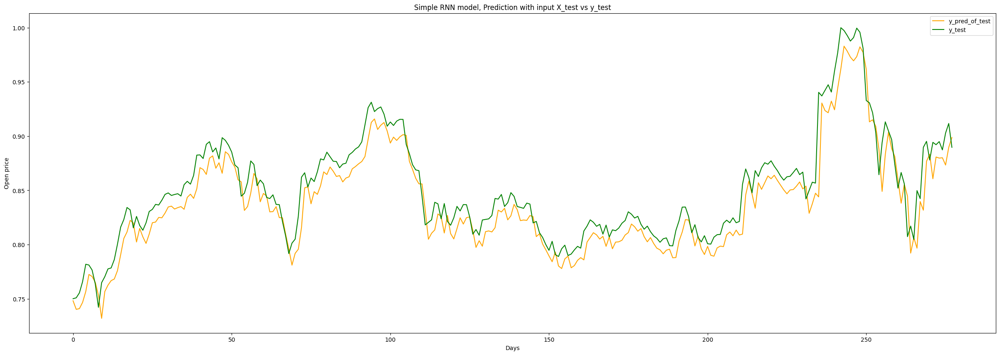

In [183]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_exp1, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

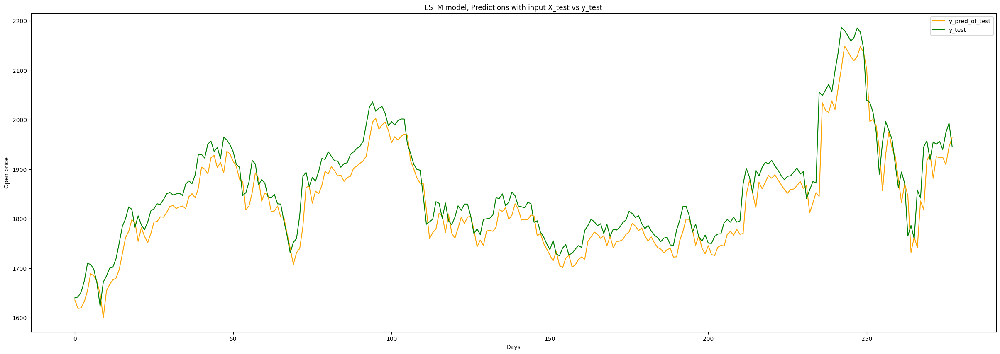

In [184]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(test_predict_gru_exp1), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

### 20 units

In [185]:

model_gru_exp2 = exp1_GRU(x_train, 20, activation_exp1)

# Fitting to the training set
history_gru_exp2 = model_gru_exp2.fit(x_train,y_train, validation_data=(x_test, y_test),epochs=50,batch_size=20, verbose=2)

Epoch 1/50
273/273 - 2s - loss: 0.0052 - mean_absolute_error: 0.0228 - val_loss: 7.2437e-04 - val_mean_absolute_error: 0.0206 - 2s/epoch - 9ms/step
Epoch 2/50
273/273 - 1s - loss: 6.1730e-05 - mean_absolute_error: 0.0042 - val_loss: 5.4796e-04 - val_mean_absolute_error: 0.0171 - 610ms/epoch - 2ms/step
Epoch 3/50
273/273 - 1s - loss: 6.0206e-05 - mean_absolute_error: 0.0044 - val_loss: 5.1725e-04 - val_mean_absolute_error: 0.0166 - 565ms/epoch - 2ms/step
Epoch 4/50
273/273 - 1s - loss: 6.0803e-05 - mean_absolute_error: 0.0044 - val_loss: 5.0484e-04 - val_mean_absolute_error: 0.0165 - 574ms/epoch - 2ms/step
Epoch 5/50
273/273 - 1s - loss: 6.0755e-05 - mean_absolute_error: 0.0045 - val_loss: 5.4128e-04 - val_mean_absolute_error: 0.0175 - 587ms/epoch - 2ms/step
Epoch 6/50
273/273 - 1s - loss: 6.6885e-05 - mean_absolute_error: 0.0049 - val_loss: 4.4150e-04 - val_mean_absolute_error: 0.0155 - 589ms/epoch - 2ms/step
Epoch 7/50
273/273 - 1s - loss: 5.4685e-05 - mean_absolute_error: 0.0042 - va

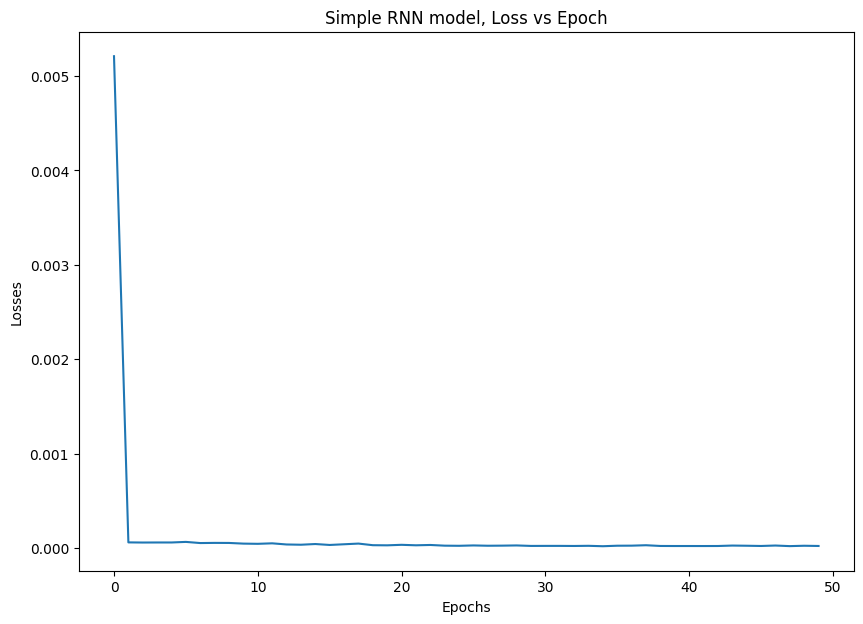

In [186]:
loss_epoch(history_gru_exp2)

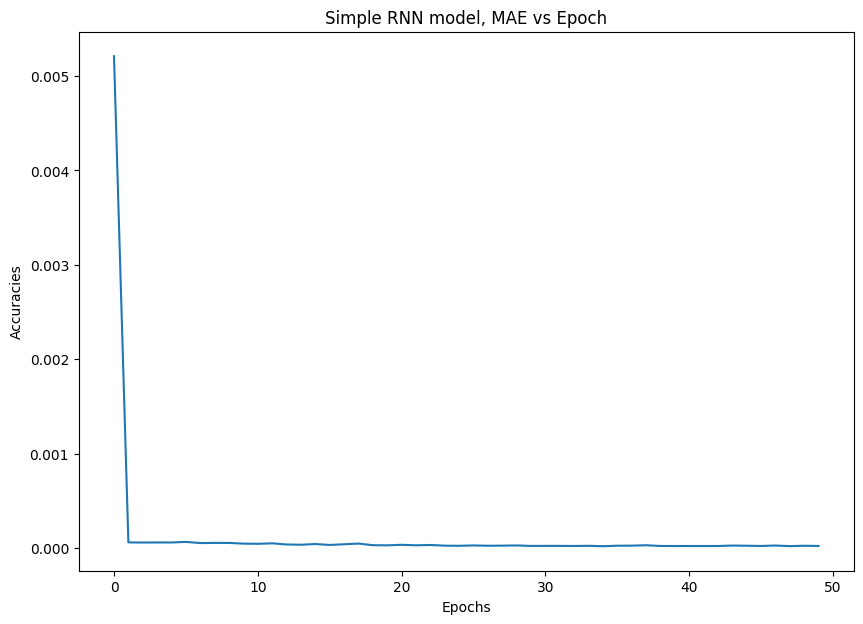

In [187]:
MAE_epoch(history_gru_exp2)

In [188]:
# make predictions
train_predict_gru_exp2 = model_gru_exp2.predict(x_train)
test_predict_gru_exp2 = model_gru_exp2.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru_exp2, test_predict_gru_exp2)

9/9 [==============================] - 0s 995us/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


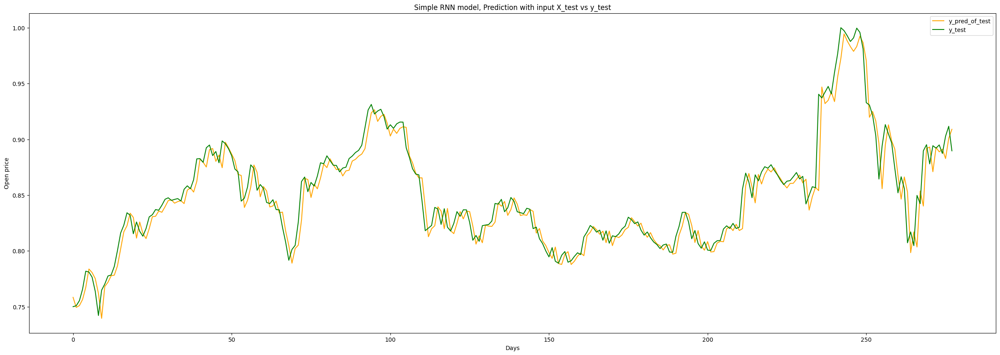

In [189]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_exp2, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

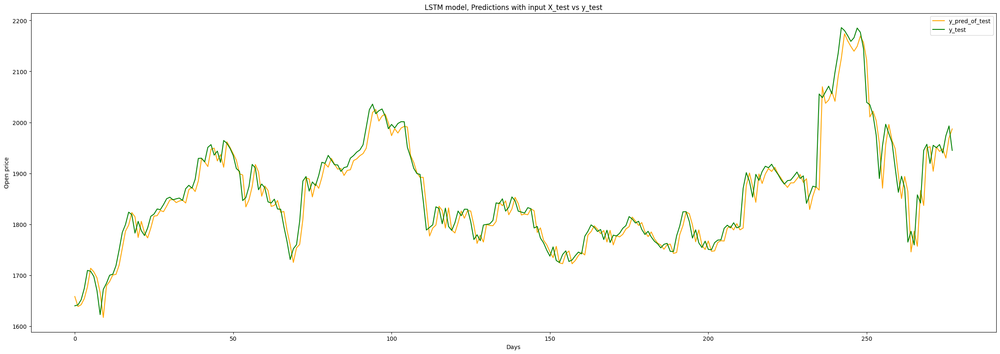

In [190]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(test_predict_gru_exp2), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

## Activation Function

### Tanh and Tanh

In [191]:
activation_exp3 = ["tanh", "tanh"]
model_gru_exp3 = exp1_GRU(x_train, 32, activation_exp3)

# Fitting to the training set
history_gru_exp3 = model_gru_exp3.fit(x_train,y_train,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
273/273 - 3s - loss: 0.0012 - mean_absolute_error: 0.0160 - 3s/epoch - 9ms/step
Epoch 2/50
273/273 - 1s - loss: 1.2239e-04 - mean_absolute_error: 0.0059 - 660ms/epoch - 2ms/step
Epoch 3/50
273/273 - 1s - loss: 9.0623e-05 - mean_absolute_error: 0.0054 - 627ms/epoch - 2ms/step
Epoch 4/50
273/273 - 1s - loss: 9.0486e-05 - mean_absolute_error: 0.0056 - 635ms/epoch - 2ms/step
Epoch 5/50
273/273 - 1s - loss: 8.2189e-05 - mean_absolute_error: 0.0051 - 610ms/epoch - 2ms/step
Epoch 6/50
273/273 - 1s - loss: 7.0920e-05 - mean_absolute_error: 0.0048 - 631ms/epoch - 2ms/step
Epoch 7/50
273/273 - 1s - loss: 7.6435e-05 - mean_absolute_error: 0.0049 - 605ms/epoch - 2ms/step
Epoch 8/50
273/273 - 1s - loss: 5.4020e-05 - mean_absolute_error: 0.0039 - 596ms/epoch - 2ms/step
Epoch 9/50
273/273 - 1s - loss: 5.0740e-05 - mean_absolute_error: 0.0036 - 605ms/epoch - 2ms/step
Epoch 10/50
273/273 - 1s - loss: 5.5693e-05 - mean_absolute_error: 0.0040 - 595ms/epoch - 2ms/step
Epoch 11/50
273/273 - 1s -

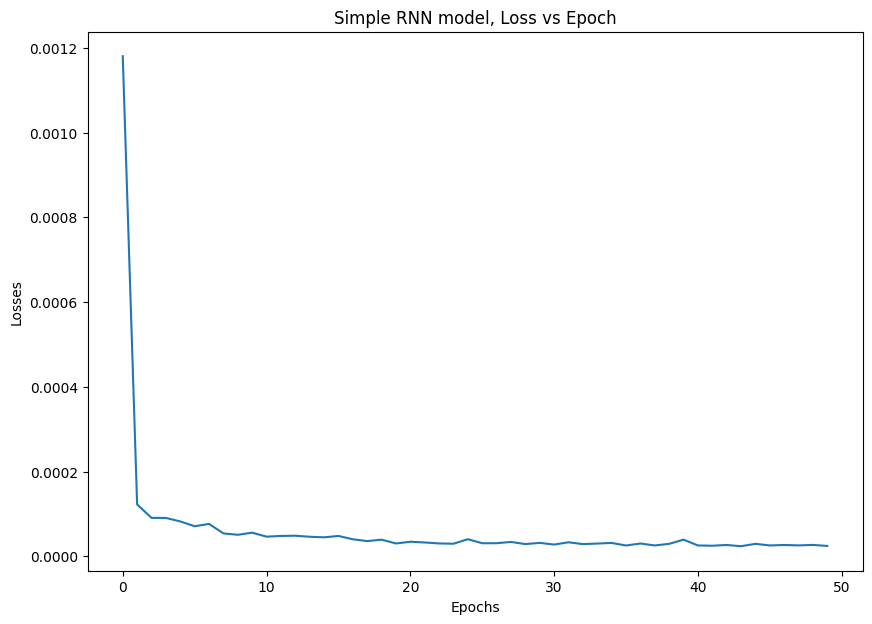

In [192]:
loss_epoch(history_gru_exp3)

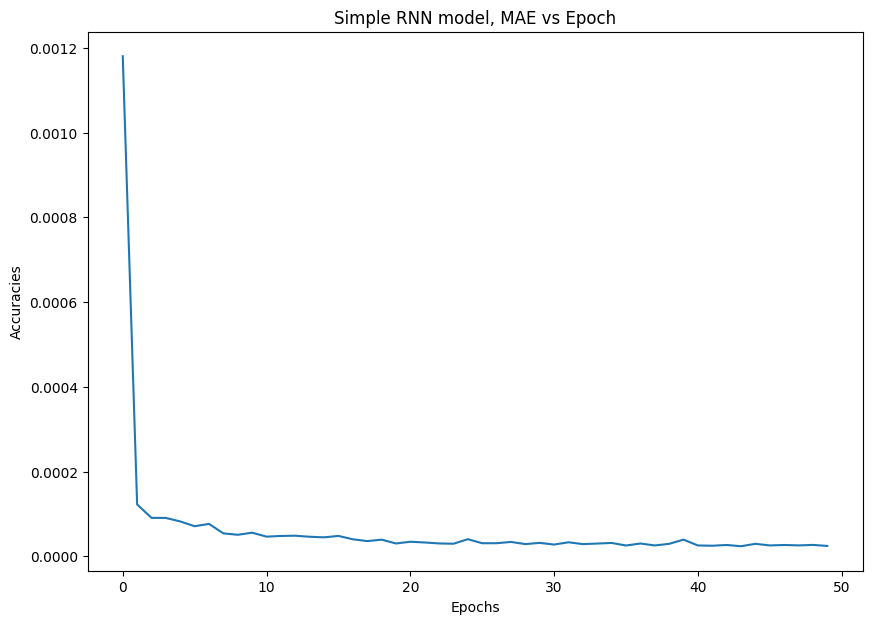

In [193]:
MAE_epoch(history_gru_exp3)

In [195]:
# make predictions
train_predict_gru_exp3 = model_gru_exp3.predict(x_train)
test_predict_gru_exp3 = model_gru_exp3.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru_exp2, test_predict_gru_exp2)

9/9 [==============================] - 0s 1ms/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


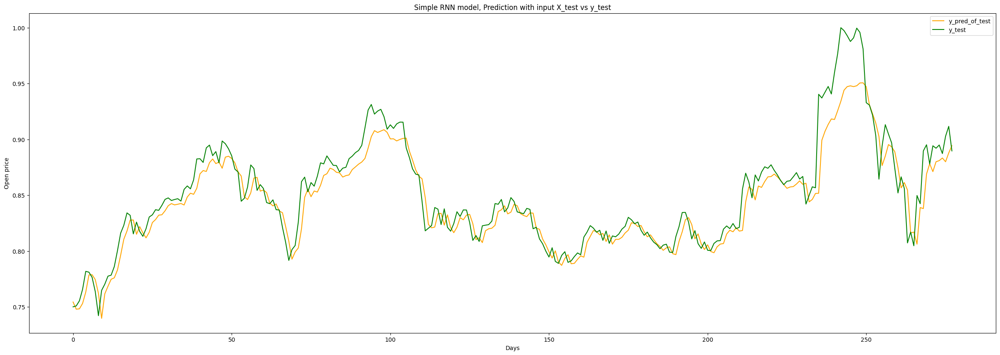

In [196]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_exp3, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

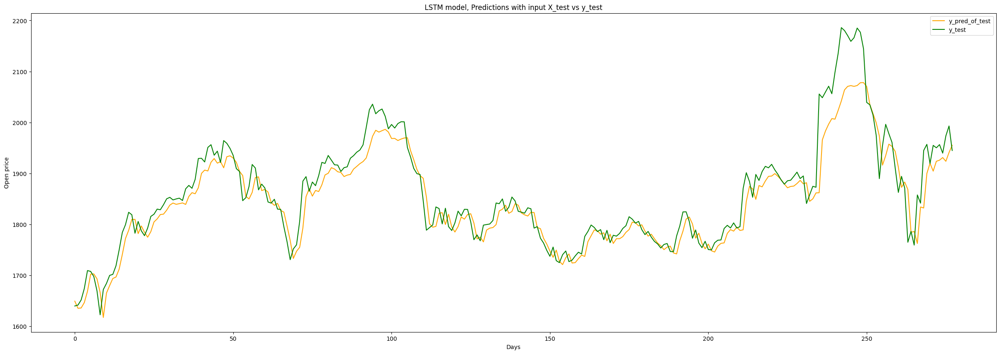

In [197]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(test_predict_gru_exp3), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

### Tanh and ReLu

In [198]:
activation_exp4 = ["tanh", "relu"]
model_gru_exp4 = exp1_GRU(x_train, 64, activation_exp4)

# Fitting to the training set
history_gru_exp4 = model_gru_exp4.fit(x_train,y_train,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
273/273 - 2s - loss: 8.8693e-04 - mean_absolute_error: 0.0106 - 2s/epoch - 8ms/step
Epoch 2/50
273/273 - 1s - loss: 5.3863e-05 - mean_absolute_error: 0.0043 - 858ms/epoch - 3ms/step
Epoch 3/50
273/273 - 1s - loss: 5.6817e-05 - mean_absolute_error: 0.0045 - 863ms/epoch - 3ms/step
Epoch 4/50
273/273 - 1s - loss: 5.5766e-05 - mean_absolute_error: 0.0048 - 834ms/epoch - 3ms/step
Epoch 5/50
273/273 - 1s - loss: 4.0906e-05 - mean_absolute_error: 0.0039 - 827ms/epoch - 3ms/step
Epoch 6/50
273/273 - 1s - loss: 5.0648e-05 - mean_absolute_error: 0.0044 - 819ms/epoch - 3ms/step
Epoch 7/50
273/273 - 1s - loss: 3.9276e-05 - mean_absolute_error: 0.0038 - 821ms/epoch - 3ms/step
Epoch 8/50
273/273 - 1s - loss: 3.6703e-05 - mean_absolute_error: 0.0038 - 819ms/epoch - 3ms/step
Epoch 9/50
273/273 - 1s - loss: 3.7385e-05 - mean_absolute_error: 0.0038 - 876ms/epoch - 3ms/step
Epoch 10/50
273/273 - 1s - loss: 3.3742e-05 - mean_absolute_error: 0.0035 - 857ms/epoch - 3ms/step
Epoch 11/50
273/273 - 

In [199]:
# make predictions
train_predict_gru_exp4 = model_gru_exp4.predict(x_train)
test_predict_gru_exp4 = model_gru_exp4.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru_exp4, test_predict_gru_exp4)

9/9 [==============================] - 0s 2ms/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


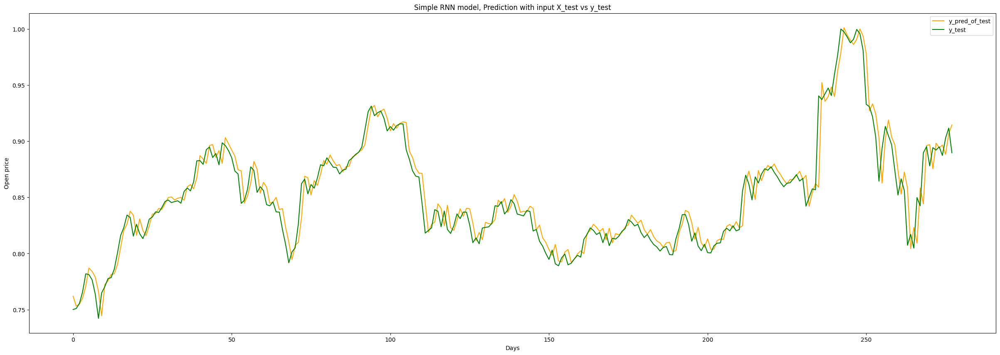

In [200]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_exp4, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

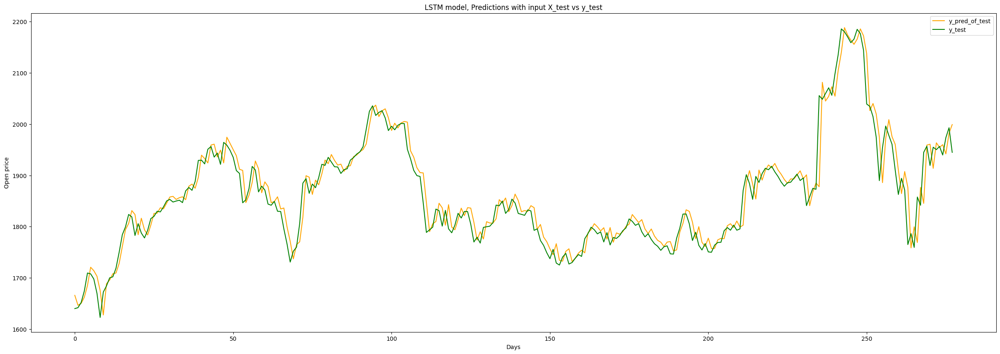

In [201]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(test_predict_gru_exp4), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

### ReLu and ReLu

In [202]:
activation_exp5 = ["relu", "relu"]
model_gru_exp5 = exp1_GRU(x_train, 50, activation_exp5)

# Fitting to the training set
history_gru_exp5 = model_gru_exp5.fit(x_train,y_train,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
273/273 - 2s - loss: 0.0496 - mean_absolute_error: 0.1208 - 2s/epoch - 6ms/step
Epoch 2/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 786ms/epoch - 3ms/step
Epoch 3/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 761ms/epoch - 3ms/step
Epoch 4/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 778ms/epoch - 3ms/step
Epoch 5/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 769ms/epoch - 3ms/step
Epoch 6/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 761ms/epoch - 3ms/step
Epoch 7/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 838ms/epoch - 3ms/step
Epoch 8/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 815ms/epoch - 3ms/step
Epoch 9/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 826ms/epoch - 3ms/step
Epoch 10/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error: 0.1208 - 816ms/epoch - 3ms/step
Epoch 11/50
273/273 - 1s - loss: 0.0496 - mean_absolute_error:

In [206]:
# make predictions
train_predict_gru_exp5 = model_gru_exp5.predict(x_train)
test_predict_gru_exp5 = model_gru_exp5.predict(x_test)
# Mean square error
print_error(y_train, y_test, train_predict_gru_exp5, test_predict_gru_exp5)

9/9 [==============================] - 0s 1ms/step
Train RMSE: 0.223 RMSE
Test RMSE: 0.852 RMSE


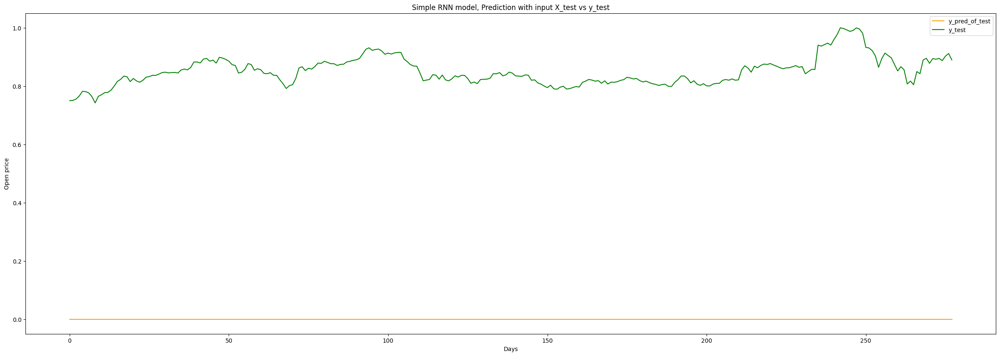

In [207]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_exp5, label = "y_pred_of_test", c = "orange")
plt.plot(y_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

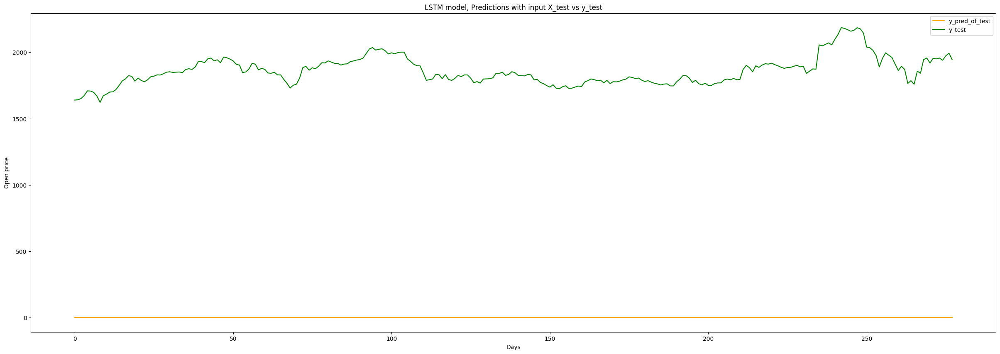

In [208]:
plt.subplots(figsize =(30,10))
plt.plot(scaler.inverse_transform(test_predict_gru_exp5), label = "y_pred_of_test", c = "orange" )
plt.plot(scaler.inverse_transform(y_test), label = "y_test", color = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("LSTM model, Predictions with input X_test vs y_test")
plt.legend()
plt.show()

## Scaling

### Robust Scaler

In [24]:
from sklearn.preprocessing import RobustScaler

In [62]:
def get_train_test_rob(path, column, train_percent=0.95, val_percent = 0.8889):
    df = pd.read_csv(path)
    df_open = df[column]#.drop("Date", axis = 1)

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(df_open.values).reshape(-1, 1) #astype('float32')

    rob_scaler = RobustScaler()
    stock_data = rob_scaler.fit_transform(stock_data)


    n = len(stock_data)
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)].reshape(-1,1)
    # val_data = total_train_data[val_split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)
    # df_dates_train = df_dates_train_total[range(val_split)].reshape(-1,1)
    # df_dates_val = df_dates_train_total[val_split:].reshape(-1,1)



    return train_data, test_data, stock_data, df_dates, rob_scaler, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data_rob, test_data_rob, stock_data_rob, df_dates_rob, rob_scaler, df_dates_train_rob, df_dates_test_rob = get_train_test_rob(file_path, "High")

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/1795424622.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [63]:
x_train_rob, y_train_rob = create_data(train_data_rob, time_steps)
x_test_rob, y_test_rob = create_data(test_data_rob, time_steps)

(10, 1)
(10, 1)


In [64]:
model_rob = stacked_RNN(hidden_units=64, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'linear'])
history_rob = model_rob.fit(x_train_rob, y_train_rob, epochs=50, batch_size=20, verbose=2)

Epoch 1/50
273/273 - 1s - loss: 0.0237 - mean_absolute_error: 0.0643 - 1s/epoch - 4ms/step
Epoch 2/50
273/273 - 1s - loss: 0.0034 - mean_absolute_error: 0.0389 - 526ms/epoch - 2ms/step
Epoch 3/50
273/273 - 0s - loss: 0.0029 - mean_absolute_error: 0.0340 - 474ms/epoch - 2ms/step
Epoch 4/50
273/273 - 0s - loss: 0.0031 - mean_absolute_error: 0.0342 - 473ms/epoch - 2ms/step
Epoch 5/50
273/273 - 0s - loss: 0.0024 - mean_absolute_error: 0.0281 - 471ms/epoch - 2ms/step
Epoch 6/50
273/273 - 0s - loss: 0.0022 - mean_absolute_error: 0.0261 - 471ms/epoch - 2ms/step
Epoch 7/50
273/273 - 0s - loss: 0.0018 - mean_absolute_error: 0.0222 - 468ms/epoch - 2ms/step
Epoch 8/50
273/273 - 0s - loss: 0.0026 - mean_absolute_error: 0.0274 - 473ms/epoch - 2ms/step
Epoch 9/50
273/273 - 0s - loss: 0.0029 - mean_absolute_error: 0.0298 - 466ms/epoch - 2ms/step
Epoch 10/50
273/273 - 0s - loss: 0.0023 - mean_absolute_error: 0.0264 - 472ms/epoch - 2ms/step
Epoch 11/50
273/273 - 0s - loss: 0.0021 - mean_absolute_error:

In [65]:
# make predictions
train_predict_rob = model_rob.predict(x_train_rob)
test_predict_rob = model_rob.predict(x_test_rob)
# Mean square error
print_error(y_train_rob, y_test_rob, train_predict_rob, test_predict_rob)

9/9 [==============================] - 0s 738us/step
Train RMSE: 0.035 RMSE
Test RMSE: 0.115 RMSE


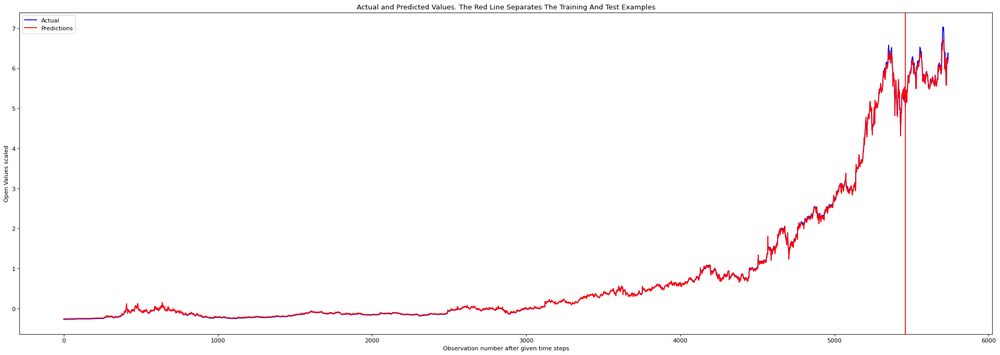

In [66]:
plot_result(y_train_rob, y_test_rob, train_predict_rob, test_predict_rob)

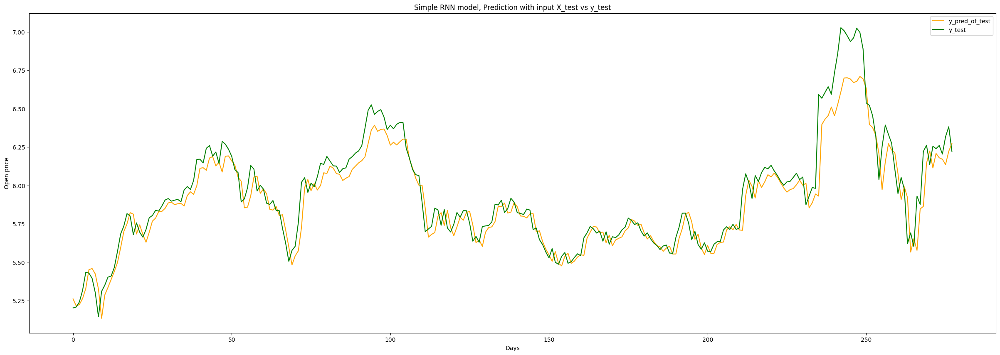

In [67]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_rob, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_rob, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

In [68]:
model_rob = exp1_GRU(x_train_rob, hidden_units=50, activation=['tanh', 'linear'])
history_rob = model_rob.fit(x_train_rob, y_train_rob, validation_data=(x_test_rob, y_test_rob), epochs=50, batch_size=20, verbose=2)

Epoch 1/50
273/273 - 3s - loss: 0.0892 - mean_absolute_error: 0.0956 - val_loss: 0.1167 - val_mean_absolute_error: 0.3001 - 3s/epoch - 10ms/step
Epoch 2/50
273/273 - 1s - loss: 0.0027 - mean_absolute_error: 0.0259 - val_loss: 0.0194 - val_mean_absolute_error: 0.1031 - 749ms/epoch - 3ms/step
Epoch 3/50
273/273 - 1s - loss: 0.0023 - mean_absolute_error: 0.0222 - val_loss: 0.0383 - val_mean_absolute_error: 0.1599 - 774ms/epoch - 3ms/step
Epoch 4/50
273/273 - 1s - loss: 0.0026 - mean_absolute_error: 0.0238 - val_loss: 0.0244 - val_mean_absolute_error: 0.1189 - 754ms/epoch - 3ms/step
Epoch 5/50
273/273 - 1s - loss: 0.0020 - mean_absolute_error: 0.0215 - val_loss: 0.0297 - val_mean_absolute_error: 0.1509 - 744ms/epoch - 3ms/step
Epoch 6/50
273/273 - 1s - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0742 - val_mean_absolute_error: 0.2508 - 716ms/epoch - 3ms/step
Epoch 7/50
273/273 - 1s - loss: 0.0016 - mean_absolute_error: 0.0193 - val_loss: 0.0165 - val_mean_absolute_error: 0.095

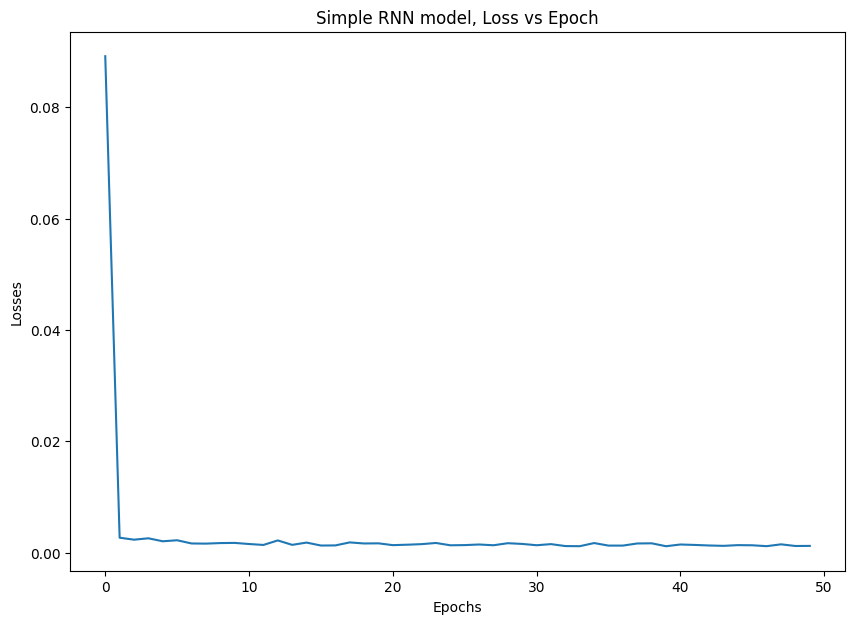

In [69]:
loss_epoch(history_rob)

In [70]:
# make predictions
train_predict_rob = model_rob.predict(y_train_rob)
test_predict_rob = model_rob.predict(y_test_rob)
# Mean square error
print_error(y_train_rob, y_test_rob, train_predict_rob, test_predict_rob)

9/9 [==============================] - 0s 549us/step
Train RMSE: 0.318 RMSE
Test RMSE: 1.597 RMSE


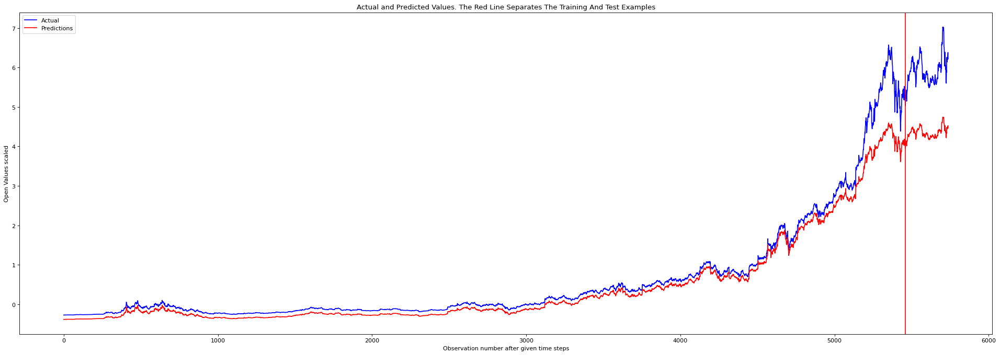

In [71]:
plot_result(y_train_rob, y_test_rob, train_predict_rob, test_predict_rob)

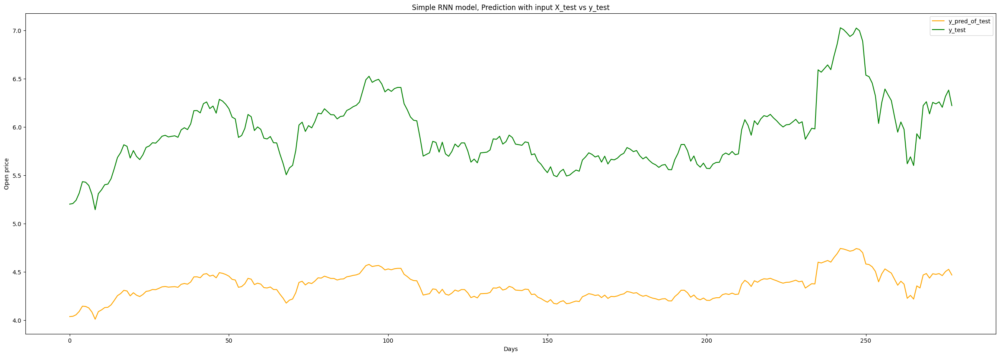

In [72]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_rob, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_rob, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

### Standard Scaler

In [75]:
from sklearn.preprocessing import StandardScaler

In [76]:
def get_train_test_std(path, column, train_percent=0.95, val_percent = 0.8889):
    df = pd.read_csv(path)
    df_open = df[column]#.drop("Date", axis = 1)

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(df_open.values).reshape(-1, 1) #astype('float32')

    std_scaler = StandardScaler()
    stock_data = std_scaler.fit_transform(stock_data)

    n = len(stock_data)
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)].reshape(-1,1)
    # val_data = total_train_data[val_split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)
    # df_dates_train = df_dates_train_total[range(val_split)].reshape(-1,1)
    # df_dates_val = df_dates_train_total[val_split:].reshape(-1,1)



    return train_data, test_data, stock_data, df_dates, std_scaler, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data_std, test_data_std, stock_data_std, df_dates_std, std_scaler, df_dates_train__std, df_dates_test_std = get_train_test_std(file_path, "High")

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/3039338371.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [77]:
x_train_std, y_train_std = create_data(train_data_std, time_steps)
x_test_std, y_test_std = create_data(test_data_std, time_steps)

(10, 1)
(10, 1)


In [78]:
model_std = stacked_RNN(hidden_units=64, dense_units = 1, input_shape=(time_steps,1), 
                   activation=['tanh', 'linear'])
history_std = model_std.fit(x_train_std, y_train_std, epochs=50, batch_size=20, verbose=2)

Epoch 1/50
273/273 - 1s - loss: 0.0120 - mean_absolute_error: 0.0445 - 1s/epoch - 4ms/step
Epoch 2/50
273/273 - 0s - loss: 6.3416e-04 - mean_absolute_error: 0.0146 - 477ms/epoch - 2ms/step
Epoch 3/50
273/273 - 1s - loss: 6.6206e-04 - mean_absolute_error: 0.0160 - 509ms/epoch - 2ms/step
Epoch 4/50
273/273 - 0s - loss: 7.0432e-04 - mean_absolute_error: 0.0160 - 472ms/epoch - 2ms/step
Epoch 5/50
273/273 - 0s - loss: 5.9634e-04 - mean_absolute_error: 0.0147 - 493ms/epoch - 2ms/step
Epoch 6/50
273/273 - 0s - loss: 5.9794e-04 - mean_absolute_error: 0.0148 - 490ms/epoch - 2ms/step
Epoch 7/50
273/273 - 0s - loss: 7.6361e-04 - mean_absolute_error: 0.0167 - 493ms/epoch - 2ms/step
Epoch 8/50
273/273 - 0s - loss: 6.3631e-04 - mean_absolute_error: 0.0167 - 472ms/epoch - 2ms/step
Epoch 9/50
273/273 - 0s - loss: 5.8997e-04 - mean_absolute_error: 0.0149 - 470ms/epoch - 2ms/step
Epoch 10/50
273/273 - 0s - loss: 7.9441e-04 - mean_absolute_error: 0.0188 - 475ms/epoch - 2ms/step
Epoch 11/50
273/273 - 0s -

In [79]:
# make predictions
train_predict_std = model_std.predict(x_train_std)
test_predict_std = model_std.predict(x_test_std)
# Mean square error
print_error(y_train_std, y_test_std, train_predict_std, test_predict_std)

9/9 [==============================] - 0s 825us/step
Train RMSE: 0.018 RMSE
Test RMSE: 0.057 RMSE


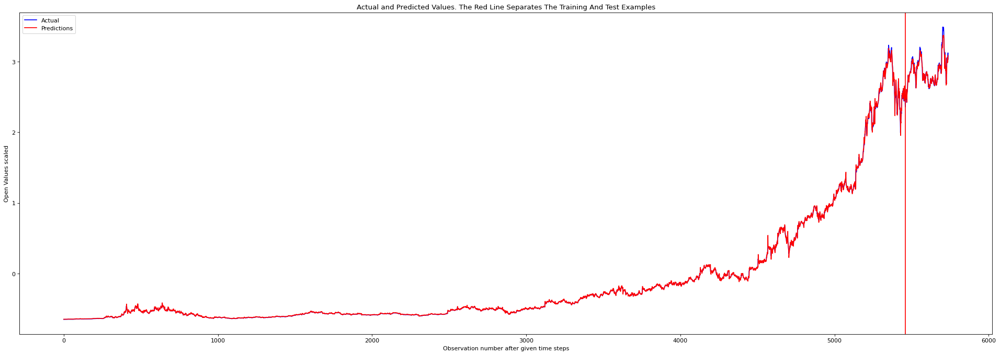

In [80]:
plot_result(y_train_std, y_test_std, train_predict_std, test_predict_std)

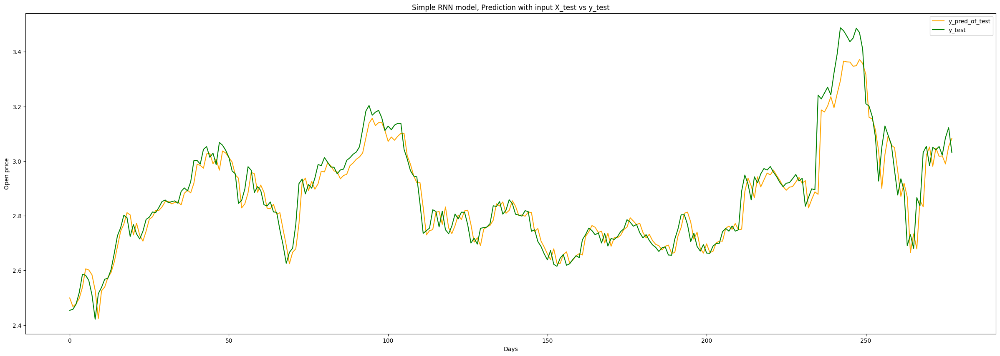

In [81]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_std, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_std, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

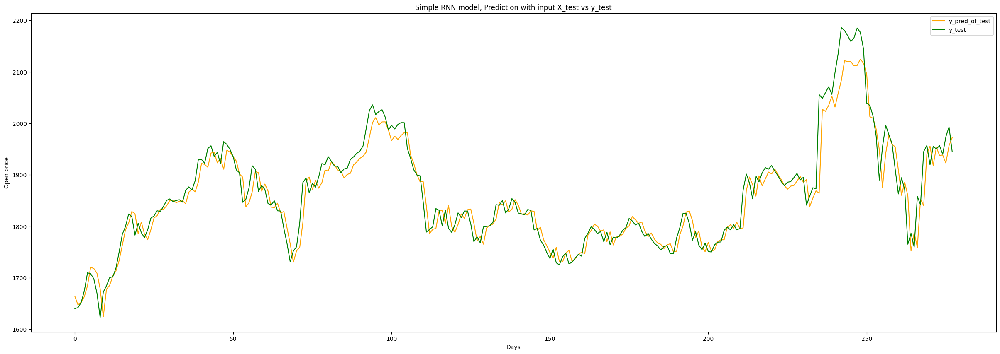

In [82]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(std_scaler.inverse_transform(test_predict_std), label = "y_pred_of_test", c = "orange")
plt.plot(std_scaler.inverse_transform(y_test_std), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

In [83]:
model_gru_std = exp1_GRU(x_train_std, hidden_units = 1, activation = ["tanh", "linear"])
history_gru_std = model_gru_std.fit(x_train_std,y_train_std,epochs=50,batch_size=20, verbose=2)


Epoch 1/50
273/273 - 2s - loss: 0.5334 - mean_absolute_error: 0.5003 - 2s/epoch - 7ms/step
Epoch 2/50
273/273 - 0s - loss: 0.2291 - mean_absolute_error: 0.2390 - 462ms/epoch - 2ms/step
Epoch 3/50
273/273 - 0s - loss: 0.1352 - mean_absolute_error: 0.1709 - 457ms/epoch - 2ms/step
Epoch 4/50
273/273 - 0s - loss: 0.0978 - mean_absolute_error: 0.1493 - 494ms/epoch - 2ms/step
Epoch 5/50
273/273 - 0s - loss: 0.0709 - mean_absolute_error: 0.1320 - 497ms/epoch - 2ms/step
Epoch 6/50
273/273 - 0s - loss: 0.0514 - mean_absolute_error: 0.1170 - 485ms/epoch - 2ms/step
Epoch 7/50
273/273 - 0s - loss: 0.0376 - mean_absolute_error: 0.1053 - 459ms/epoch - 2ms/step
Epoch 8/50
273/273 - 0s - loss: 0.0278 - mean_absolute_error: 0.0951 - 453ms/epoch - 2ms/step
Epoch 9/50
273/273 - 0s - loss: 0.0208 - mean_absolute_error: 0.0849 - 456ms/epoch - 2ms/step
Epoch 10/50
273/273 - 0s - loss: 0.0159 - mean_absolute_error: 0.0764 - 457ms/epoch - 2ms/step
Epoch 11/50
273/273 - 1s - loss: 0.0123 - mean_absolute_error:

In [85]:
# make predictions
train_predict_gru_std = model_gru_std.predict(x_train_std)
test_predict_gru_std = model_gru_std.predict(x_test_std)
# Mean square error
print_error(y_train_std, y_test_std, train_predict_gru_std, test_predict_gru_std)

9/9 [==============================] - 0s 876us/step
Train RMSE: 0.020 RMSE
Test RMSE: 0.071 RMSE


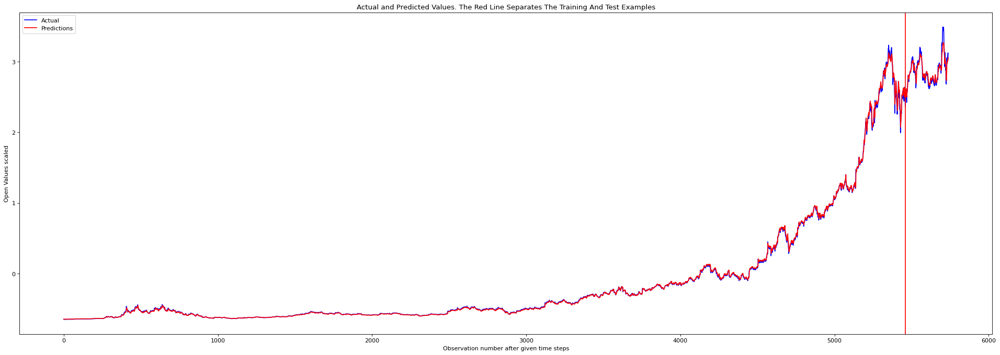

In [86]:
plot_result(y_train_std, y_test_std, train_predict_gru_std, test_predict_gru_std)

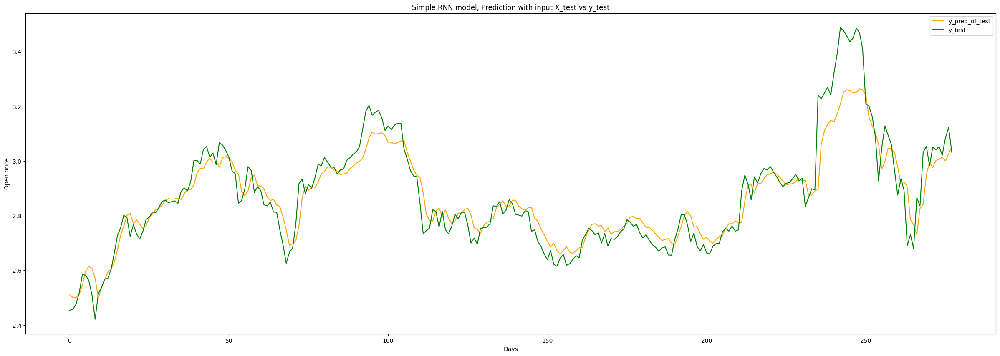

In [88]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_std, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_std, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

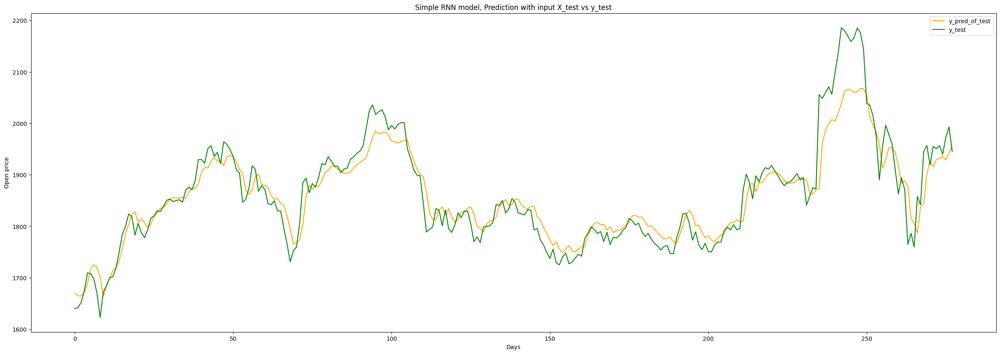

In [87]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(std_scaler.inverse_transform(test_predict_gru_std), label = "y_pred_of_test", c = "orange")
plt.plot(std_scaler.inverse_transform(y_test_std), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

## Data Augmentation

### Log Exponentials before scaling

In [89]:
def get_train_test_log(path, column, train_percent=0.9, val_percent = 0.8889):
    df = pd.read_csv(path)
    df_open = df[column]#.drop("Date", axis = 1)

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(np.log(df_open.values)).reshape(-1, 1) #astype('float32')

    # rob_scaler = RobustScaler()
    # stock_data = rob_scaler.fit_transform(stock_data)


    scaler_log = MinMaxScaler(feature_range=(0, 1))
    stock_data = scaler_log.fit_transform(stock_data).flatten()
    n = len(stock_data)
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)].reshape(-1,1)
    # val_data = total_train_data[val_split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)
    # df_dates_train = df_dates_train_total[range(val_split)].reshape(-1,1)
    # df_dates_val = df_dates_train_total[val_split:].reshape(-1,1)



    return train_data, test_data, stock_data, df_dates, scaler_log, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data_log, test_data_log, stock_data_log, df_dates_log, scaler_log, df_dates_train_log, df_dates_test_log = get_train_test_log(file_path, "High")

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/902694414.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [90]:
x_train_log, y_train_log = create_data(train_data_log, time_steps)
x_test_log, y_test_log = create_data(test_data_log, time_steps)

(10, 1)
(10, 1)


In [92]:
model_gru_log = stacked_GRU()
history_gru_log = model_gru_log.fit(x_train_log,y_train_log,epochs=50,batch_size=20, verbose=2)


Epoch 1/50
259/259 - 3s - loss: 0.0045 - mean_absolute_error: 0.0247 - 3s/epoch - 13ms/step
Epoch 2/50
259/259 - 1s - loss: 6.0033e-05 - mean_absolute_error: 0.0052 - 1s/epoch - 5ms/step
Epoch 3/50
259/259 - 1s - loss: 5.7767e-05 - mean_absolute_error: 0.0051 - 1s/epoch - 5ms/step
Epoch 4/50
259/259 - 1s - loss: 5.7315e-05 - mean_absolute_error: 0.0052 - 1s/epoch - 5ms/step
Epoch 5/50
259/259 - 1s - loss: 5.7579e-05 - mean_absolute_error: 0.0052 - 1s/epoch - 5ms/step
Epoch 6/50
259/259 - 1s - loss: 5.3972e-05 - mean_absolute_error: 0.0051 - 1s/epoch - 5ms/step
Epoch 7/50
259/259 - 1s - loss: 5.6140e-05 - mean_absolute_error: 0.0053 - 1s/epoch - 4ms/step
Epoch 8/50
259/259 - 1s - loss: 5.0885e-05 - mean_absolute_error: 0.0050 - 1s/epoch - 5ms/step
Epoch 9/50
259/259 - 1s - loss: 5.5159e-05 - mean_absolute_error: 0.0053 - 1s/epoch - 5ms/step
Epoch 10/50
259/259 - 1s - loss: 5.0959e-05 - mean_absolute_error: 0.0051 - 1s/epoch - 5ms/step
Epoch 11/50
259/259 - 1s - loss: 4.8988e-05 - mean_a

In [93]:
# make predictions
train_predict_gru_log = model_gru_log.predict(x_train_log)
test_predict_gru_log = model_gru_log.predict(x_test_log)
# Mean square error
print_error(y_train_log, y_test_log, train_predict_gru_log, test_predict_gru_log)

18/18 [==============================] - 0s 1ms/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.005 RMSE


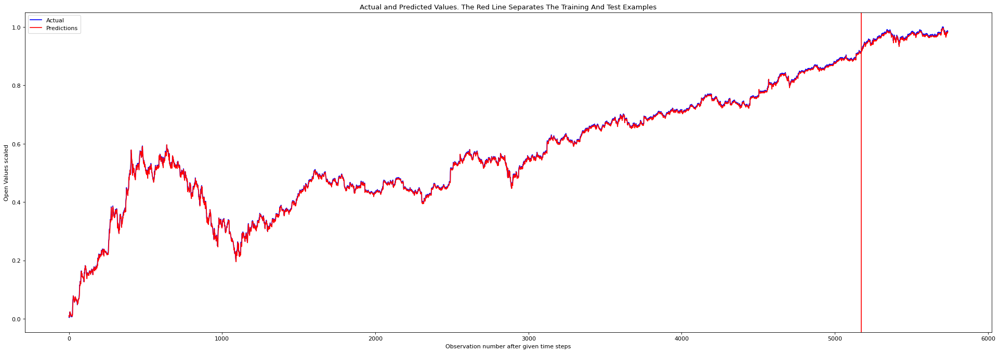

In [94]:
plot_result(y_train_log, y_test_log, train_predict_gru_log, test_predict_gru_log)

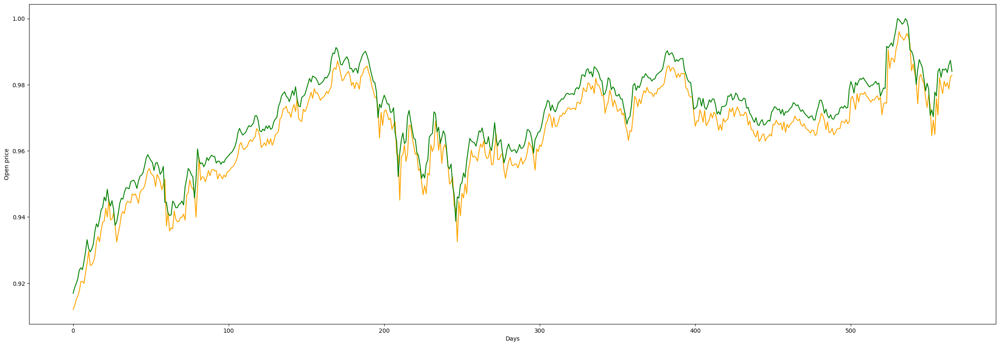

In [96]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_log, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_log, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")               
plt.show()

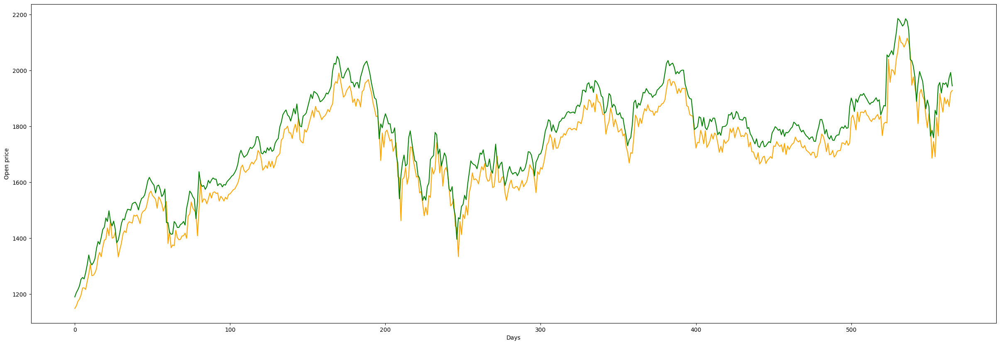

In [95]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(np.exp(scaler_log.inverse_transform(test_predict_gru_log)), label = "y_pred_of_test", c = "orange")
plt.plot(np.exp(scaler_log.inverse_transform(y_test_log)), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")               
plt.show()

### Data Split

#### 60/40 split

In [527]:
def get_train_test(path, column, train_percent=0.95, val_percent = 0.8889):
    df = pd.read_csv(path)
    df_high = df[column]#.drop("Date", axis = 1)

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(df_high.values).reshape(-1, 1) #astype('float32')
    scaler = MinMaxScaler(feature_range=(0, 1))
    stock_data = scaler.fit_transform(stock_data).flatten()
    n = len(stock_data)
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)].reshape(-1,1)
    # val_data = total_train_data[val_split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)
    # df_dates_train = df_dates_train_total[range(val_split)].reshape(-1,1)
    # df_dates_val = df_dates_train_total[val_split:].reshape(-1,1)



    return train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test = get_train_test(file_path, column = "High", train_percent=0.60)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/1433511548.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [528]:
x_train_2, y_train_2 = create_data(train_data, time_steps)
# x_val, y_val = create_data(val_data, time_steps)
x_test_2, y_test_2 = create_data(test_data, time_steps)

(10, 1)
(10, 1)


In [568]:
model_2 = stacked_RNN(hidden_units=64, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'tanh'])
history_2 = model_2.fit(x_train_2, y_train_2, validation_data = (x_test_2, y_test_2), epochs=30, batch_size=20, verbose=2)

Epoch 1/30
173/173 - 2s - loss: 8.7253e-05 - mean_absolute_error: 0.0045 - val_loss: 0.0673 - val_mean_absolute_error: 0.1597 - 2s/epoch - 10ms/step
Epoch 2/30
173/173 - 0s - loss: 6.1442e-06 - mean_absolute_error: 0.0017 - val_loss: 0.0343 - val_mean_absolute_error: 0.1086 - 434ms/epoch - 3ms/step
Epoch 3/30
173/173 - 0s - loss: 4.4537e-06 - mean_absolute_error: 0.0015 - val_loss: 0.0284 - val_mean_absolute_error: 0.1013 - 435ms/epoch - 3ms/step
Epoch 4/30
173/173 - 0s - loss: 2.9680e-06 - mean_absolute_error: 0.0012 - val_loss: 0.0237 - val_mean_absolute_error: 0.0926 - 426ms/epoch - 2ms/step
Epoch 5/30
173/173 - 0s - loss: 2.9082e-06 - mean_absolute_error: 0.0012 - val_loss: 0.0206 - val_mean_absolute_error: 0.0844 - 448ms/epoch - 3ms/step
Epoch 6/30
173/173 - 0s - loss: 2.5195e-06 - mean_absolute_error: 0.0011 - val_loss: 0.0173 - val_mean_absolute_error: 0.0753 - 439ms/epoch - 3ms/step
Epoch 7/30
173/173 - 0s - loss: 2.0165e-06 - mean_absolute_error: 9.5403e-04 - val_loss: 0.0186 

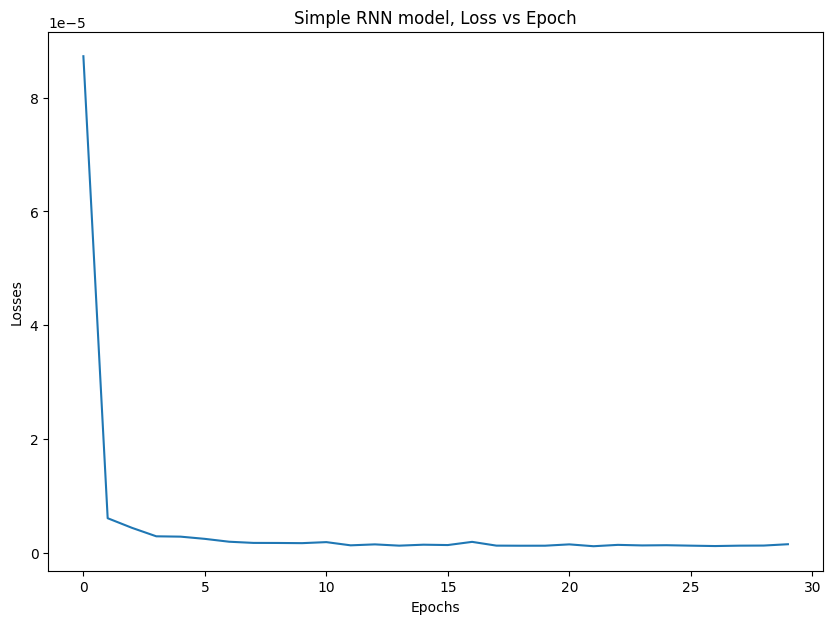

In [569]:
loss_epoch(history_2)

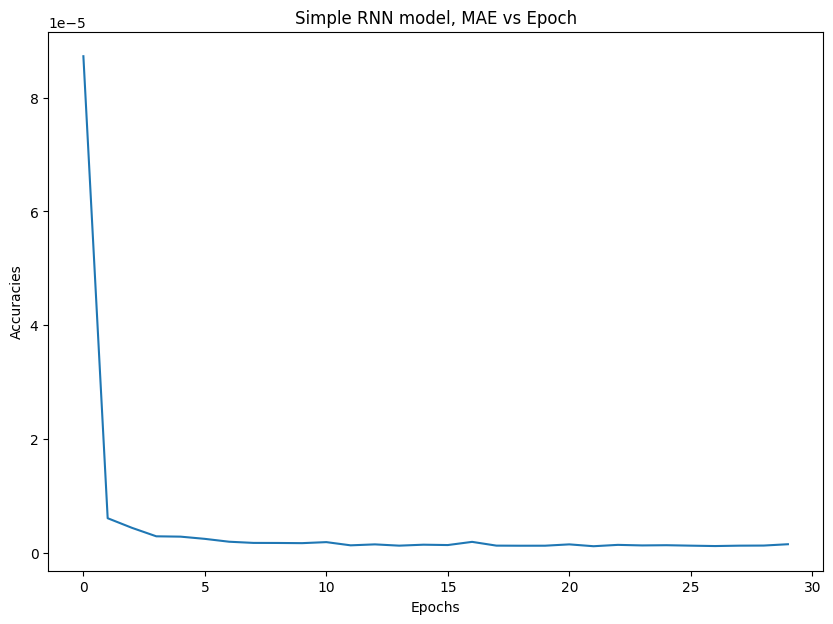

In [570]:
MAE_epoch(history_2)

In [571]:
# make predictions
train_predict_2 = model_2.predict(x_train_2)
test_predict_2 = model_2.predict(x_test_2)
# Mean square error
print_error(y_train_2, y_test_2, train_predict_2, test_predict_2)

72/72 [==============================] - 0s 723us/step
Train RMSE: 0.002 RMSE
Test RMSE: 0.099 RMSE


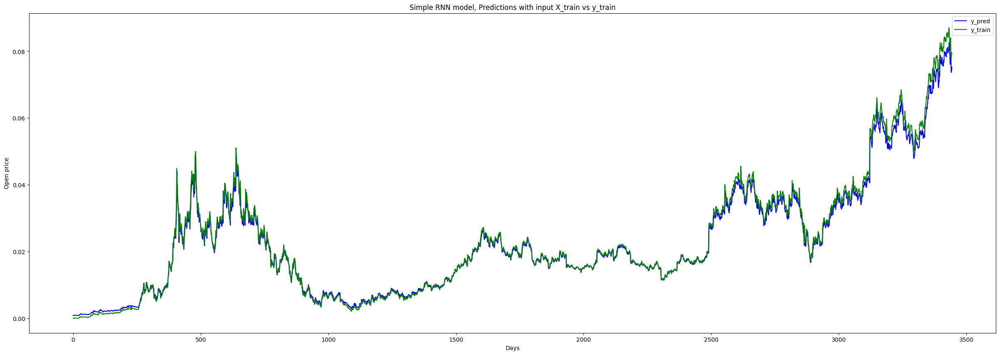

In [572]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict_2, color = "b", label = "y_pred" )
plt.plot(y_train_2, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

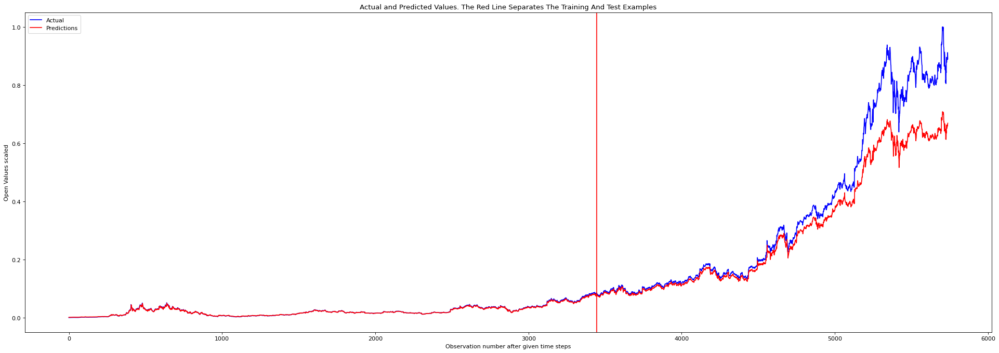

In [573]:
plot_result(y_train_2, y_test_2, train_predict_2, test_predict_2)

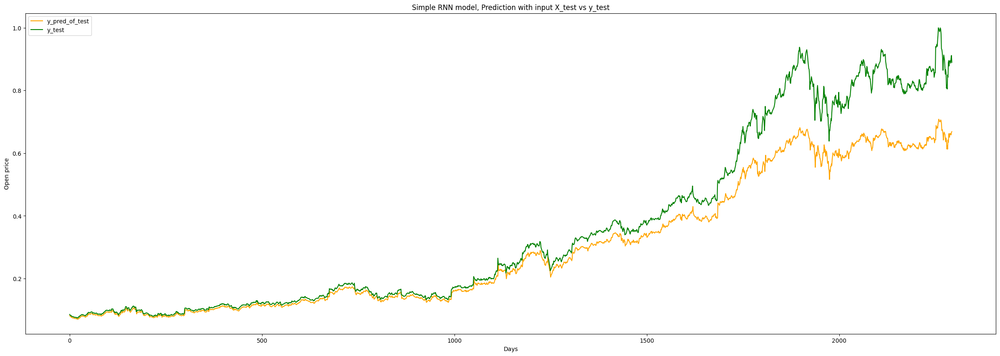

In [574]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_2, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_2, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

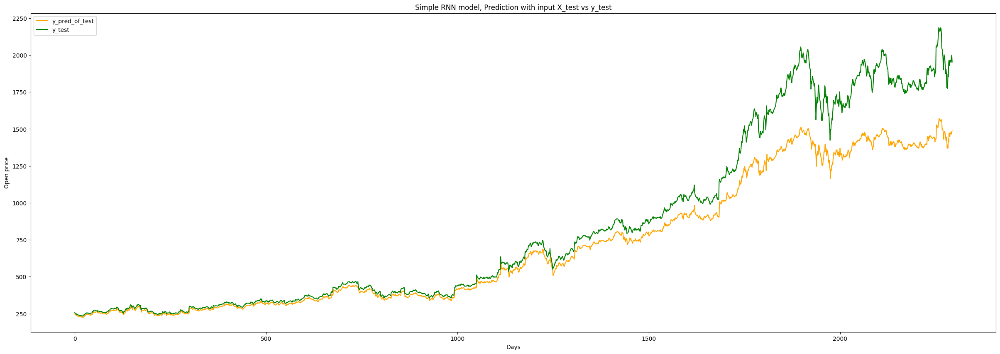

In [575]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler.inverse_transform(test_predict_2), label = "y_pred_of_test", c = "orange")
plt.plot(scaler.inverse_transform(y_test_2), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

#### 80/20 split

In [576]:
train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test = get_train_test(file_path, column = "High", train_percent=0.80)
x_train_3, y_train_3 = create_data(train_data, time_steps)
# x_val, y_val = create_data(val_data, time_steps)
x_test_3, y_test_3 = create_data(test_data, time_steps)

(10, 1)
(10, 1)


/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/1433511548.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [577]:
model_3 = stacked_RNN(hidden_units=64, dense_units=1, input_shape=(time_steps,1), 
                   activation=['tanh', 'tanh'])
history_3 = model_3.fit(x_train_3, y_train_3, validation_data = (x_test_3, y_test_3), epochs=30, batch_size=20, verbose=2)

Epoch 1/30
230/230 - 2s - loss: 5.7979e-04 - mean_absolute_error: 0.0085 - val_loss: 0.0451 - val_mean_absolute_error: 0.1654 - 2s/epoch - 7ms/step
Epoch 2/30
230/230 - 1s - loss: 1.6011e-05 - mean_absolute_error: 0.0025 - val_loss: 0.0352 - val_mean_absolute_error: 0.1438 - 501ms/epoch - 2ms/step
Epoch 3/30
230/230 - 0s - loss: 1.6636e-05 - mean_absolute_error: 0.0026 - val_loss: 0.0320 - val_mean_absolute_error: 0.1384 - 494ms/epoch - 2ms/step
Epoch 4/30
230/230 - 1s - loss: 1.1256e-05 - mean_absolute_error: 0.0021 - val_loss: 0.0271 - val_mean_absolute_error: 0.1264 - 513ms/epoch - 2ms/step
Epoch 5/30
230/230 - 1s - loss: 9.0240e-06 - mean_absolute_error: 0.0018 - val_loss: 0.0241 - val_mean_absolute_error: 0.1196 - 511ms/epoch - 2ms/step
Epoch 6/30
230/230 - 1s - loss: 9.2694e-06 - mean_absolute_error: 0.0019 - val_loss: 0.0211 - val_mean_absolute_error: 0.1101 - 509ms/epoch - 2ms/step
Epoch 7/30
230/230 - 1s - loss: 8.4393e-06 - mean_absolute_error: 0.0018 - val_loss: 0.0189 - val

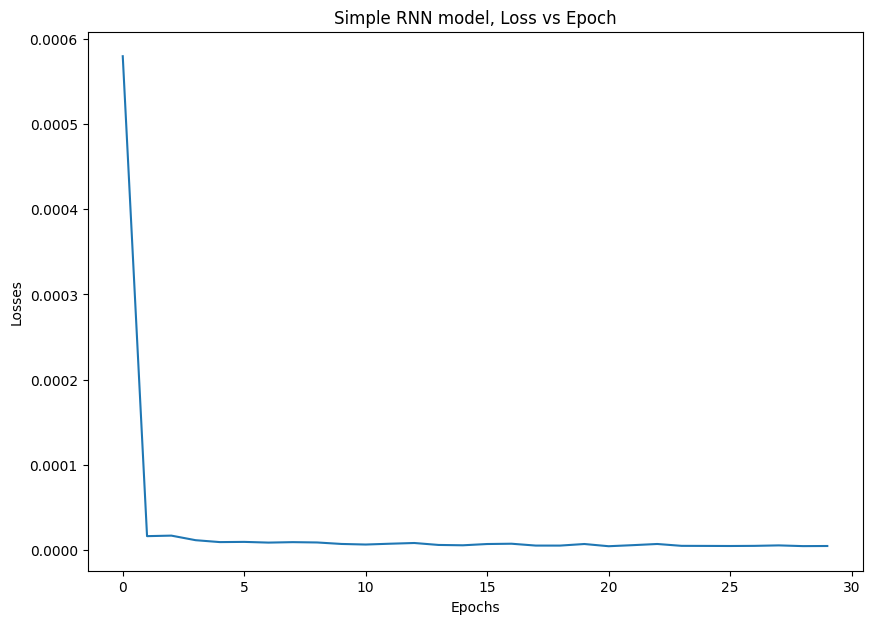

In [578]:
loss_epoch(history_3)

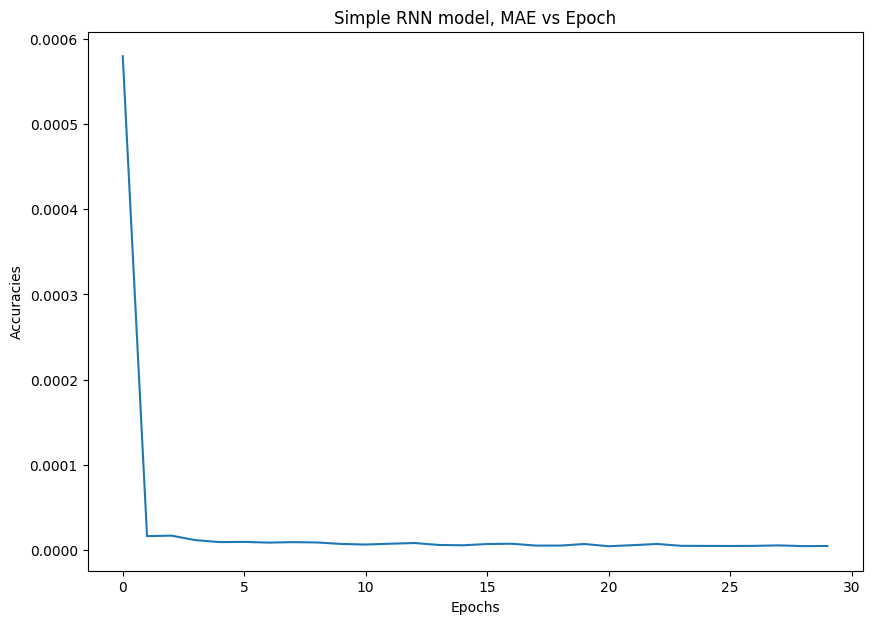

In [579]:
MAE_epoch(history_3)

In [580]:
# make predictions
train_predict_3 = model_3.predict(x_train_3)
test_predict_3 = model_3.predict(x_test_3)
# Mean square error
print_error(y_train_3, y_test_3, train_predict_3, test_predict_3)

36/36 [==============================] - 0s 665us/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.095 RMSE


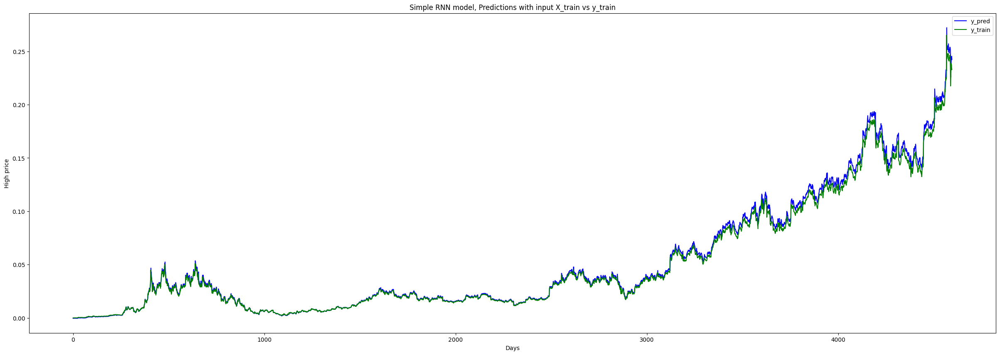

In [581]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict_3, color = "b", label = "y_pred" )
plt.plot(y_train_3, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("High price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

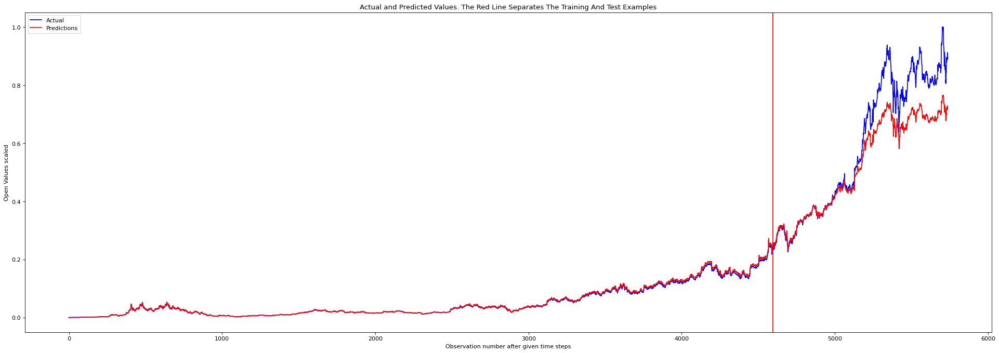

In [582]:
plot_result(y_train_3, y_test_3, train_predict_3, test_predict_3)

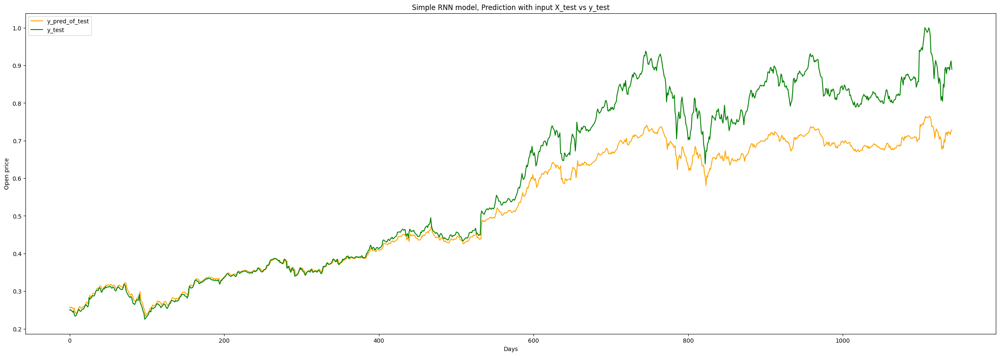

In [583]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_3, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_3, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

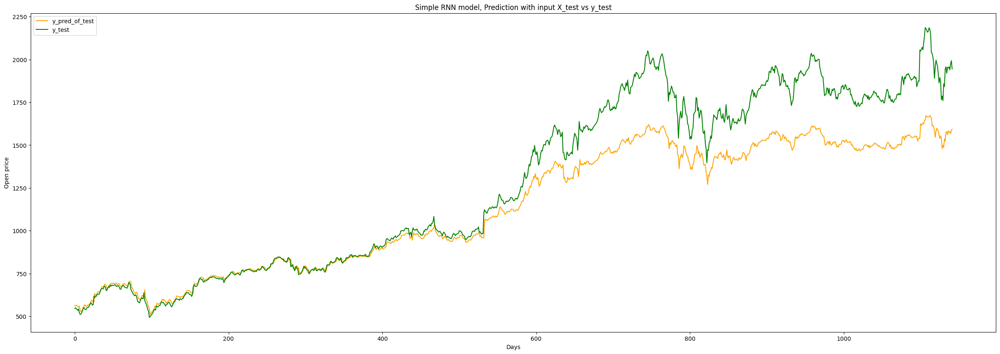

In [584]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler.inverse_transform(test_predict_3), label = "y_pred_of_test", c = "orange")
plt.plot(scaler.inverse_transform(y_test_3), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

### Data History

In [593]:
def get_train_test_hist(path, column, train_percent=0.95, val_percent = 0.8889):
    df = pd.read_csv(path)
    df = df[3000:]
    df_high = df[column]#.drop("Date", axis = 1)

    df_dates = df.iloc[:,:1]
    df_dates["Date"] = pd.to_datetime(df_dates['Date'])
    df_dates = np.array(df_dates.values).reshape(-1, 1)


    stock_data = np.array(df_high.values).reshape(-1, 1) #astype('float32')
    scaler = MinMaxScaler(feature_range=(0, 1))
    stock_data = scaler.fit_transform(stock_data).flatten()
    n = len(stock_data)
    # Point for splitting data into train and test
    split = int(n*train_percent)
    train_data = stock_data[range(split)].reshape(-1,1)
    test_data = stock_data[split:].reshape(-1,1)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)].reshape(-1,1)
    # val_data = total_train_data[val_split:].reshape(-1,1)

    df_dates_train = df_dates[range(split)].reshape(-1,1)
    df_dates_test = df_dates[split:].reshape(-1,1)
    # df_dates_train = df_dates_train_total[range(val_split)].reshape(-1,1)
    # df_dates_val = df_dates_train_total[val_split:].reshape(-1,1)



    return train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test
 
file_path = "stocks/AMZN.csv"
train_data, test_data, stock_data, df_dates, scaler, df_dates_train, df_dates_test = get_train_test_hist(file_path, column = "High", train_percent=0.95)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/1564090108.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [594]:
x_train_4, y_train_4 = create_data(train_data, time_steps)
# x_val, y_val = create_data(val_data, time_steps)
x_test_4, y_test_4 = create_data(test_data, time_steps)

(10, 1)
(10, 1)


In [612]:
model_4 = stacked_GRU()
history_4 = model_4.fit(x_train_4, y_train_4, validation_data = (x_test_4, y_test_4), epochs=50, batch_size=20, verbose=2)

Epoch 1/50
131/131 - 3s - loss: 0.0031 - mean_absolute_error: 0.0241 - val_loss: 6.4997e-04 - val_mean_absolute_error: 0.0180 - 3s/epoch - 25ms/step
Epoch 2/50
131/131 - 1s - loss: 1.1540e-04 - mean_absolute_error: 0.0062 - val_loss: 6.3878e-04 - val_mean_absolute_error: 0.0180 - 582ms/epoch - 4ms/step
Epoch 3/50
131/131 - 1s - loss: 1.1384e-04 - mean_absolute_error: 0.0065 - val_loss: 6.1280e-04 - val_mean_absolute_error: 0.0177 - 587ms/epoch - 4ms/step
Epoch 4/50
131/131 - 1s - loss: 1.0466e-04 - mean_absolute_error: 0.0060 - val_loss: 5.0507e-04 - val_mean_absolute_error: 0.0153 - 596ms/epoch - 5ms/step
Epoch 5/50
131/131 - 1s - loss: 1.1004e-04 - mean_absolute_error: 0.0066 - val_loss: 4.6618e-04 - val_mean_absolute_error: 0.0147 - 593ms/epoch - 5ms/step
Epoch 6/50
131/131 - 1s - loss: 1.2503e-04 - mean_absolute_error: 0.0073 - val_loss: 4.6479e-04 - val_mean_absolute_error: 0.0153 - 570ms/epoch - 4ms/step
Epoch 7/50
131/131 - 1s - loss: 1.0019e-04 - mean_absolute_error: 0.0061 - v

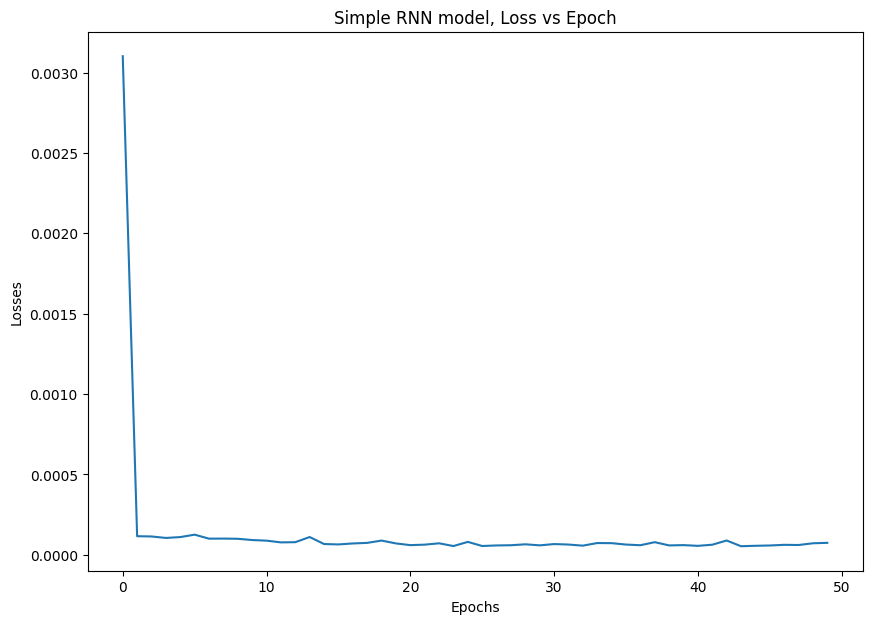

In [613]:
loss_epoch(history_4)

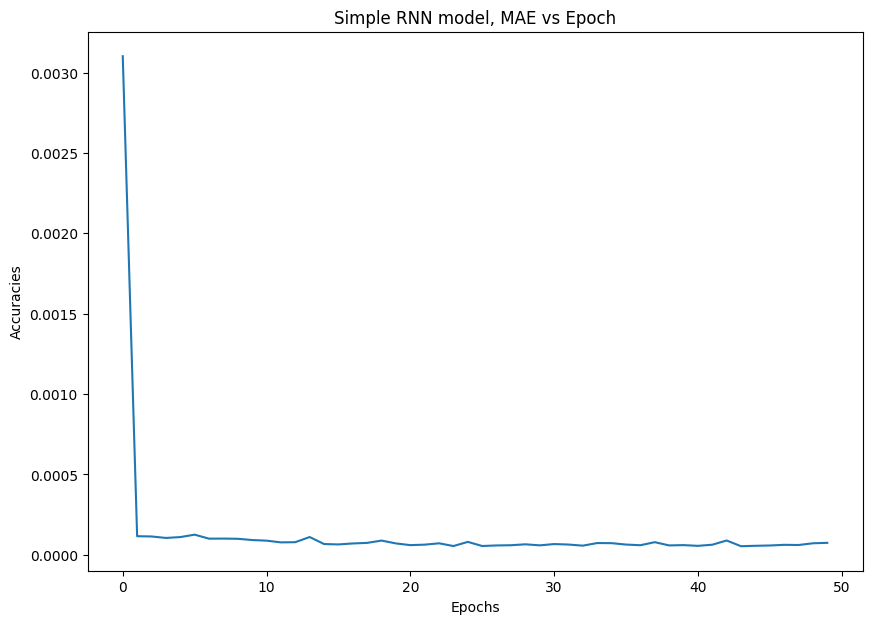

In [614]:
MAE_epoch(history_4)

In [615]:
# make predictions
train_predict_4 = model_2.predict(x_train_4)
test_predict_4 = model_2.predict(x_test_4)
# Mean square error
print_error(y_train_4, y_test_4, train_predict_4, test_predict_4)

4/4 [==============================] - 0s 953us/step
Train RMSE: 0.077 RMSE
Test RMSE: 0.214 RMSE


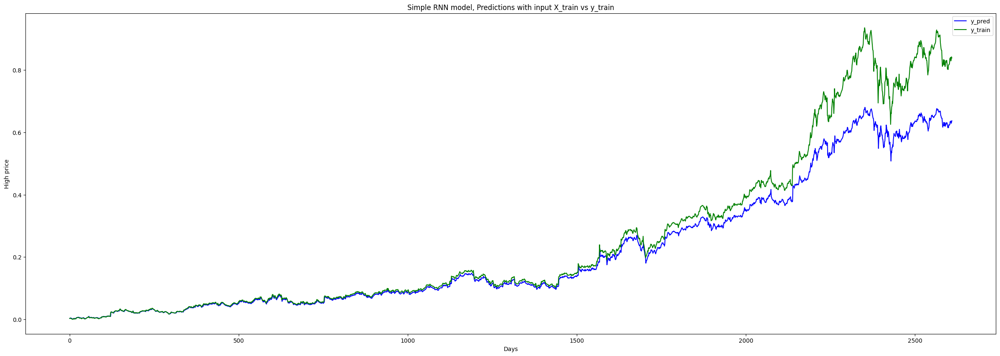

In [620]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(train_predict_4, color = "b", label = "y_pred" )
plt.plot(y_train_4, color = "g", label = "y_train")
plt.xlabel("Days")
plt.ylabel("High price")
plt.title("Simple RNN model, Predictions with input X_train vs y_train")
plt.legend()
plt.show()

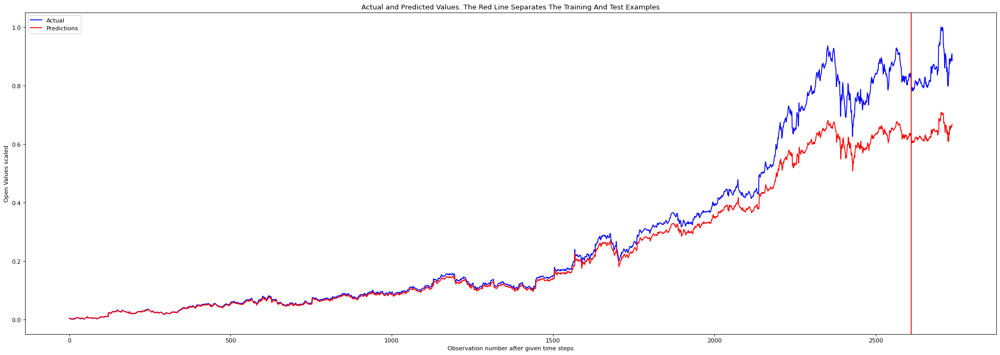

In [617]:
plot_result(y_train_4, y_test_4, train_predict_4, test_predict_4)

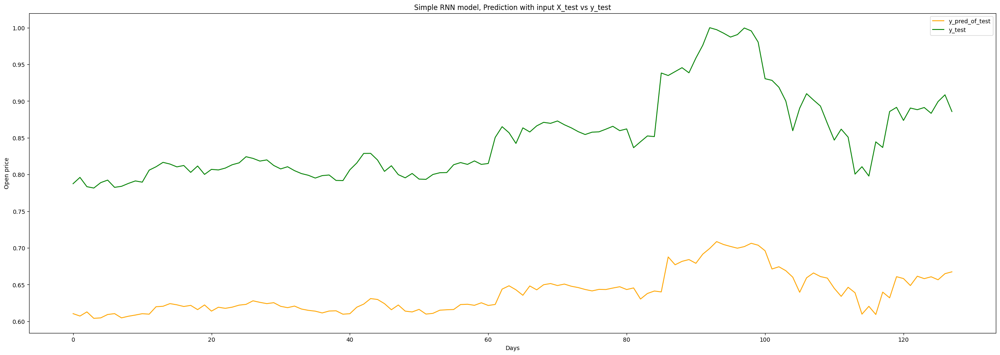

In [618]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_4, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_4, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

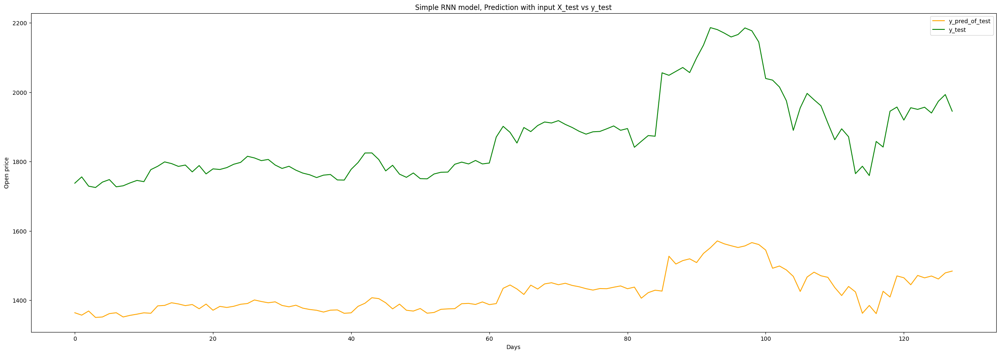

In [619]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler.inverse_transform(test_predict_4), label = "y_pred_of_test", c = "orange")
plt.plot(scaler.inverse_transform(y_test_4), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

## Bidirectional Layer

In [101]:
def stacked_GRU_bi(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(64,return_sequences=True,input_shape = (x_train.shape[1],1))) #64 lstm neuron block
    model_gru.add(Bidirectional(GRU(64, return_sequences= False)))
    model_gru.add(Dense(1))
    model_gru.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [102]:
model_gru_log_3 = stacked_GRU_bi(x_train_log)
history_gru_log_3 = model_gru_log_3.fit(x_train_log,y_train_log,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
259/259 - 4s - loss: 0.0040 - mean_absolute_error: 0.0248 - 4s/epoch - 16ms/step
Epoch 2/50
259/259 - 1s - loss: 8.7818e-05 - mean_absolute_error: 0.0064 - 1s/epoch - 5ms/step
Epoch 3/50
259/259 - 1s - loss: 8.9020e-05 - mean_absolute_error: 0.0066 - 1s/epoch - 5ms/step
Epoch 4/50
259/259 - 1s - loss: 8.4760e-05 - mean_absolute_error: 0.0064 - 1s/epoch - 5ms/step
Epoch 5/50
259/259 - 1s - loss: 8.3754e-05 - mean_absolute_error: 0.0065 - 1s/epoch - 5ms/step
Epoch 6/50
259/259 - 1s - loss: 7.6335e-05 - mean_absolute_error: 0.0061 - 1s/epoch - 5ms/step
Epoch 7/50
259/259 - 1s - loss: 8.1159e-05 - mean_absolute_error: 0.0066 - 1s/epoch - 5ms/step
Epoch 8/50
259/259 - 1s - loss: 7.2054e-05 - mean_absolute_error: 0.0061 - 1s/epoch - 5ms/step
Epoch 9/50
259/259 - 1s - loss: 6.7580e-05 - mean_absolute_error: 0.0059 - 1s/epoch - 5ms/step
Epoch 10/50
259/259 - 1s - loss: 6.8258e-05 - mean_absolute_error: 0.0060 - 1s/epoch - 5ms/step
Epoch 11/50
259/259 - 1s - loss: 6.4592e-05 - mean_a

In [105]:
x_train_log.shape

(5172, 10, 1)

In [106]:
# make predictions
train_predict_gru_log_3 = model_gru_log_3.predict(x_train_log)
test_predict_gru_log_3 = model_gru_log_3.predict(x_test_log)
# Mean square error
print_error(y_train_log, y_test_log, train_predict_gru_log_3, test_predict_gru_log_3)

18/18 [==============================] - 0s 1ms/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.005 RMSE


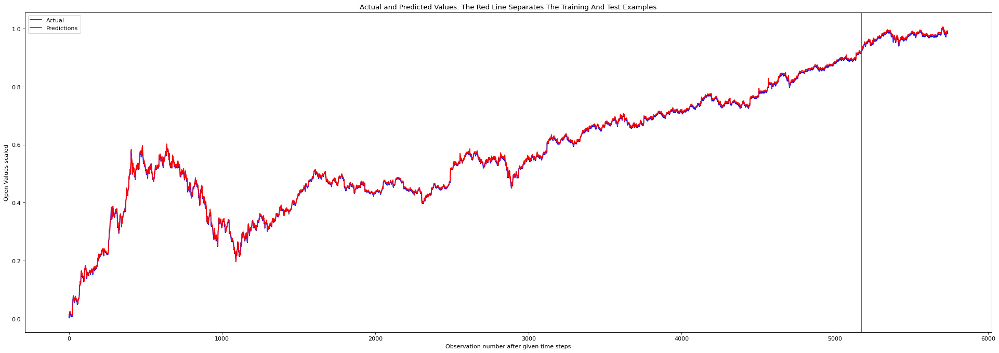

In [107]:
plot_result(y_train_log, y_test_log, train_predict_gru_log_3, test_predict_gru_log_3)

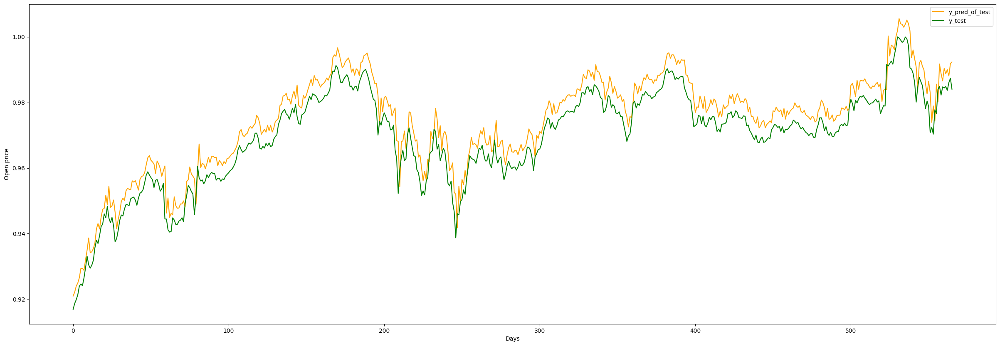

In [108]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_log_3, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_log, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")  
plt.legend()             
plt.show()

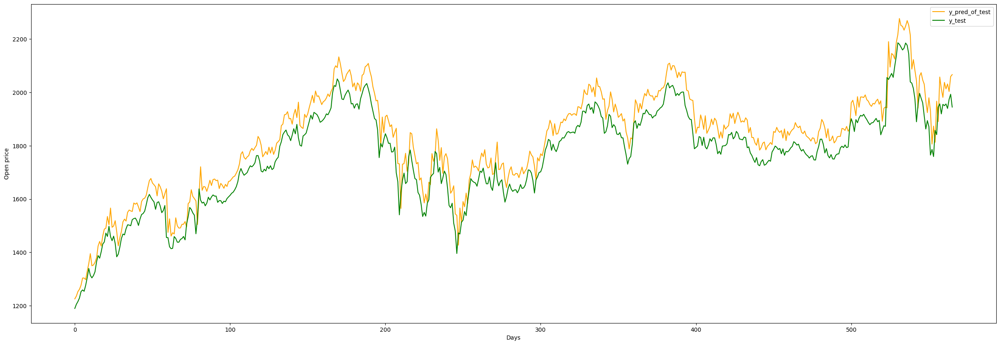

In [109]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(np.exp(scaler_log.inverse_transform(test_predict_gru_log_3)), label = "y_pred_of_test", c = "orange")
plt.plot(np.exp(scaler_log.inverse_transform(y_test_log)), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")  
plt.legend()             
plt.show()

## Optimiser - RMSProp

In [117]:
def stacked_GRU_rms(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=50, return_sequences=True, input_shape=(x_train.shape[1],1), activation='tanh'))
    model_gru.add(GRU(units=50, activation='tanh'))
    model_gru.add(Dense(units = 1))

    # Compiling the RNN
    model_gru.compile(keras.optimizers.RMSprop(learning_rate=0.001),loss='mean_squared_error')
    return model_gru
    # Fitting to the training set
    #model_gru.fit(X_train,y_train,epochs=50,batch_size=150, verbose=0)

In [118]:
model_gru_rms = stacked_GRU_rms(x_train_log)
history_gru_rms = model_gru_rms.fit(x_train_log, y_train_log, validation_data=(x_test_log, y_test_log),epochs=100,batch_size=20, verbose=2)


Epoch 1/100
259/259 - 3s - loss: 0.0027 - val_loss: 0.0010 - 3s/epoch - 12ms/step
Epoch 2/100
259/259 - 1s - loss: 9.4283e-04 - val_loss: 5.2500e-05 - 985ms/epoch - 4ms/step
Epoch 3/100
259/259 - 1s - loss: 6.7044e-04 - val_loss: 2.3428e-04 - 984ms/epoch - 4ms/step
Epoch 4/100
259/259 - 1s - loss: 5.3084e-04 - val_loss: 0.0020 - 977ms/epoch - 4ms/step
Epoch 5/100
259/259 - 1s - loss: 4.4675e-04 - val_loss: 7.6196e-04 - 975ms/epoch - 4ms/step
Epoch 6/100
259/259 - 1s - loss: 4.1527e-04 - val_loss: 0.0011 - 983ms/epoch - 4ms/step
Epoch 7/100
259/259 - 1s - loss: 3.6714e-04 - val_loss: 3.8395e-04 - 1s/epoch - 4ms/step
Epoch 8/100
259/259 - 1s - loss: 3.4771e-04 - val_loss: 4.9931e-04 - 1s/epoch - 4ms/step
Epoch 9/100
259/259 - 1s - loss: 2.9841e-04 - val_loss: 7.7734e-06 - 1s/epoch - 4ms/step
Epoch 10/100
259/259 - 1s - loss: 2.9244e-04 - val_loss: 3.7434e-04 - 1s/epoch - 4ms/step
Epoch 11/100
259/259 - 1s - loss: 2.7873e-04 - val_loss: 8.6673e-05 - 1s/epoch - 4ms/step
Epoch 12/100
259/25

In [119]:
# make predictions
train_predict_gru_rms = model_gru_rms.predict(x_train_log)
test_predict_gru_rms = model_gru_rms.predict(x_test_log)
# Mean square error
print_error(y_train_log, y_test_log, train_predict_gru_rms, test_predict_gru_rms)

18/18 [==============================] - 0s 1ms/step
Train RMSE: 0.005 RMSE
Test RMSE: 0.004 RMSE


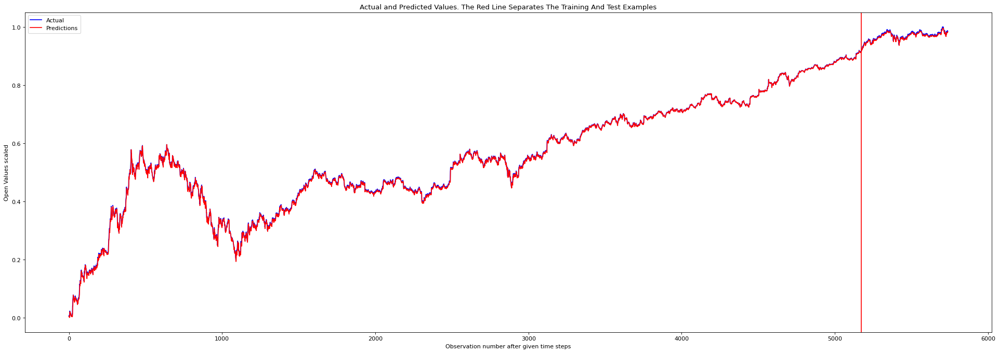

In [120]:
plot_result(y_train_log, y_test_log, train_predict_gru_rms, test_predict_gru_rms)

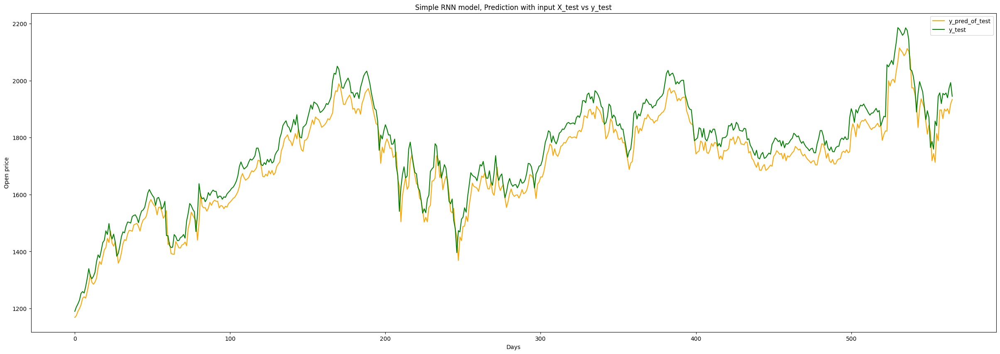

In [121]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(np.exp(scaler_log.inverse_transform(test_predict_gru_rms)), label = "y_pred_of_test", c = "orange")
plt.plot(np.exp(scaler_log.inverse_transform(y_test_log)), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.title("Simple RNN model, Prediction with input X_test vs y_test")
plt.legend()
plt.show()

# Multivariate Neural Networks

### Base multivariate neural network

In [233]:
df = amazon.copy()
df_values = df.iloc[:,1:]#.drop("Date", axis = 1)

df_dates = df.iloc[:,:1]
df_dates["Date"] = pd.to_datetime(df_dates['Date'])
df_dates = np.array(df_dates.values).reshape(-1, 1)

stock_data = np.array(np.log(df_values.values)).reshape(-1, 6) #astype('float32')

#stock_data = np.array(df_values.values).reshape(-1, 6) #astype('float32')
# scaler_mv = MinMaxScaler(feature_range=(0, 1))
# stock_data = scaler_mv.fit_transform(stock_data)#.flatten()
n = stock_data.shape[0]

train_percent = 0.95
split = int(n*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)]#.reshape(-1,6)
    # val_data = total_train_data[val_split:]#.reshape(-1,6)

df_dates_train = df_dates[range(split)]#.reshape(-1,1)
df_dates_test = df_dates[split:].reshape(-1,1)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/3563000222.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [188]:
def train_test_processing(train_data, test_data, time_steps, for_periods, col_name, pred_col):
    
    ts_train = train_data[col_name].values
    ts_test  = test_data[col_name].values
    ts_train_len = len(ts_train)
    ts_test_len = len(ts_test)
    
    # To dynamically fetch the column index based on the column name
    col_index = train_data.columns.tolist().index(pred_col)

    X_train = []
    y_train = []
    for i in range(time_steps, ts_train_len-(for_periods-1)): 
        X_train.append(ts_train[i-time_steps:i])
        y_train.append(ts_train[i, col_index])
        
    X_train, y_train = np.array(X_train), np.array(y_train)    
    X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1], len(col_name)))
    #y_train = np.reshape(y_train, (y_train.shape[0], for_periods, 1))

    X_test = []
    y_test = []
    for i in range(time_steps, ts_test_len-(for_periods-1)):
        X_test.append(ts_test[i-time_steps:i])
        y_test.append(ts_test[i, col_index])
        
    X_test, y_test = np.array(X_test), np.array(y_test)
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1], len(col_name)))
    #y_test = np.reshape(y_test, (y_train.shape[0], for_periods, 1))

    return X_train, y_train.reshape(-1,1), X_test, y_test.reshape(-1,1)

In [171]:
col_list = df_values.columns.to_list
col_list

<bound method IndexOpsMixin.tolist of Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')>

In [242]:
#col_list = df_values.columns

cols_to_work_with = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']
pred_col = 'High'

# Scaling the variable
scaler_mv = MinMaxScaler()
df_values[cols_to_work_with] = scaler_mv.fit_transform(df_values[cols_to_work_with].to_numpy())

scaler_mv = MinMaxScaler()
ss = scaler_mv.fit_transform(df_values[pred_col].to_numpy().reshape(-1, 1))

In [229]:
# scaler_list = []
# for i,j in enumerate(cols_to_work_with):
#     scaler = MinMaxScaler()
#     df_values[j] = scaler.fit_transform(df_values[j].to_numpy().reshape(-1,1))
#     scaler_list.append(scaler)

In [190]:
# Dividing the data set into 2.
length = len(df_values)

train_percent = 0.95
split = int(length*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

train_data = df_values.iloc[range(split)]
test_data = df_values.iloc[split:]
# print(length)
x_train_mv, y_train_mv, x_test_mv, y_test_mv = train_test_processing(train_data, test_data, 6, 3, cols_to_work_with, pred_col)

In [261]:
y_train_mv.shape

(5462, 1)

In [262]:
def stacked_GRU_mv(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=100, return_sequences=True, input_shape=(x_train.shape[1],x_train.shape[2]), activation='tanh'))
    model_gru.add(Bidirectional(GRU(50, return_sequences=True, recurrent_dropout=0.2)))
    model_gru.add(GRU(units=100, activation='tanh'))
    model_gru.add(Dropout(0.2))
    model_gru.add(Dense(units=1))

    # Compiling the RNN
    model_gru.compile(keras.optimizers.Adam(),loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model_gru
    # Fitting to the training set
    #model_gru.fit(X_train,y_train,epochs=50,batch_size=150, verbose=0)

In [191]:
model_gru_mv = stacked_GRU_mv(x_train_mv)
history_gru_mv = model_gru_mv.fit(x_train_mv,y_train_mv,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
274/274 - 6s - loss: 0.0010 - mean_absolute_error: 0.0157 - 6s/epoch - 23ms/step
Epoch 2/50
274/274 - 2s - loss: 3.7464e-04 - mean_absolute_error: 0.0114 - 2s/epoch - 9ms/step
Epoch 3/50
274/274 - 2s - loss: 5.1938e-04 - mean_absolute_error: 0.0132 - 2s/epoch - 8ms/step
Epoch 4/50
274/274 - 2s - loss: 3.1243e-04 - mean_absolute_error: 0.0101 - 2s/epoch - 9ms/step
Epoch 5/50
274/274 - 2s - loss: 3.6644e-04 - mean_absolute_error: 0.0114 - 2s/epoch - 9ms/step
Epoch 6/50
274/274 - 2s - loss: 2.5336e-04 - mean_absolute_error: 0.0091 - 2s/epoch - 9ms/step
Epoch 7/50
274/274 - 2s - loss: 2.9227e-04 - mean_absolute_error: 0.0099 - 2s/epoch - 9ms/step
Epoch 8/50
274/274 - 2s - loss: 3.5760e-04 - mean_absolute_error: 0.0109 - 2s/epoch - 9ms/step
Epoch 9/50
274/274 - 3s - loss: 2.2770e-04 - mean_absolute_error: 0.0083 - 3s/epoch - 9ms/step
Epoch 10/50
274/274 - 3s - loss: 1.8608e-04 - mean_absolute_error: 0.0074 - 3s/epoch - 9ms/step
Epoch 11/50
274/274 - 2s - loss: 3.1127e-04 - mean_a

In [192]:
# make predictions
train_predict_gru_mv = model_gru_mv.predict(x_train_mv)
test_predict_gru_mv = model_gru_mv.predict(x_test_mv)
# Mean square error
print_error(y_train_mv, y_test_mv, train_predict_gru_mv, test_predict_gru_mv)

9/9 [==============================] - 0s 3ms/step
Train RMSE: 0.004 RMSE
Test RMSE: 0.014 RMSE


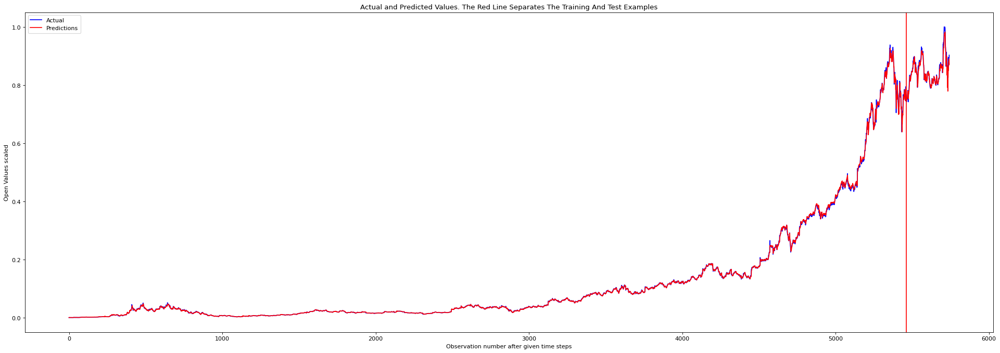

In [194]:
plot_result(y_train_mv, y_test_mv, train_predict_gru_mv, test_predict_gru_mv)

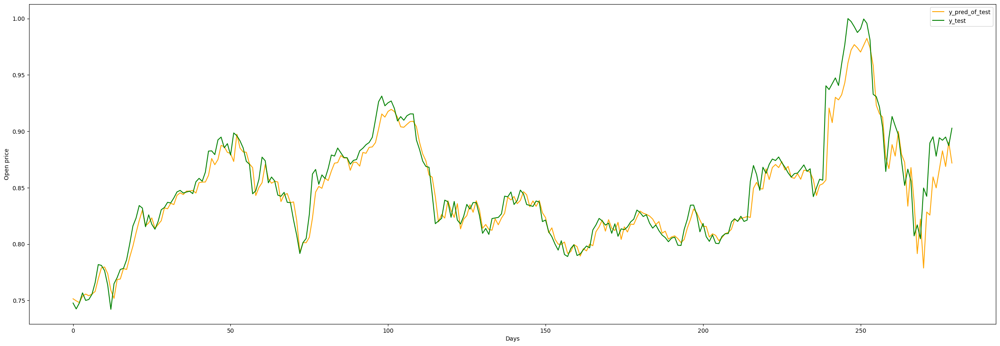

In [195]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.legend()             
plt.show()

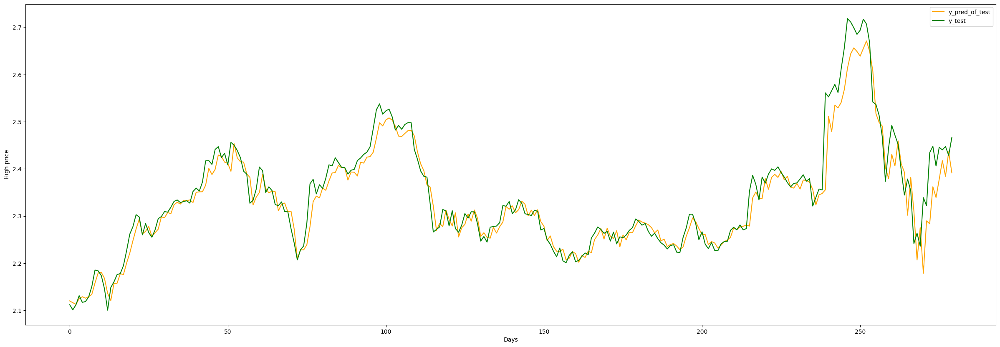

In [196]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(np.exp(scaler_mv.inverse_transform(test_predict_gru_mv))[:,:1].reshape(-1,1), label = "y_pred_of_test", c = "orange")
plt.plot(np.exp(scaler_mv.inverse_transform(y_test_mv))[:,:1].reshape(-1,1), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

### Stacked_gru

In [197]:
def stacked_GRU_mv2(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(64,return_sequences=True,input_shape = (x_train.shape[1],x_train.shape[2]))) #64 lstm neuron block
    model_gru.add(GRU(64, return_sequences= False))
    # model_lstm.add(Dense(32))
    model_gru.add(Dense(1))
    model_gru.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [198]:
model_gru_mv2 = stacked_GRU_mv2(x_train_mv)
history_gru_mv2 = model_gru_mv2.fit(x_train_mv,y_train_mv,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
274/274 - 3s - loss: 7.1091e-04 - mean_absolute_error: 0.0092 - 3s/epoch - 10ms/step
Epoch 2/50
274/274 - 1s - loss: 4.3346e-05 - mean_absolute_error: 0.0036 - 811ms/epoch - 3ms/step
Epoch 3/50
274/274 - 1s - loss: 5.4563e-05 - mean_absolute_error: 0.0044 - 819ms/epoch - 3ms/step
Epoch 4/50
274/274 - 1s - loss: 4.2849e-05 - mean_absolute_error: 0.0037 - 878ms/epoch - 3ms/step
Epoch 5/50
274/274 - 1s - loss: 4.4042e-05 - mean_absolute_error: 0.0040 - 893ms/epoch - 3ms/step
Epoch 6/50
274/274 - 1s - loss: 3.4197e-05 - mean_absolute_error: 0.0034 - 911ms/epoch - 3ms/step
Epoch 7/50
274/274 - 1s - loss: 3.6368e-05 - mean_absolute_error: 0.0036 - 939ms/epoch - 3ms/step
Epoch 8/50
274/274 - 1s - loss: 4.0015e-05 - mean_absolute_error: 0.0040 - 938ms/epoch - 3ms/step
Epoch 9/50
274/274 - 1s - loss: 3.8501e-05 - mean_absolute_error: 0.0039 - 869ms/epoch - 3ms/step
Epoch 10/50
274/274 - 1s - loss: 2.5372e-05 - mean_absolute_error: 0.0031 - 824ms/epoch - 3ms/step
Epoch 11/50
274/274 -

In [199]:
# make predictions
train_predict_gru_mv2 = model_gru_mv2.predict(x_train_mv)
test_predict_gru_mv2 = model_gru_mv2.predict(x_test_mv)
# Mean square error
print_error(y_train_mv, y_test_mv, train_predict_gru_mv2, test_predict_gru_mv2)

9/9 [==============================] - 0s 1ms/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.022 RMSE


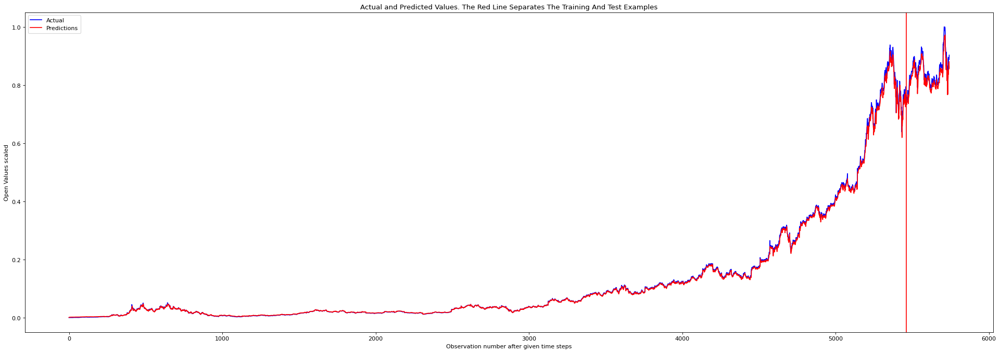

In [201]:
plot_result(y_train_mv, y_test_mv, train_predict_gru_mv2, test_predict_gru_mv2)

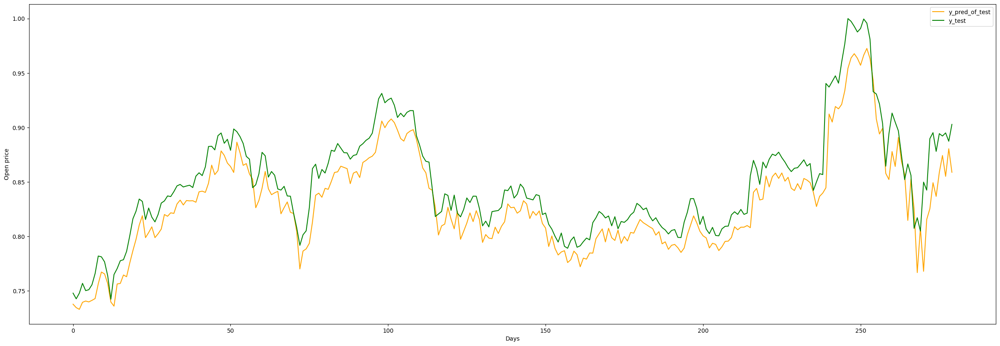

In [202]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv2, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.legend()             
plt.show()

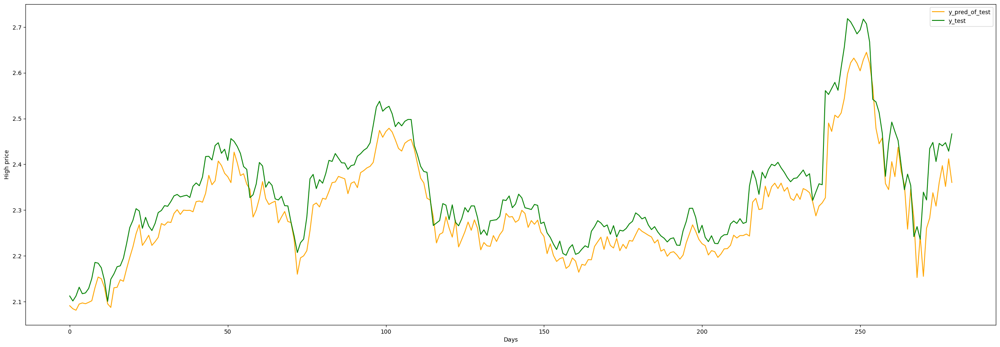

In [203]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(np.exp(scaler_mv.inverse_transform(test_predict_gru_mv2))[:,:1], label = "y_pred_of_test", c = "orange")
plt.plot(np.exp(scaler_mv.inverse_transform(y_test_mv))[:,:1], label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

### Adding two dense layers

In [205]:
def stacked_GRU_mv_2d(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=100, return_sequences=True, input_shape=(x_train.shape[1],6), activation='tanh'))
    model_gru.add(Bidirectional(GRU(50, return_sequences=True, recurrent_dropout=0.2)))
    model_gru.add(GRU(units=100, activation='tanh'))
    model_gru.add(Dropout(0.2))
    model_gru.add(Dense(units=8))
    model_gru.add(Dense(units=1))

    # Compiling the RNN
    model_gru.compile(keras.optimizers.Adam(),loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model_gru
    # Fitting to the training set
    #model_gru.fit(X_train,y_train,epochs=50,batch_size=150, verbose=0)

In [206]:
model_gru_mv_2d = stacked_GRU_mv_2d(x_train_mv)
history_gru_mv_2d = model_gru_mv_2d.fit(x_train_mv,y_train_mv,validation_data=(x_test_mv, y_test_mv), epochs=50,batch_size=20, verbose=2)

Epoch 1/50
274/274 - 8s - loss: 0.0011 - mean_absolute_error: 0.0180 - val_loss: 6.5586e-04 - val_mean_absolute_error: 0.0196 - 8s/epoch - 29ms/step
Epoch 2/50
274/274 - 3s - loss: 3.4015e-04 - mean_absolute_error: 0.0105 - val_loss: 9.6535e-04 - val_mean_absolute_error: 0.0274 - 3s/epoch - 10ms/step
Epoch 3/50
274/274 - 3s - loss: 4.3347e-04 - mean_absolute_error: 0.0126 - val_loss: 0.0044 - val_mean_absolute_error: 0.0633 - 3s/epoch - 10ms/step
Epoch 4/50
274/274 - 3s - loss: 4.0139e-04 - mean_absolute_error: 0.0118 - val_loss: 0.0035 - val_mean_absolute_error: 0.0561 - 3s/epoch - 9ms/step
Epoch 5/50
274/274 - 2s - loss: 4.3241e-04 - mean_absolute_error: 0.0120 - val_loss: 0.0022 - val_mean_absolute_error: 0.0443 - 2s/epoch - 9ms/step
Epoch 6/50
274/274 - 3s - loss: 2.5636e-04 - mean_absolute_error: 0.0093 - val_loss: 0.0071 - val_mean_absolute_error: 0.0823 - 3s/epoch - 9ms/step
Epoch 7/50
274/274 - 3s - loss: 3.2893e-04 - mean_absolute_error: 0.0102 - val_loss: 0.0064 - val_mean_ab

In [207]:
# make predictions
train_predict_gru_mv_2d = model_gru_mv_2d.predict(x_train_mv)
test_predict_gru_mv_2d = model_gru_mv_2d.predict(x_test_mv)
# Mean square error
print_error(y_train_mv, y_test_mv, train_predict_gru_mv_2d, test_predict_gru_mv_2d)

9/9 [==============================] - 0s 3ms/step
Train RMSE: 0.011 RMSE
Test RMSE: 0.041 RMSE


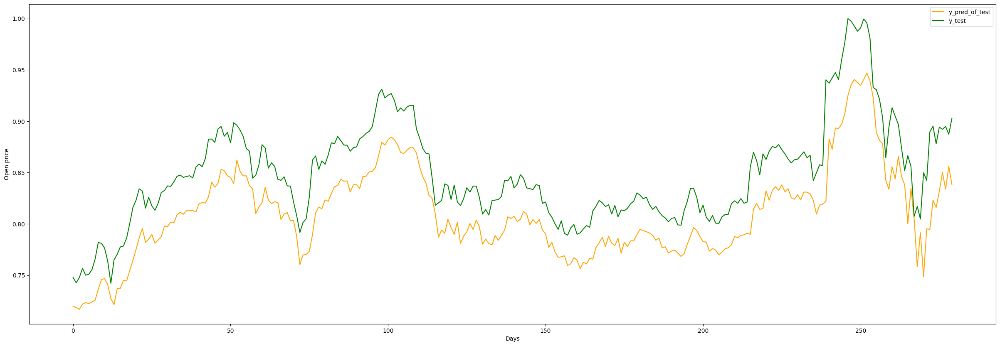

In [208]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv_2d, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.legend()             
plt.show()

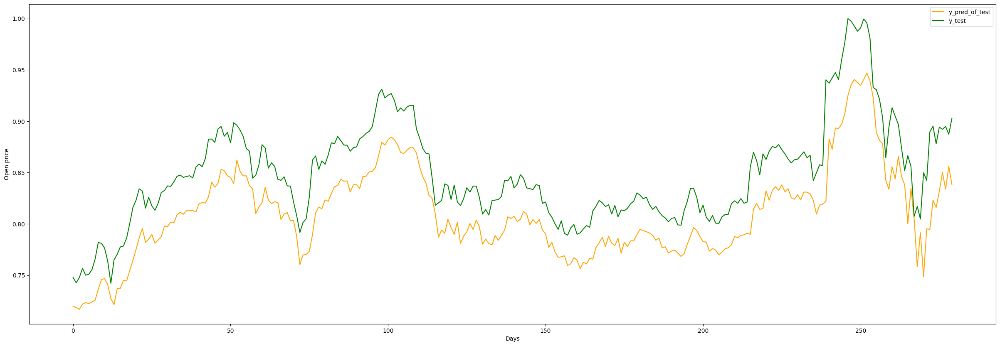

In [209]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv_2d, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("Open price")
plt.legend()             
plt.show()

## Adding Predictors

In [249]:
# cols = ['Date', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Open']
# df = df[cols]
df_values = amazon.iloc[:,1:]#.drop("Date", axis = 1)

df_values['RSI']=ta.rsi(df_values.Close, length=15)
df_values['EMAF']=ta.ema(df_values.Close, length=20)
df_values['EMAM']=ta.ema(df_values.Close, length=100)
df_values['EMAS']=ta.ema(df_values.Close, length=150) 

df_values['Target'] = df_values['Adj Close']-df_values.Open
df_values['Target'] = df_values['Target'].shift(-1)

df_values['TargetClass'] = [1 if df_values.Target.iloc[i]>0 else 0 for i in range(len(df_values))]

df_values['TargetNextHigh'] = df_values['High'].shift(-1)

# stock_data = np.array(df_values.values)
df_dates = amazon.iloc[:,:1]
df_dates["Date"] = pd.to_datetime(df_dates['Date'])
df_dates = np.array(df_dates.values).reshape(-1, 1)

df_values.dropna(inplace=True)
df_values.reset_index(inplace = True)
df_values.drop(['Volume', 'Close'], axis=1, inplace=True)

stock_data = np.array(df_values.values)#.reshape(-1, 13) #astype('float32')

stock_data.shape

train_percent = 0.95
# val_percent = 0.8889

scaler_mv = MinMaxScaler(feature_range=(0, 1))
stock_data = scaler_mv.fit_transform(stock_data)#.flatten()
n = stock_data.shape[0]
# Point for splitting data into train and test
split = int(n*train_percent)
train_data = stock_data[range(split)]#.reshape(-1,6)
test_data = stock_data[split:]#.reshape(-1,6)

# n_train = len(total_train_data)
# val_split = int(n_train*val_percent)
# train_data = total_train_data[range(val_split)]#.reshape(-1,6)
# val_data = total_train_data[val_split:]#.reshape(-1,6)

df_dates_train = df_dates[range(split)]#.reshape(-1,1)
df_dates_test = df_dates[split:].reshape(-1,1)
# df_dates_train = df_dates_train_total[range(val_split)]#.reshape(-1,1)
# df_dates_val = df_dates_train_total[val_split:]#.reshape(-1,1)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/1631180200.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [258]:
col_list = df_values.columns.to_list()
col_list

['index',
 'Open',
 'High',
 'Low',
 'Adj Close',
 'RSI',
 'EMAF',
 'EMAM',
 'EMAS',
 'Target',
 'TargetClass',
 'TargetNextHigh']

In [260]:
len(col_list)

12

In [251]:
#col_list = df_values.columns

cols_to_work_with = ['index', 'Open', 'High', 'Low', 'Adj Close', 'RSI', 'EMAF', 'EMAM',
       'EMAS', 'Target', 'TargetClass', 'TargetNextHigh']
pred_col = 'TargetNextHigh'

# Scaling the variable
scaler_mv = MinMaxScaler()
df_values[cols_to_work_with] = scaler_mv.fit_transform(df_values[cols_to_work_with].to_numpy())

scaler_mv = MinMaxScaler()
ss = scaler_mv.fit_transform(df_values[pred_col].to_numpy().reshape(-1, 1))

In [ ]:
# scaler_list = []
# for i,j in enumerate(cols_to_work_with):
#     scaler = MinMaxScaler()
#     df_values[j] = scaler.fit_transform(df_values[j].to_numpy().reshape(-1,1))
#     scaler_list.append(scaler)

In [263]:
# Dividing the data set into 2.
length = len(df_values)

train_percent = 0.95
split = int(length*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

train_data = df_values.iloc[range(split)]
test_data = df_values.iloc[split:]
# print(length)
x_train_mv, y_train_mv, x_test_mv, y_test_mv = train_test_processing(train_data, test_data, len(col_list), 1, cols_to_work_with, pred_col)

In [264]:
model_gru_mv3 = stacked_GRU_mv(x_train_mv)
history_gru_mv3 = model_gru_mv3.fit(x_train_mv,y_train_mv,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
266/266 - 8s - loss: 0.0018 - mean_absolute_error: 0.0218 - 8s/epoch - 30ms/step
Epoch 2/50
266/266 - 4s - loss: 4.8660e-04 - mean_absolute_error: 0.0139 - 4s/epoch - 16ms/step
Epoch 3/50
266/266 - 4s - loss: 3.8226e-04 - mean_absolute_error: 0.0124 - 4s/epoch - 16ms/step
Epoch 4/50
266/266 - 4s - loss: 3.3584e-04 - mean_absolute_error: 0.0111 - 4s/epoch - 17ms/step
Epoch 5/50
266/266 - 4s - loss: 3.5726e-04 - mean_absolute_error: 0.0116 - 4s/epoch - 15ms/step
Epoch 6/50
266/266 - 4s - loss: 3.4008e-04 - mean_absolute_error: 0.0112 - 4s/epoch - 15ms/step
Epoch 7/50
266/266 - 4s - loss: 3.7143e-04 - mean_absolute_error: 0.0121 - 4s/epoch - 15ms/step
Epoch 8/50
266/266 - 4s - loss: 3.5250e-04 - mean_absolute_error: 0.0113 - 4s/epoch - 15ms/step
Epoch 9/50
266/266 - 4s - loss: 2.9370e-04 - mean_absolute_error: 0.0108 - 4s/epoch - 16ms/step
Epoch 10/50
266/266 - 4s - loss: 2.8763e-04 - mean_absolute_error: 0.0099 - 4s/epoch - 15ms/step
Epoch 11/50
266/266 - 4s - loss: 3.1597e-04

In [265]:
# make predictions
train_predict_gru_mv3 = model_gru_mv3.predict(x_train_mv)
test_predict_gru_mv3 = model_gru_mv3.predict(x_test_mv)
# Mean square error
print_error(y_train_mv, y_test_mv, train_predict_gru_mv3, test_predict_gru_mv3)

9/9 [==============================] - 0s 5ms/step
Train RMSE: 0.015 RMSE
Test RMSE: 0.065 RMSE


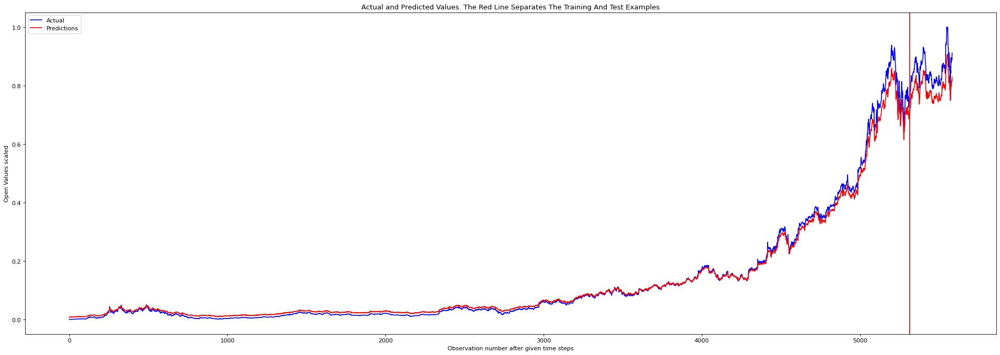

In [266]:
plot_result(y_train_mv, y_test_mv, train_predict_gru_mv3, test_predict_gru_mv3)

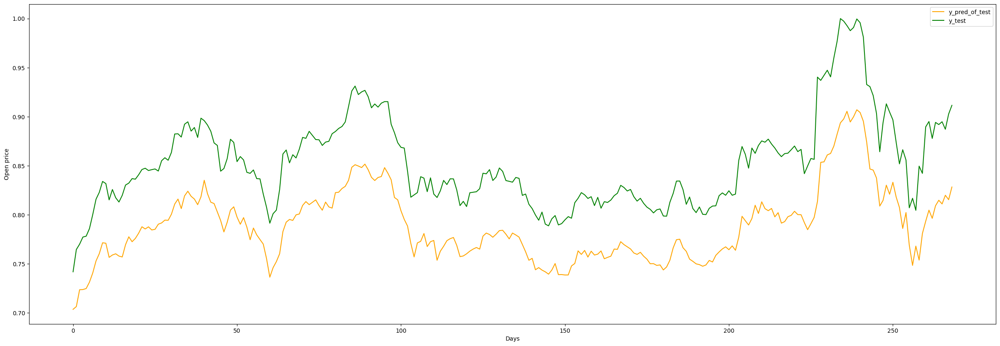

In [267]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv3, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

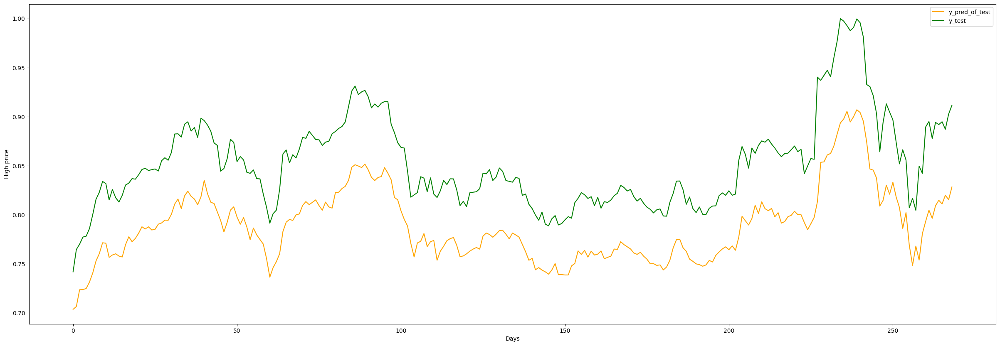

In [277]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler_mv.inverse_transform(test_predict_gru_mv3), label = "y_pred_of_test", c = "orange")
plt.plot(scaler_mv.inverse_transform(y_test_mv), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

In [269]:
model_gru_mv4 = stacked_GRU_mv2(x_train_mv)
history_gru_mv4 = model_gru_mv4.fit(x_train_mv,y_train_mv,epochs=50,batch_size=20, verbose=2)

Epoch 1/50
266/266 - 3s - loss: 9.9920e-04 - mean_absolute_error: 0.0123 - 3s/epoch - 12ms/step
Epoch 2/50
266/266 - 1s - loss: 4.0837e-05 - mean_absolute_error: 0.0039 - 1s/epoch - 5ms/step
Epoch 3/50
266/266 - 1s - loss: 4.2838e-05 - mean_absolute_error: 0.0044 - 1s/epoch - 6ms/step
Epoch 4/50
266/266 - 1s - loss: 4.8576e-05 - mean_absolute_error: 0.0048 - 1s/epoch - 5ms/step
Epoch 5/50
266/266 - 1s - loss: 2.7529e-05 - mean_absolute_error: 0.0035 - 1s/epoch - 5ms/step
Epoch 6/50
266/266 - 1s - loss: 3.9349e-05 - mean_absolute_error: 0.0041 - 1s/epoch - 5ms/step
Epoch 7/50
266/266 - 1s - loss: 2.8067e-05 - mean_absolute_error: 0.0035 - 1s/epoch - 5ms/step
Epoch 8/50
266/266 - 1s - loss: 2.6954e-05 - mean_absolute_error: 0.0035 - 1s/epoch - 5ms/step
Epoch 9/50
266/266 - 1s - loss: 3.0363e-05 - mean_absolute_error: 0.0039 - 1s/epoch - 5ms/step
Epoch 10/50
266/266 - 1s - loss: 4.2026e-05 - mean_absolute_error: 0.0044 - 1s/epoch - 5ms/step
Epoch 11/50
266/266 - 1s - loss: 4.3481e-05 - me

In [270]:
# make predictions
train_predict_gru_mv4 = model_gru_mv4.predict(x_train_mv)
test_predict_gru_mv4 = model_gru_mv4.predict(x_test_mv)
# Mean square error
print_error(y_train_mv, y_test_mv, train_predict_gru_mv4, test_predict_gru_mv4)

9/9 [==============================] - 0s 2ms/step
Train RMSE: 0.002 RMSE
Test RMSE: 0.006 RMSE


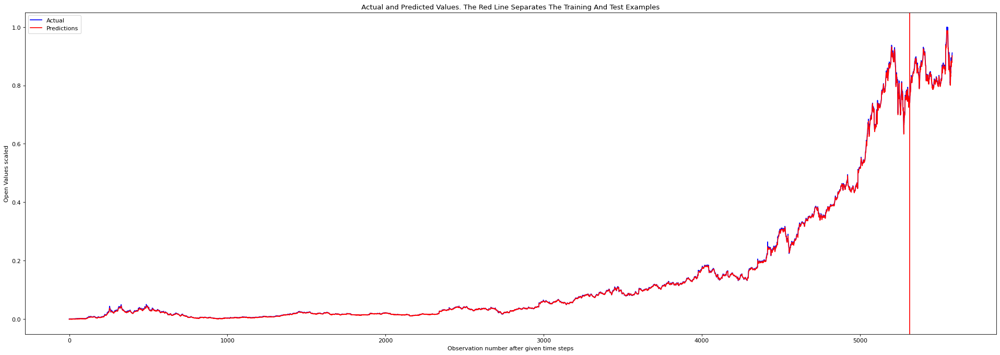

In [271]:
plot_result(y_train_mv, y_test_mv, train_predict_gru_mv4, test_predict_gru_mv4)

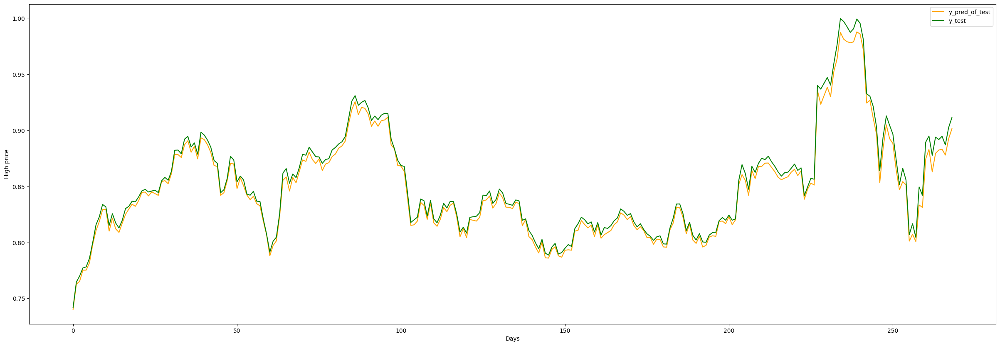

In [272]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(test_predict_gru_mv4, label = "y_pred_of_test", c = "orange")
plt.plot(y_test_mv, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

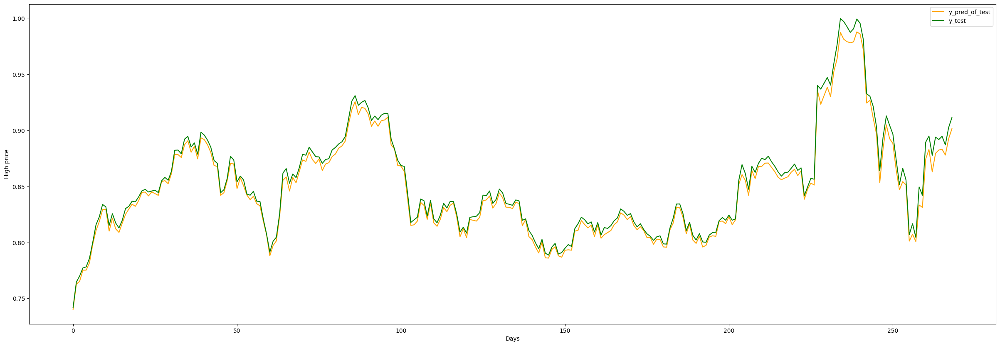

In [276]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler_mv.inverse_transform(test_predict_gru_mv4), label = "y_pred_of_test", c = "orange")
plt.plot(scaler_mv.inverse_transform(y_test_mv), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

## Predict for future days

In [368]:
# cols = ['Date', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Open']
# df = df[cols]
df_values = amazon.iloc[:,1:]#.drop("Date", axis = 1)

df_values['RSI']=ta.rsi(df_values.Close, length=15)
df_values['EMAF']=ta.ema(df_values.Close, length=20)
df_values['EMAM']=ta.ema(df_values.Close, length=100)
df_values['EMAS']=ta.ema(df_values.Close, length=150) 

df_values['Target'] = df_values['Adj Close']-df_values.Open
df_values['Target'] = df_values['Target'].shift(-1)

df_values['TargetClass'] = [1 if df_values.Target.iloc[i]>0 else 0 for i in range(len(df_values))]

df_values['TargetNextHigh'] = df_values['High'].shift(-1)

# stock_data = np.array(df_values.values)
df_dates = amazon.iloc[:,:1]
df_dates["Date"] = pd.to_datetime(df_dates['Date'])
df_dates = np.array(df_dates.values).reshape(-1, 1)

df_values.dropna(inplace=True)
df_values.reset_index(inplace = True)
df_values.drop(['Volume', 'Close'], axis=1, inplace=True)

# stock_data = np.array(df_values.values)#.reshape(-1, 13) #astype('float32')

# stock_data.shape

# train_percent = 0.95
# val_percent = 0.8889

# scaler_mv = MinMaxScaler(feature_range=(0, 1))
# stock_data = scaler_mv.fit_transform(stock_data)#.flatten()
# n = stock_data.shape[0]
# # Point for splitting data into train and test
# split = int(n*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

# n_train = len(total_train_data)
# val_split = int(n_train*val_percent)
# train_data = total_train_data[range(val_split)]#.reshape(-1,6)
# val_data = total_train_data[val_split:]#.reshape(-1,6)

df_dates_train = df_dates[range(split)]#.reshape(-1,1)
df_dates_test = df_dates[split:].reshape(-1,1)
# df_dates_train = df_dates_train_total[range(val_split)]#.reshape(-1,1)
# df_dates_val = df_dates_train_total[val_split:]#.reshape(-1,1)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/4256869195.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [369]:
def train_test_processing2(train_data, test_data, time_steps, for_periods, col_name, pred_col):
    
    ts_train = train_data[col_name].values
    ts_test  = test_data[col_name].values
    ts_train_len = len(ts_train)
    ts_test_len = len(ts_test)
    
    # To dynamically fetch the column index based on the column name
    col_index = train_data.columns.tolist().index(pred_col)

    X_train = []
    y_train = []
    for i in range(time_steps, ts_train_len-(for_periods-1)): 
        X_train.append(ts_train[i-time_steps:i])
        y_train.append(ts_train[i:i+for_periods, col_index])
        
    X_train, y_train = np.array(X_train), np.array(y_train)    
    X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1], len(col_name)))
    #y_train = np.reshape(y_train, (y_train.shape[0], for_periods, 1))

    X_test = []
    y_test = []
    for i in range(time_steps, ts_test_len-(for_periods-1)):
        X_test.append(ts_test[i-time_steps:i])
        y_test.append(ts_test[i:i+for_periods, col_index])
        
    X_test, y_test = np.array(X_test), np.array(y_test)
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1], len(col_name)))
    #y_test = np.reshape(y_test, (y_train.shape[0], for_periods, 1))

    return X_train, y_train, X_test, y_test

In [370]:
col_list = df_values.columns.to_list()
col_list

['index',
 'Open',
 'High',
 'Low',
 'Adj Close',
 'RSI',
 'EMAF',
 'EMAM',
 'EMAS',
 'Target',
 'TargetClass',
 'TargetNextHigh']

In [371]:
#col_list = df_values.columns

cols_to_work_with = ['index', 'Open', 'High', 'Low', 'Adj Close', 'RSI', 'EMAF', 'EMAM',
       'EMAS', 'Target', 'TargetClass', 'TargetNextHigh']
pred_col = 'TargetNextHigh'

# Scaling the variable
scaler_mv_mm = MinMaxScaler()
df_values[cols_to_work_with] = scaler_mv_mm.fit_transform(df_values[cols_to_work_with].to_numpy())

scaler_mv_mm_2 = MinMaxScaler()
ss = scaler_mv_mm_2.fit_transform(df_values[pred_col].to_numpy().reshape(-1, 1))

In [372]:
# Dividing the data set into 2.
length = len(df_values)
train_percent = 0.95
split = int(length*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

train_data = df_values.iloc[range(split)]
test_data = df_values.iloc[split:]
x_train_multi, y_train_multi, x_test_multi, y_test_multi = train_test_processing2(train_data, test_data, 10, 3, cols_to_work_with, pred_col)

In [373]:
y_train_multi.shape

(5315, 3)

In [374]:
def stacked_GRU_mv_multi(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=100, return_sequences=True, input_shape=(x_train.shape[1],x_train.shape[2]), activation='tanh'))
    model_gru.add(Bidirectional(GRU(50, return_sequences=True, recurrent_dropout=0.2)))
    model_gru.add(GRU(units=100, activation='tanh'))
    model_gru.add(Dropout(0.2))
    model_gru.add(Dense(units=3))

    # Compiling the RNN
    model_gru.compile(keras.optimizers.Adam(),loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model_gru
    # Fitting to the training set
    #model_gru.fit(X_train,y_train,epochs=50,batch_size=150, verbose=0)

In [375]:
def stacked_GRU_mv_multi2(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(64,return_sequences=True,input_shape = (x_train.shape[1],x_train.shape[2]))) #64 lstm neuron block
    model_gru.add(GRU(64, return_sequences= False))
    # model_lstm.add(Dense(32))
    model_gru.add(Dense(3))
    model_gru.compile(loss = "mean_squared_error", optimizer = "adam", metrics = tf.keras.metrics.MeanAbsoluteError())
    return model_gru

In [376]:
model_gru_mv_multi = stacked_GRU_mv_multi(x_train_multi)
history_gru_mv_multi = model_gru_mv_multi.fit(x_train_multi,y_train_multi, validation_data=(x_test_multi, y_test_multi), epochs=50,batch_size=20, verbose=2)

Epoch 1/50
266/266 - 8s - loss: 0.0013 - mean_absolute_error: 0.0213 - val_loss: 0.0012 - val_mean_absolute_error: 0.0270 - 8s/epoch - 29ms/step
Epoch 2/50
266/266 - 3s - loss: 6.5658e-04 - mean_absolute_error: 0.0152 - val_loss: 7.3554e-04 - val_mean_absolute_error: 0.0205 - 3s/epoch - 13ms/step
Epoch 3/50
266/266 - 3s - loss: 5.1079e-04 - mean_absolute_error: 0.0130 - val_loss: 0.0014 - val_mean_absolute_error: 0.0316 - 3s/epoch - 13ms/step
Epoch 4/50
266/266 - 4s - loss: 4.9358e-04 - mean_absolute_error: 0.0132 - val_loss: 0.0034 - val_mean_absolute_error: 0.0534 - 4s/epoch - 13ms/step
Epoch 5/50
266/266 - 3s - loss: 4.0800e-04 - mean_absolute_error: 0.0120 - val_loss: 5.7915e-04 - val_mean_absolute_error: 0.0177 - 3s/epoch - 13ms/step
Epoch 6/50
266/266 - 4s - loss: 4.1137e-04 - mean_absolute_error: 0.0117 - val_loss: 0.0082 - val_mean_absolute_error: 0.0865 - 4s/epoch - 13ms/step
Epoch 7/50
266/266 - 4s - loss: 3.7489e-04 - mean_absolute_error: 0.0115 - val_loss: 5.1111e-04 - val_

In [377]:
# make predictions
train_predict_gru_multi = model_gru_mv_multi.predict(x_train_multi)
test_predict_gru_multi = model_gru_mv_multi.predict(x_test_multi)
# Mean square error
print_error(y_train_multi, y_test_multi, train_predict_gru_multi, test_predict_gru_multi)

9/9 [==============================] - 0s 4ms/step
Train RMSE: 0.007 RMSE
Test RMSE: 0.022 RMSE


In [378]:
dataframe_train_preds = pd.DataFrame(train_predict_gru_multi, columns = ['Day_1','Day_2','Day_3'])
dataframe_train_preds['Day_2'] = dataframe_train_preds['Day_2'].shift(1, fill_value=0)
dataframe_train_preds['Day_3'] = dataframe_train_preds['Day_3'].shift(2, fill_value=0)
dataframe_train_preds_final = dataframe_train_preds.sum(axis=1)
dataframe_train_preds_final[1] = dataframe_train_preds_final[1]/2
dataframe_train_preds_final[2:] = dataframe_train_preds_final[2:]/3

In [379]:
dataframe_test_preds = pd.DataFrame(test_predict_gru_multi, columns = ['Day_1','Day_2','Day_3'])
dataframe_test_preds['Day_2'] = dataframe_test_preds['Day_2'].shift(1, fill_value=0)
dataframe_test_preds['Day_3'] = dataframe_test_preds['Day_3'].shift(2, fill_value=0)
dataframe_test_preds_final = dataframe_test_preds.sum(axis=1)
dataframe_test_preds_final[1] = dataframe_test_preds_final[1]/2
dataframe_test_preds_final[2:] = dataframe_test_preds_final[2:]/3

In [381]:
dataframe_train = pd.DataFrame(y_train_multi, columns = ['Day_1','Day_2','Day_3'])['Day_1']
dataframe_test = pd.DataFrame(y_test_multi, columns = ['Day_1','Day_2','Day_3'])['Day_1']

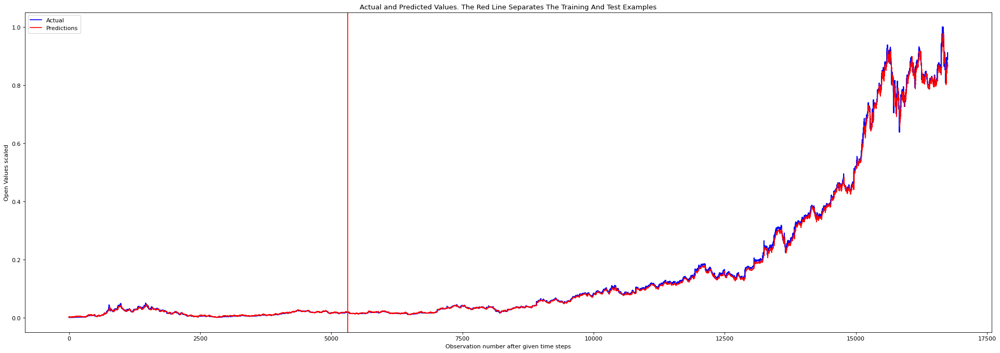

In [382]:
plot_result(y_train_multi, y_test_multi, train_predict_gru_multi, test_predict_gru_multi)

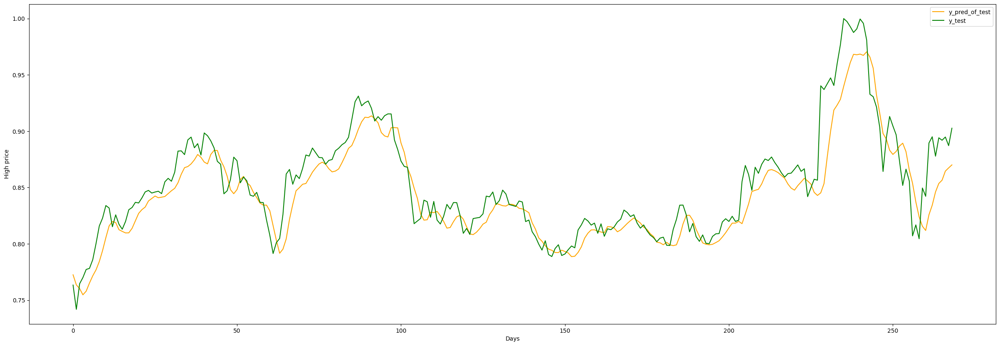

In [383]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(dataframe_test_preds_final, label = "y_pred_of_test", c = "orange")
plt.plot(dataframe_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

In [384]:
model_gru_mv_multi2 = stacked_GRU_mv_multi2(x_train_multi)
history_gru_mv_multi2 = model_gru_mv_multi2.fit(x_train_multi,y_train_multi, validation_data=(x_test_multi, y_test_multi), epochs=50,batch_size=20, verbose=2)

Epoch 1/50
266/266 - 4s - loss: 8.9390e-04 - mean_absolute_error: 0.0130 - val_loss: 9.2460e-04 - val_mean_absolute_error: 0.0232 - 4s/epoch - 13ms/step
Epoch 2/50
266/266 - 1s - loss: 9.8379e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0013 - val_mean_absolute_error: 0.0279 - 1s/epoch - 5ms/step
Epoch 3/50
266/266 - 1s - loss: 9.3571e-05 - mean_absolute_error: 0.0062 - val_loss: 7.2187e-04 - val_mean_absolute_error: 0.0212 - 1s/epoch - 4ms/step
Epoch 4/50
266/266 - 1s - loss: 1.0490e-04 - mean_absolute_error: 0.0064 - val_loss: 4.9668e-04 - val_mean_absolute_error: 0.0163 - 1s/epoch - 5ms/step
Epoch 5/50
266/266 - 1s - loss: 8.7862e-05 - mean_absolute_error: 0.0061 - val_loss: 8.3977e-04 - val_mean_absolute_error: 0.0232 - 1s/epoch - 5ms/step
Epoch 6/50
266/266 - 1s - loss: 8.3342e-05 - mean_absolute_error: 0.0060 - val_loss: 4.8783e-04 - val_mean_absolute_error: 0.0161 - 1s/epoch - 5ms/step
Epoch 7/50
266/266 - 1s - loss: 6.4278e-05 - mean_absolute_error: 0.0049 - val_loss: 5.0427

In [385]:
# make predictions
train_predict_gru_multi2 = model_gru_mv_multi2.predict(x_train_multi)
test_predict_gru_multi2 = model_gru_mv_multi2.predict(x_test_multi)
# Mean square error
print_error(y_train_multi, y_test_multi, train_predict_gru_multi2, test_predict_gru_multi2)

9/9 [==============================] - 0s 1ms/step
Train RMSE: 0.006 RMSE
Test RMSE: 0.021 RMSE


In [386]:
dataframe_train_preds = pd.DataFrame(train_predict_gru_multi2, columns = ['Day_1','Day_2','Day_3'])
dataframe_train_preds['Day_2'] = dataframe_train_preds['Day_2'].shift(1, fill_value=0)
dataframe_train_preds['Day_3'] = dataframe_train_preds['Day_3'].shift(2, fill_value=0)
dataframe_train_preds_final = dataframe_train_preds.sum(axis=1)
dataframe_train_preds_final[1] = dataframe_train_preds_final[1]/2
dataframe_train_preds_final[2:] = dataframe_train_preds_final[2:]/3

In [387]:
dataframe_test_preds = pd.DataFrame(test_predict_gru_multi2, columns = ['Day_1','Day_2','Day_3'])
dataframe_test_preds['Day_2'] = dataframe_test_preds['Day_2'].shift(1, fill_value=0)
dataframe_test_preds['Day_3'] = dataframe_test_preds['Day_3'].shift(2, fill_value=0)
dataframe_test_preds_final = dataframe_test_preds.sum(axis=1)
dataframe_test_preds_final[1] = dataframe_test_preds_final[1]/2
dataframe_test_preds_final[2:] = dataframe_test_preds_final[2:]/3

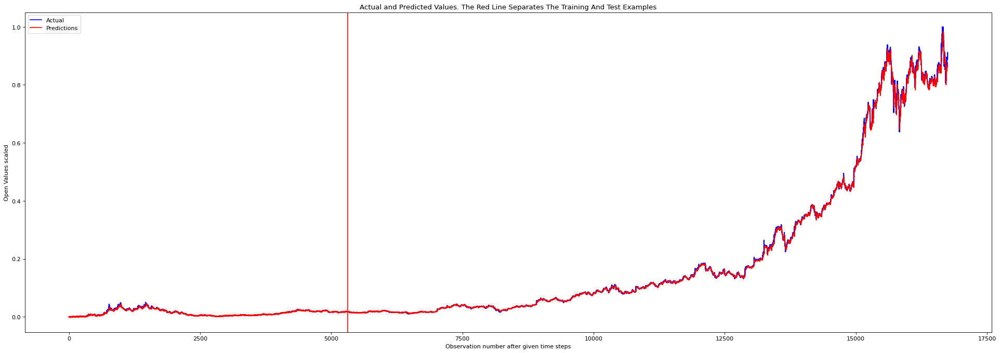

In [388]:
plot_result(y_train_multi, y_test_multi, train_predict_gru_multi2, test_predict_gru_multi2)

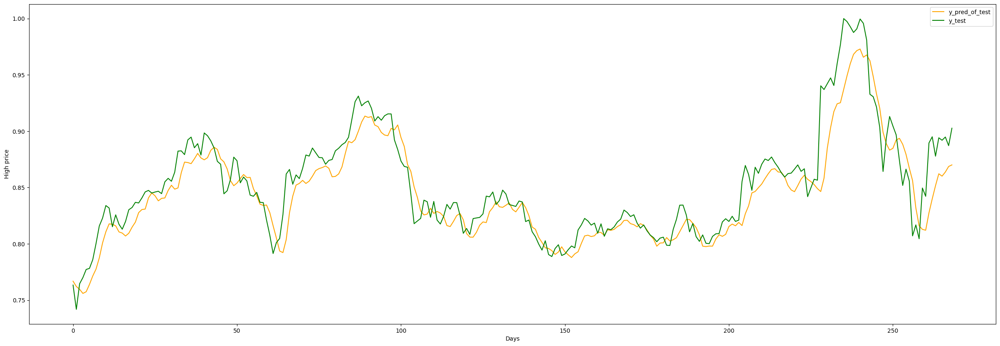

In [389]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(dataframe_test_preds_final, label = "y_pred_of_test", c = "orange")
plt.plot(dataframe_test, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

## Predict High and Target Price Price together

In [437]:
# cols = ['Date', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Open']
# df = df[cols]
df_values = amazon.iloc[:,1:]#.drop("Date", axis = 1)

df_values['RSI']=ta.rsi(df_values.Close, length=15)
df_values['EMAF']=ta.ema(df_values.Close, length=20)
df_values['EMAM']=ta.ema(df_values.Close, length=100)
df_values['EMAS']=ta.ema(df_values.Close, length=150) 

df_values['Target'] = df_values['Adj Close']-df_values.Open
df_values['Target'] = df_values['Target'].shift(-1)

df_values['TargetClass'] = [1 if df_values.Target.iloc[i]>0 else 0 for i in range(len(df_values))]

df_values['TargetNextHigh'] = df_values['High'].shift(-1)

# stock_data = np.array(df_values.values)
df_dates = amazon.iloc[:,:1]
df_dates["Date"] = pd.to_datetime(df_dates['Date'])
df_dates = np.array(df_dates.values).reshape(-1, 1)

df_values.dropna(inplace=True)
df_values.reset_index(inplace = True)
df_values.drop(['Volume', 'Close'], axis=1, inplace=True)

# stock_data = np.array(df_values.values)#.reshape(-1, 13) #astype('float32')

# stock_data.shape

# train_percent = 0.95
# # val_percent = 0.8889

# scaler_mv = MinMaxScaler(feature_range=(0, 1))
# stock_data = scaler_mv.fit_transform(stock_data)#.flatten()
# n = stock_data.shape[0]
# # Point for splitting data into train and test
# split = int(n*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

# # n_train = len(total_train_data)
# # val_split = int(n_train*val_percent)
# # train_data = total_train_data[range(val_split)]#.reshape(-1,6)
# # val_data = total_train_data[val_split:]#.reshape(-1,6)

# df_dates_train = df_dates[range(split)]#.reshape(-1,1)
# df_dates_test = df_dates[split:].reshape(-1,1)
# df_dates_train = df_dates_train_total[range(val_split)]#.reshape(-1,1)
# df_dates_val = df_dates_train_total[val_split:]#.reshape(-1,1)

/var/folders/qs/f4f7rp2n533389ps2l17f95m0000gn/T/ipykernel_17627/509301785.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates["Date"] = pd.to_datetime(df_dates['Date'])


In [438]:
col_list = df_values.columns.to_list()
col_list

['index',
 'Open',
 'High',
 'Low',
 'Adj Close',
 'RSI',
 'EMAF',
 'EMAM',
 'EMAS',
 'Target',
 'TargetClass',
 'TargetNextHigh']

In [439]:
df_values['TargetClass'].dtype

dtype('int64')

In [440]:
#col_list = df_values.columns

cols_to_work_with = ['index', 'Open', 'High', 'Low', 'Adj Close', 'RSI', 'EMAF', 'EMAM',
       'EMAS', 'Target', 'TargetClass', 'TargetNextHigh']
pred_col = ['Target', 'TargetNextHigh']
cols_to_scale = ['index', 'Open', 'High', 'Low', 'Adj Close', 'RSI', 'EMAF', 'EMAM',
       'EMAS', 'Target', 'TargetNextHigh']

# Scaling the variable
scaler_mv = MinMaxScaler()
df_values[cols_to_scale] = scaler_mv.fit_transform(df_values[cols_to_scale].to_numpy())

scaler_mv = MinMaxScaler()
ss = scaler_mv.fit_transform(df_values[pred_col].to_numpy().reshape(-1, 1))

In [461]:
def train_test_processing3(train_data, test_data, time_steps, for_periods, col_name, pred_col):
    
    ts_train = train_data[col_name].values
    ts_test  = test_data[col_name].values
    ts_train_y = train_data[pred_col].values
    ts_test_y = test_data[pred_col].values
    ts_train_len = len(ts_train)
    ts_test_len = len(ts_test)
    
    # To dynamically fetch the column index based on the column name
    #col_index = train_data.columns.tolist().index(pred_col)

    X_train = []
    y_train = []
    for i in range(time_steps, ts_train_len-(for_periods-1)): 
        X_train.append(ts_train[i-time_steps:i])
        y_train.append(ts_train_y[i:i+for_periods])
        
    X_train, y_train = np.array(X_train), np.array(y_train)  
    X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1], len(col_name)))
    y_train = np.reshape(y_train, (y_train.shape[0],len(pred_col)))
    #y_train = np.reshape(y_train, (y_train.shape[0], for_periods, 1))

    X_test = []
    y_test = []
    for i in range(time_steps, ts_test_len-(for_periods-1)):
        X_test.append(ts_test[i-time_steps:i])
        y_test.append(ts_test_y[i:i+for_periods])
        
    X_test, y_test = np.array(X_test), np.array(y_test)
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1], len(col_name)))
    y_test = np.reshape(y_test, (y_test.shape[0], len(pred_col)))
    #y_test = np.reshape(y_test, (y_train.shape[0], for_periods, 1))

    return X_train, y_train, X_test, y_test

In [462]:
# Dividing the data set into 2.
length = len(df_values)

train_percent = 0.95
split = int(length*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

train_data = df_values.iloc[range(split)]
test_data = df_values.iloc[split:]
# print(length)
x_train_multi3, y_train_multi3, x_test_multi3, y_test_multi3 = train_test_processing3(train_data, test_data, 10, 1, cols_to_work_with, pred_col)

In [463]:
y_train_multi3

array([[5.42635800e-01, 2.81716852e-04],
       [5.42215641e-01, 2.53067688e-04],
       [5.43452774e-01, 2.24418524e-04],
       ...,
       [4.53591891e-01, 7.44660354e-01],
       [6.61945717e-01, 7.46993526e-01],
       [5.07417058e-01, 7.47419850e-01]])

In [464]:
def stacked_GRU_mv_multi3(x_train):
    model_gru = Sequential()
    model_gru.add(GRU(units=100, return_sequences=True, input_shape=(x_train.shape[1],x_train.shape[2]), activation='tanh'))
    model_gru.add(Bidirectional(GRU(50, return_sequences=True, recurrent_dropout=0.2)))
    model_gru.add(GRU(units=100, activation='tanh'))
    model_gru.add(Dropout(0.2))
    model_gru.add(Dense(units=2))

    # Compiling the RNN
    model_gru.compile(keras.optimizers.Adam(),loss='mean_squared_error', metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model_gru
    # Fitting to the training set
    #model_gru.fit(X_train,y_train,epochs=50,batch_size=150, verbose=0)

In [465]:
model_gru_mv_multi3 = stacked_GRU_mv_multi3(x_train_multi3)
history_gru_mv_multi3 = model_gru_mv_multi3.fit(x_train_multi3,y_train_multi3, validation_data=(x_test_multi3, y_test_multi3), epochs=50,batch_size=20, verbose=2)

Epoch 1/50
266/266 - 9s - loss: 0.0045 - mean_absolute_error: 0.0416 - val_loss: 0.0095 - val_mean_absolute_error: 0.0632 - 9s/epoch - 33ms/step
Epoch 2/50
266/266 - 3s - loss: 0.0020 - mean_absolute_error: 0.0301 - val_loss: 0.0058 - val_mean_absolute_error: 0.0476 - 3s/epoch - 13ms/step
Epoch 3/50
266/266 - 3s - loss: 0.0017 - mean_absolute_error: 0.0276 - val_loss: 0.0122 - val_mean_absolute_error: 0.0755 - 3s/epoch - 13ms/step
Epoch 4/50
266/266 - 3s - loss: 0.0017 - mean_absolute_error: 0.0267 - val_loss: 0.0121 - val_mean_absolute_error: 0.0734 - 3s/epoch - 13ms/step
Epoch 5/50
266/266 - 3s - loss: 0.0015 - mean_absolute_error: 0.0245 - val_loss: 0.0064 - val_mean_absolute_error: 0.0580 - 3s/epoch - 13ms/step
Epoch 6/50
266/266 - 3s - loss: 0.0014 - mean_absolute_error: 0.0236 - val_loss: 0.0058 - val_mean_absolute_error: 0.0499 - 3s/epoch - 13ms/step
Epoch 7/50
266/266 - 3s - loss: 0.0014 - mean_absolute_error: 0.0234 - val_loss: 0.0079 - val_mean_absolute_error: 0.0574 - 3s/epo

In [460]:
train_predict_gru_multi3.shape

(5317, 2)

In [467]:
# make predictions
train_predict_gru_multi3 = model_gru_mv_multi3.predict(x_train_multi3)
test_predict_gru_multi3 = model_gru_mv_multi3.predict(x_test_multi3)
# Mean square error
print_error(y_train_multi3, y_test_multi3, train_predict_gru_multi3, test_predict_gru_multi3)

9/9 [==============================] - 0s 4ms/step
Train RMSE: 0.028 RMSE
Test RMSE: 0.077 RMSE


In [456]:
def print_error_multi(y_train, y_test, train_predict, test_predict):    
    # Error of predictions
    for i in range(y_train.shape[1]):
        train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
        test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))
    # train_rmse = math.sqrt(mean_squared_error(y_train, train_predict))
    # test_rmse = math.sqrt(mean_squared_error(y_test, test_predict))
    # Print RMSE
        print("Metrics for column", i)
        print('Train RMSE: %.3f RMSE' % (train_rmse))
        print('Test RMSE: %.3f RMSE' % (test_rmse))    


In [468]:
train_predictions_target = train_predict_gru_multi3[0]
train_predictions_targetnexthigh = train_predict_gru_multi3[1]

In [469]:
test_predictions_target = test_predict_gru_multi3[0]
test_predictions_targetnexthigh = test_predict_gru_multi3[1]

In [470]:
train_truth_target = train_predict_gru_multi3[0]
train_truth_targetnexthigh = train_predict_gru_multi3[1]
test_truth_target = test_predict_gru_multi3[0]
test_truth_targetnexthigh = test_predict_gru_multi3[1]

In [ ]:
dataframe_train_preds = pd.DataFrame(train_predict_gru_multi, columns = ['Day_1','Day_2','Day_3'])
dataframe_train_preds['Day_2'] = dataframe_train_preds['Day_2'].shift(1, fill_value=0)
dataframe_train_preds['Day_3'] = dataframe_train_preds['Day_3'].shift(2, fill_value=0)
dataframe_train_preds_final = dataframe_train_preds.sum(axis=1)
dataframe_train_preds_final[1] = dataframe_train_preds_final[1]/2
dataframe_train_preds_final[2:] = dataframe_train_preds_final[2:]/3

In [ ]:
dataframe_test_preds = pd.DataFrame(test_predict_gru_multi, columns = ['Day_1','Day_2','Day_3'])
dataframe_test_preds['Day_2'] = dataframe_test_preds['Day_2'].shift(1, fill_value=0)
dataframe_test_preds['Day_3'] = dataframe_test_preds['Day_3'].shift(2, fill_value=0)
dataframe_test_preds_final = dataframe_test_preds.sum(axis=1)
dataframe_test_preds_final[1] = dataframe_test_preds_final[1]/2
dataframe_test_preds_final[2:] = dataframe_test_preds_final[2:]/3

In [ ]:
dataframe_train = pd.DataFrame(y_train_multi, columns = ['Day_1','Day_2','Day_3'])['Day_1']
dataframe_test = pd.DataFrame(y_test_multi, columns = ['Day_1','Day_2','Day_3'])['Day_1']

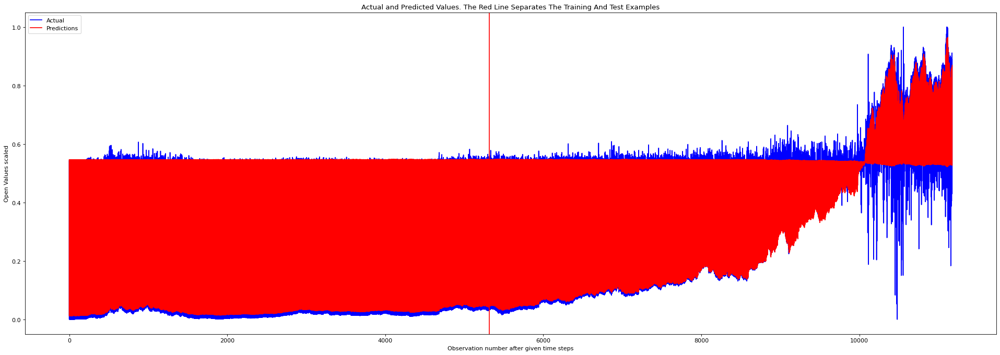

In [473]:
plot_result(y_train_multi3, y_test_multi3, train_predict_gru_multi3, test_predict_gru_multi3)

array([[0.53149337, 0.7567749 ],
       [0.5322225 , 0.7419011 ],
       [0.53272283, 0.7349886 ],
       [0.53216916, 0.74118584],
       [0.5325008 , 0.7441293 ],
       [0.53220075, 0.7511656 ],
       [0.53105474, 0.7631877 ],
       [0.5317616 , 0.7592782 ],
       [0.5309775 , 0.7764628 ],
       [0.5308716 , 0.7821068 ],
       [0.52991694, 0.79943645],
       [0.5294065 , 0.8080906 ],
       [0.5295454 , 0.8026275 ],
       [0.5298855 , 0.79729193],
       [0.5293173 , 0.8003464 ],
       [0.52949584, 0.79935753],
       [0.5304166 , 0.7883431 ],
       [0.5293835 , 0.79938763],
       [0.5298354 , 0.80150664],
       [0.52976733, 0.808093  ],
       [0.52861655, 0.81871283],
       [0.5284504 , 0.82209545],
       [0.5293788 , 0.8140975 ],
       [0.52899873, 0.8254175 ],
       [0.52813524, 0.83142984],
       [0.5290296 , 0.8218754 ],
       [0.52805513, 0.8324538 ],
       [0.5279751 , 0.8308137 ],
       [0.52908075, 0.82245725],
       [0.5289106 , 0.8279484 ],
       [0.

In [521]:
preds_target = []
preds_targetnexthigh = []
for i,j in enumerate(test_predict_gru_multi3):
    preds_target.append(j[0])
    preds_targetnexthigh.append(j[1])

In [524]:
truth_target = []
truth_targetnexthigh = []
for i,j in enumerate(y_test_multi3):
    truth_target.append(j[0])
    truth_targetnexthigh.append(j[1])

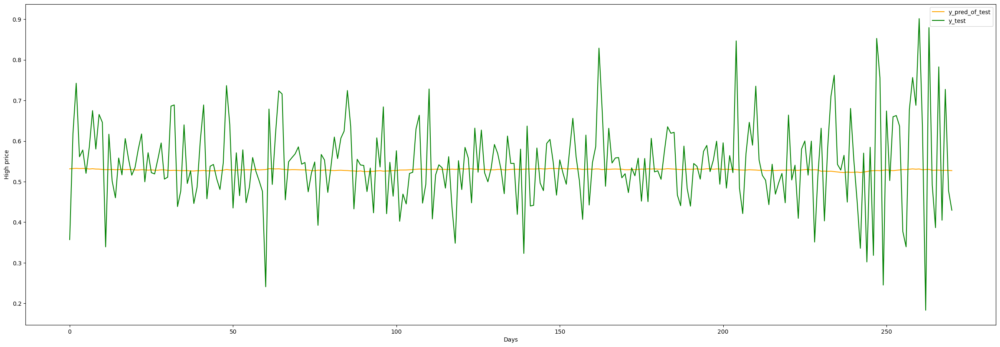

In [525]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(preds_target, label = "y_pred_of_test", c = "orange")
plt.plot(truth_target, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

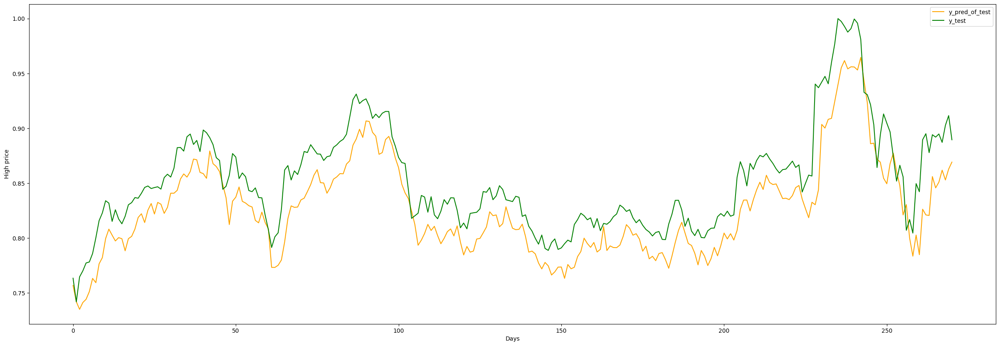

In [526]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(preds_targetnexthigh, label = "y_pred_of_test", c = "orange")
plt.plot(truth_targetnexthigh, label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()

# Comparison

In [486]:
from sklearn.linear_model import LinearRegression

In [483]:
df = amazon.copy()
df_values = df.iloc[:,1:]#.drop("Date", axis = 1)

df_dates = df.iloc[:,:1]
df["Date"] = pd.to_datetime(df['Date'])
df_dates = np.array(df_dates.values).reshape(-1, 1)

#stock_data = np.array(np.log(df.values)).reshape(-1, 6) #astype('float32')

#stock_data = np.array(df_values.values).reshape(-1, 6) #astype('float32')
# scaler_mv = MinMaxScaler(feature_range=(0, 1))
# stock_data = scaler_mv.fit_transform(stock_data)#.flatten()
n = stock_data.shape[0]

train_percent = 0.95
split = int(n*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

    # n_train = len(total_train_data)
    # val_split = int(n_train*val_percent)
    # train_data = total_train_data[range(val_split)]#.reshape(-1,6)
    # val_data = total_train_data[val_split:]#.reshape(-1,6)

df_dates_train = df_dates[range(split)]#.reshape(-1,1)
df_dates_test = df_dates[split:].reshape(-1,1)

In [496]:
#col_list = df_values.columns

cols_to_work_with = ['High']
pred_col = 'High'

# Scaling the variable
scaler_mv = MinMaxScaler()
df_values[cols_to_work_with] = scaler_mv.fit_transform(df[cols_to_work_with].to_numpy())

scaler_mv = MinMaxScaler()
ss = scaler_mv.fit_transform(df_values[pred_col].to_numpy().reshape(-1, 1))

In [506]:
def train_test_processing4(train_data, test_data, time_steps, for_periods, col_name, pred_col):
    
    ts_train = train_data[col_name].values
    ts_test  = test_data[col_name].values
    ts_train_len = len(ts_train)
    ts_test_len = len(ts_test)
    
    # To dynamically fetch the column index based on the column name
    col_index = train_data.columns.tolist().index(pred_col)

    X_train = []
    y_train = []
    for i in range(time_steps, ts_train_len-(for_periods-1)): 
        X_train.append(ts_train[i-time_steps:i])
        y_train.append(ts_train[i])
        
    X_train, y_train = np.array(X_train), np.array(y_train)    
    X_train = np.reshape(X_train, (X_train.shape[0],time_steps))
    #y_train = np.reshape(y_train, (y_train.shape[0], for_periods, 1))

    X_test = []
    y_test = []
    for i in range(time_steps, ts_test_len-(for_periods-1)):
        X_test.append(ts_test[i-time_steps:i])
        y_test.append(ts_test[i])
        
    X_test, y_test = np.array(X_test), np.array(y_test)
    X_test = np.reshape(X_test, (X_test.shape[0],time_steps))
    #y_test = np.reshape(y_test, (y_train.shape[0], for_periods, 1))

    return X_train, y_train.reshape(-1,1), X_test, y_test.reshape(-1,1)

In [507]:
# Dividing the data set into 2.
length = len(df_values)

train_percent = 0.95
split = int(length*train_percent)
# train_data = stock_data[range(split)]#.reshape(-1,6)
# test_data = stock_data[split:]#.reshape(-1,6)

train_data = df_values.iloc[range(split)]
test_data = df_values.iloc[split:]
# print(length)
x_train_reg, y_train_reg, x_test_reg, y_test_reg = train_test_processing4(train_data, test_data, 10, 1, cols_to_work_with, pred_col)

In [512]:
y_test_reg.shape

(278, 1)

In [513]:
model_reg = LinearRegression().fit(x_train_reg, y_train_reg)

In [515]:
train_preds = model_reg.predict(x_train_reg)
test_preds = model_reg.predict(x_test_reg)

## Plot

In [516]:
# make predictions
train_preds = model_reg.predict(x_train_reg)
test_preds = model_reg.predict(x_test_reg)
# Mean square error
print_error(y_train_reg, y_test_reg, train_preds, test_preds)

Train RMSE: 0.004 RMSE
Test RMSE: 0.013 RMSE


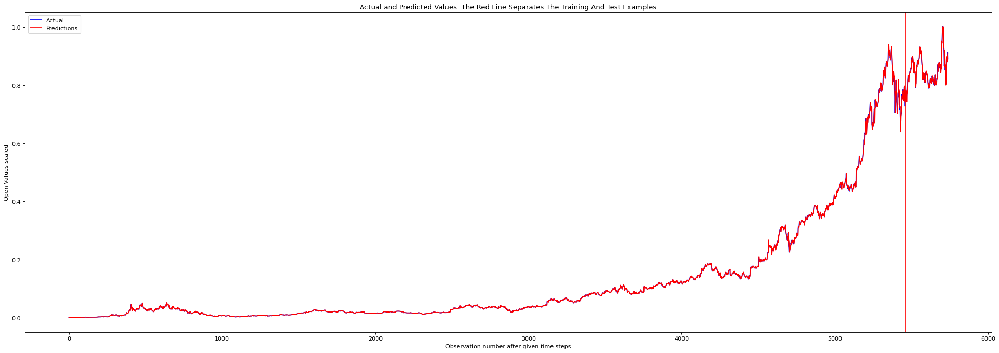

In [517]:
plot_result(y_train_reg, y_test_reg, train_preds, test_preds)

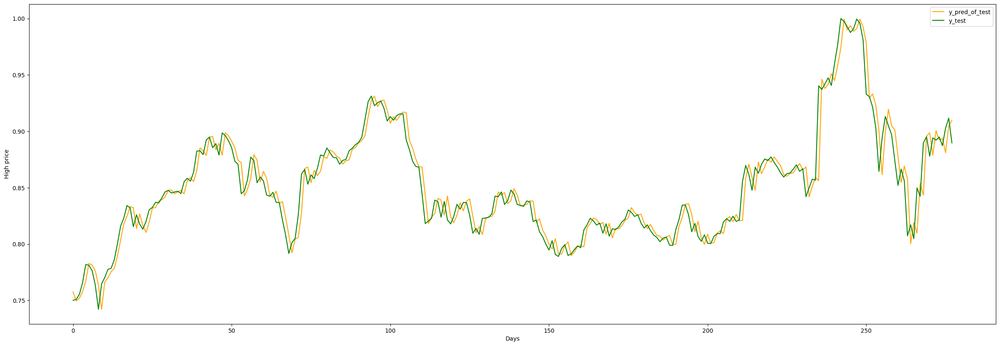

In [518]:
# visualisation
plt.figure(figsize = (30,10))
plt.plot(scaler_mv.inverse_transform(test_preds), label = "y_pred_of_test", c = "orange")
plt.plot(scaler_mv.inverse_transform(y_test_reg).reshape(-1,1), label = "y_test", c = "g")
plt.xlabel("Days")
plt.ylabel("High price")
plt.legend()             
plt.show()